In [34]:
import pandas as pd
import xarray as xr
import numpy as np
import netCDF4
# import nc_time_axis
import matplotlib.pyplot as plt
import glob
import cmocean
import xskillscore as xs
import datetime
# from sklearn.metrics import mean_squared_error

import h5py
from scipy.io import loadmat
from scipy import signal
from scipy.interpolate import griddata
import cartopy.crs as ccrs

In [35]:
## Working directory
wrk_dir = '~/work/OBS/dashcams_data/plotting_for_draft_supplementary/'

In [36]:
# load satellite data (2007-2021)

for iy in range(2020,2025):
    print(iy)
    with h5py.File(f'/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/model_satellite/sst_data/sst_{iy}_MUR.mat', 'r') as file:
        def print_attrs(name, obj):
            print(name)
            for key, val in obj.attrs.items():
                print(f"    {key}: {val}")
        
        sst0 = file['sst'][:]
        if iy < 2023:
            sst0=sst0-273.15
        
        # sst_mean = np.nanmean(np.nanmean(sst,axis=1),axis=1)
        if iy==2020:
            sst = sst0
        else:
            sst = np.concatenate((sst,sst0),axis=0)
            
            # sst_mean0 = np.concatenate((sst_mean0,sst_mean),axis=0)
            
        file.visititems(print_attrs)


2020
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'
2021
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'
2022
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'
2023
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'
2024
ilon1
    MATLAB_class: b'double'
jlat1
    MATLAB_class: b'double'
sst
    MATLAB_class: b'double'


In [37]:
lon0 = loadmat('/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/sst_lonlat_MUR.mat')['lon']
lat0 = loadmat('/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/sst_lonlat_MUR.mat')['lat']

ilon = loadmat('/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/sst_ilon_ilat_MUR.mat')['ilon1']
jlat = loadmat('/home/server/pi/homes/liux8/work/OBS/xliu_obs_process/sst_ilon_ilat_MUR.mat')['jlat1']

lon_mur = lon0[ilon[0,0].astype(int)-1:ilon[-1,0].astype(int)]
lat_mur = lat0[jlat[0,0].astype(int)-1:jlat[-1,0].astype(int)]

In [38]:
tdim = sst.shape[0]
print(tdim)
da_mur = xr.DataArray(sst, coords={'time': np.arange(0,tdim*86400,86400)+50*365*86400+12*86400,'lon': lon_mur[:,0] ,'lat': lat_mur[:,0]},
                  dims=['time','lat','lon'])

# da2_mur = da_mur.interp(lon=datasets_era[0].lonc,lat=datasets_era[0].latc,method='linear')

ds_mur = xr.Dataset({'sst': da_mur})
ds_mur['time'] = pd.to_datetime(ds_mur['time'].values,unit='s')
# ds_dust['time'] = pd.to_datetime(ds_dust['time'].values,unit='s')

1735


# load raw data

## can use NC file below directly

In [3]:
file1=wrk_dir+'PG_dive_raw_v1_longrec_keepGPS_BAHHASO23.csv'; ptime=165
# file1='surf_processed/Jul_Sep_2021.csv'; ptime=220
# file1='surf_processed/Oct_Dec_2021.csv'

# yr=file1[-21:-17]
# yr=file1[-13:-9]
df = pd.read_csv(file1,parse_dates=True,index_col='UTC_datetime')

/tmp/ipykernel_3996697/4255902347.py:7: DtypeWarning: Columns (5) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(file1,parse_dates=True,index_col='UTC_datetime')


In [4]:
df[(pd.to_datetime(df['date'])>=pd.to_datetime('2024-5-15 3:36'))&(pd.to_datetime(df['date'])<=pd.to_datetime('2024-5-15 9:42'))]

,device_id,UTC_date,UTC_time,datatype,satcount,Latitude,Longitude,UTC_timestamp,milliseconds,depth_m,ext_temperature_C,date
UTC_datetime,,,,,,,,,,,,
2024-05-15 03:57:29,237244,2024-05-15,03:57:29,GPS,9.0,27.398371,49.313900,2024-05-15 03:57:29.542,542,NaN,NaN,2024-05-15 03:57:29
2024-05-15 04:27:43,237244,2024-05-15,04:27:43,GPS,11.0,27.422407,49.301296,2024-05-15 04:27:43.000,0,NaN,NaN,2024-05-15 04:27:43
2024-05-15 04:57:53,237244,2024-05-15,04:57:53,GPS,9.0,27.422485,49.301346,2024-05-15 04:57:53.000,0,NaN,NaN,2024-05-15 04:57:53
2024-05-15 05:27:43,237244,2024-05-15,05:27:43,GPS,13.0,27.422592,49.301426,2024-05-15 05:27:43.000,0,NaN,NaN,2024-05-15 05:27:43
2024-05-15 05:58:49,237244,2024-05-15,05:58:49,GPS,0.0,0.000000,0.000000,2024-05-15 05:58:49.000,0,NaN,NaN,2024-05-15 05:58:49
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-15 09:41:56,237261,2024-05-15,09:41:56,SEND_ALL2_1Hz,NaN,NaN,NaN,2024-05-15 09:41:56.000,0,1.38,29.515625,2024-05-15 09:41:56
2024-05-15 09:41:57,237261,2024-05-15,09:41:57,SEND_ALL2_1Hz,NaN,NaN,NaN,2024-05-15 09:41:57.000,0,1.44,29.507812,2024-05-15 09:41:57
2024-05-15 09:41:58,237261,2024-05-15,09:41:58,SEND_ALL2_1Hz,NaN,NaN,NaN,2024-05-15 09:41:58.000,0,1.44,29.515625,2024-05-15 09:41:58


In [7]:
df['t'] = pd.to_datetime(df['date']) + pd.to_timedelta(df['milliseconds'], unit='ms')

In [8]:
df['date2'] = df['t']
df = df.set_index('t')
df

,device_id,UTC_date,UTC_time,datatype,satcount,Latitude,Longitude,UTC_timestamp,milliseconds,depth_m,ext_temperature_C,date,date2
t,,,,,,,,,,,,,
2023-11-03 07:11:53.000,237244,2023-11-03,07:11:53,GPS,5.0,25.751921,50.786697,2023-11-03 07:11:53.000,0,NaN,NaN,2023-11-03 07:11:53,2023-11-03 07:11:53.000
2023-11-03 07:39:05.000,237244,2023-11-03,07:39:05,GPS,8.0,25.757145,50.784084,2023-11-03 07:39:05.000,0,NaN,NaN,2023-11-03 07:39:05,2023-11-03 07:39:05.000
2023-11-03 08:08:42.290,237244,2023-11-03,08:08:42,GPS,8.0,25.757200,50.784069,2023-11-03 08:08:42.290,290,NaN,NaN,2023-11-03 08:08:42,2023-11-03 08:08:42.290
2023-11-03 08:38:41.307,237244,2023-11-03,08:38:41,GPS,8.0,25.757296,50.784126,2023-11-03 08:38:41.307,307,NaN,NaN,2023-11-03 08:38:41,2023-11-03 08:38:41.307
2023-11-03 09:08:47.381,237244,2023-11-03,09:08:47,GPS,5.0,25.757057,50.784569,2023-11-03 09:08:47.381,381,NaN,NaN,2023-11-03 09:08:47,2023-11-03 09:08:47.381
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-26 04:44:41.000,237263,2024-04-26,04:44:41,GPS,0,0.000000,0.000000,2024-04-26 04:44:41.000,0,NaN,NaN,2024-04-26 04:44:41,2024-04-26 04:44:41.000
2024-04-26 19:15:00.000,237263,2024-04-26,19:15:00,GPS,0,0.000000,0.000000,2024-04-26 19:15:00.000,0,NaN,NaN,2024-04-26 19:15:00,2024-04-26 19:15:00.000
2024-04-26 21:15:00.000,237263,2024-04-26,21:15:00,GPSS,0,0.000000,0.000000,2024-04-26 21:15:00.000,0,NaN,NaN,2024-04-26 21:15:00,2024-04-26 21:15:00.000


In [9]:
df[(df['date2']>=pd.to_datetime('2024-5-23 1:21'))&(df['date2']<=pd.to_datetime('2024-5-23 6:50'))]

,device_id,UTC_date,UTC_time,datatype,satcount,Latitude,Longitude,UTC_timestamp,milliseconds,depth_m,ext_temperature_C,date,date2
t,,,,,,,,,,,,,
2024-05-23 01:22:16.142,237244,2024-05-23,01:22:16,GPS,7.0,28.181320,48.647095,2024-05-23 01:22:16.142,142,NaN,NaN,2024-05-23 01:22:16,2024-05-23 01:22:16.142
2024-05-23 01:52:14.139,237244,2024-05-23,01:52:14,GPS,8.0,28.181309,48.647182,2024-05-23 01:52:14.139,139,NaN,NaN,2024-05-23 01:52:14,2024-05-23 01:52:14.139
2024-05-23 02:22:14.115,237244,2024-05-23,02:22:14,GPS,6.0,28.181368,48.647263,2024-05-23 02:22:14.115,115,NaN,NaN,2024-05-23 02:22:14,2024-05-23 02:22:14.115
2024-05-23 02:52:17.128,237244,2024-05-23,02:52:17,GPS,7.0,28.180109,48.649544,2024-05-23 02:52:17.128,128,NaN,NaN,2024-05-23 02:52:17,2024-05-23 02:52:17.128
2024-05-23 03:22:17.134,237244,2024-05-23,03:22:17,GPS,5.0,28.165495,48.690716,2024-05-23 03:22:17.134,134,NaN,NaN,2024-05-23 03:22:17,2024-05-23 03:22:17.134
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-05-23 04:24:05.000,237261,2024-05-23,04:24:05,GPS,9.0,26.193813,50.607162,2024-05-23 04:24:05.000,0,NaN,NaN,2024-05-23 04:24:05,2024-05-23 04:24:05.000
2024-05-23 04:53:41.975,237261,2024-05-23,04:53:41,GPS,8.0,26.193798,50.607140,2024-05-23 04:53:41.975,975,NaN,NaN,2024-05-23 04:53:41,2024-05-23 04:53:41.975
2024-05-23 05:23:43.978,237261,2024-05-23,05:23:43,GPS,7.0,26.193743,50.607178,2024-05-23 05:23:43.978,978,NaN,NaN,2024-05-23 05:23:43,2024-05-23 05:23:43.978


In [33]:
# df1 = df.loc[df['device_id']==203013]

# x = xr.DataArray(df.Longitude_1, dims="t")
# y = xr.DataArray(df.Latitude_1, dims="t")
time = xr.DataArray(df.date2, dims="t")
did = xr.DataArray(df.device_id, dims="t")
# accx = xr.DataArray(df.acc_x,dims='t')
# accy = xr.DataArray(df.acc_y,dims='t')
# accz = xr.DataArray(df.acc_z,dims='t')
lon = xr.DataArray(df.Longitude,dims='t')
lat = xr.DataArray(df.Latitude,dims='t')
datatype = xr.DataArray(df.datatype,dims='t')
depth = xr.DataArray(df.depth_m,dims='t')
temp = xr.DataArray(df.ext_temperature_C, dims="t")
# conduc = xr.DataArray(df['conductivity_mS/cm'], dims="t")

ds_obs = xr.Dataset({
    # 'x': x,
    # 'y': y,
    'time': time,
    'id': did,
    # 'accx': accx,
    # 'accy': accy,
    # 'accz': accz,
    'lon': lon,
    'lat': lat,
    'datatype': datatype,
    'depth': depth,
    'temp': temp,
    # 'cond': conduc
})

In [34]:
ds_obs.to_netcdf('PG_acc_raw_v1_keep_gps_BAHHASO23.nc')

# load NC files

In [439]:
ds_obs = xr.open_dataset(wrk_dir+'PG_acc_raw_v1_keep_gps_BAHHASO23.nc',mode='r')
ds_obs

FileNotFoundError: [Errno 2] No such file or directory: b'/home/server/pi/homes/liux8/work/GETM/scripts_ms2/waves_analysis/PG_acc_raw_v1_keep_gps_BAHHASO23.nc'

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


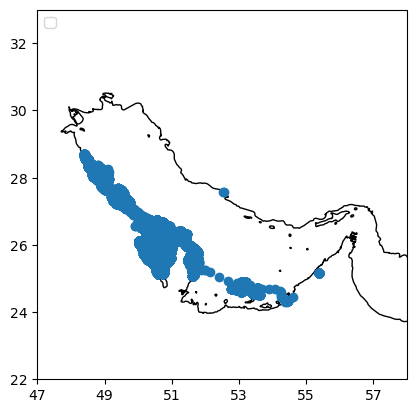

In [40]:
### OLD version
ax = plt.axes(projection=ccrs.PlateCarree())
plt.plot(ds_obs.lon,ds_obs.lat,'o')

ax.coastlines()
ax.set_xlim(47,58)
ax.set_ylim(22,33)
ax.set_xticks(np.arange(47,58,2), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(22,33,2), crs=ccrs.PlateCarree())
ax.legend(loc = "upper left")

(22.0, 33.0)

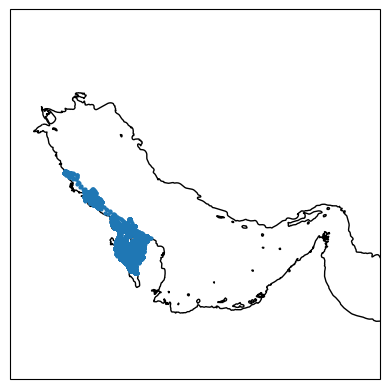

In [41]:
ax = plt.axes(projection=ccrs.PlateCarree())
plt.plot(ds_obs.lon.where(ds_obs.id==237244),ds_obs.lat,'o',markersize=2)
# plt.plot([x_geobox[0],x_geobox[0],x_geobox[1],x_geobox[1],x_geobox[0]],[y_geobox[1],y_geobox[0],y_geobox[0],y_geobox[1],y_geobox[1]])

ax.coastlines()
ax.set_xlim(47,58)
ax.set_ylim(22,33)
# ax.set_xlim(x_geobox[0]-0.1,x_geobox[1]+0.1)
# ax.set_ylim(y_geobox[0]-0.1,y_geobox[1]+0.1)

In [99]:
print( 'tags in the Persian Gulf:' , np.unique(ds_obs.id))

tags in the Persian Gulf: [237244 237245 237246 237247 237248 237249 237250 237251 237252 237253
 237254 237255 237256 237257 237258 237259 237260 237261 237262 237263]


237244
<xarray.DataArray 'time' (t: 632765)>
array(['2023-11-03T07:11:53.000000000', '2023-11-03T07:39:05.000000000',
       '2023-11-03T08:08:42.290000000', ...,
       '2025-03-10T04:06:39.000000000', '2025-03-10T04:36:34.453000000',
       '2025-03-10T05:06:44.000000000'], dtype='datetime64[ns]')
Coordinates:
  * t        (t) datetime64[ns] 2023-11-03T07:11:53 ... 2025-03-10T05:06:44
237245
<xarray.DataArray 'time' (t: 1551514)>
array(['2023-11-03T06:30:35.000000000', '2023-11-03T06:58:07.000000000',
       '2023-11-03T07:27:59.840000000', ...,
       '2025-03-09T22:04:31.000000000', '2025-03-10T00:04:35.000000000',
       '2025-03-10T01:37:43.000000000'], dtype='datetime64[ns]')
Coordinates:
  * t        (t) datetime64[ns] 2023-11-03T06:30:35 ... 2025-03-10T01:37:43
237246
<xarray.DataArray 'time' (t: 135519)>
array(['2023-11-03T06:15:43.000000000', '2023-11-03T06:41:35.843000000',
       '2023-11-03T07:11:36.861000000', ...,
       '2024-01-14T09:07:49.000000000', '2024-01-14T09:3

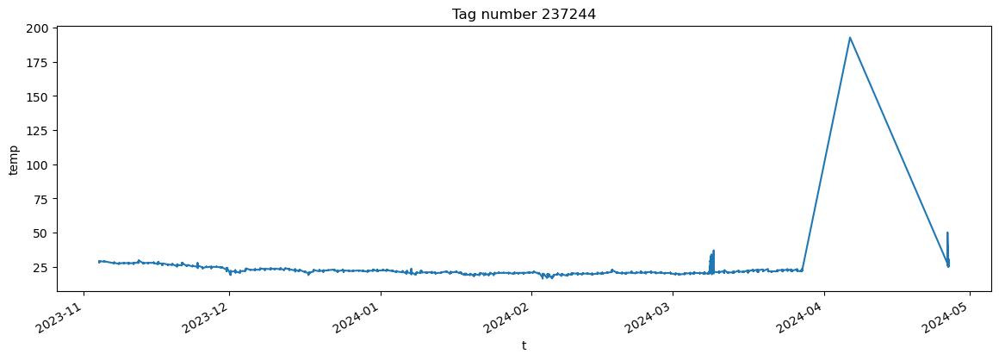

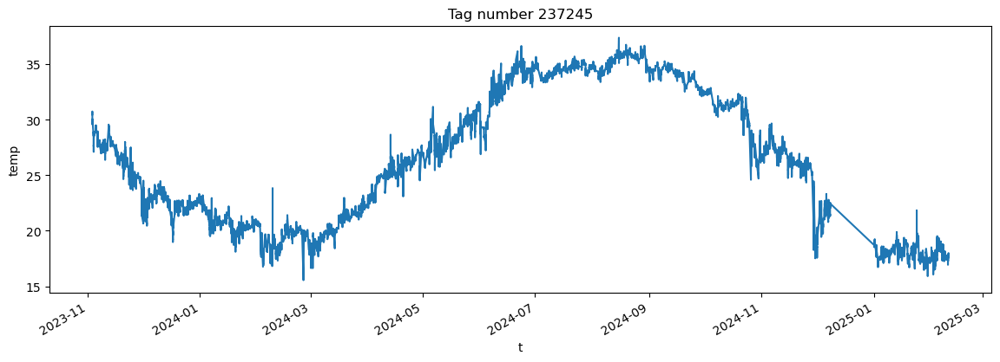

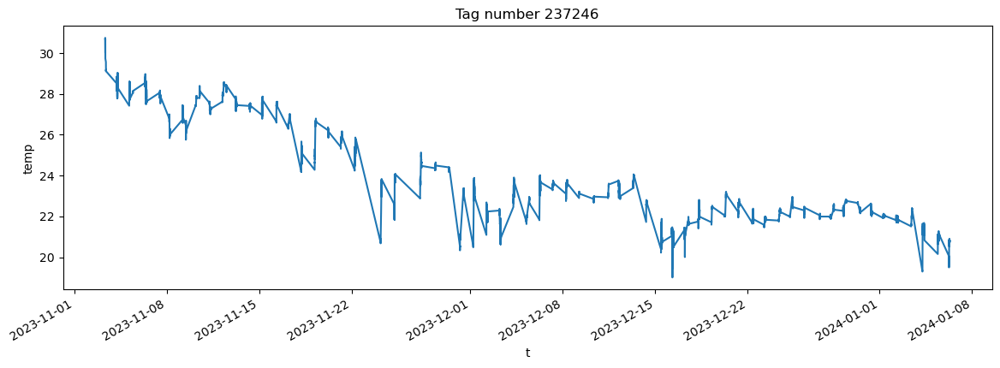

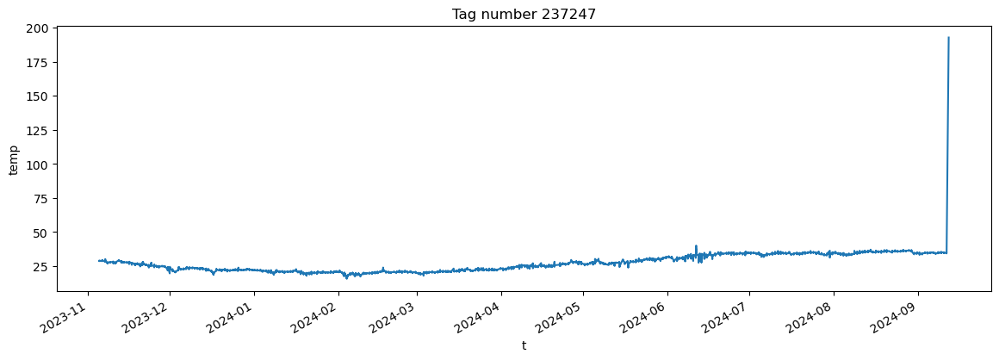

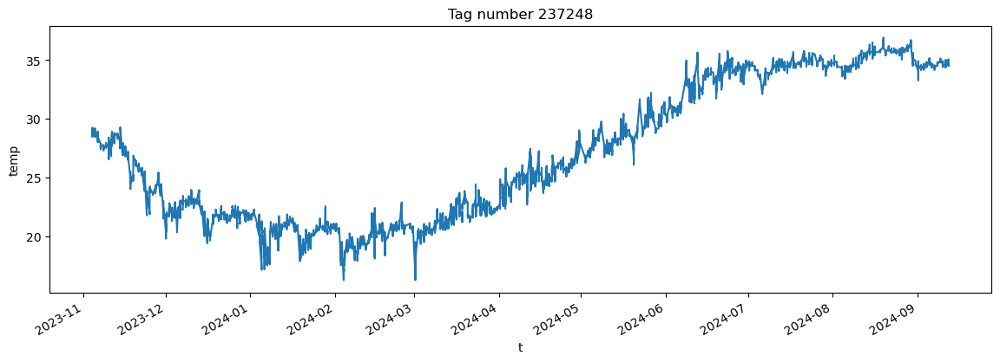

...

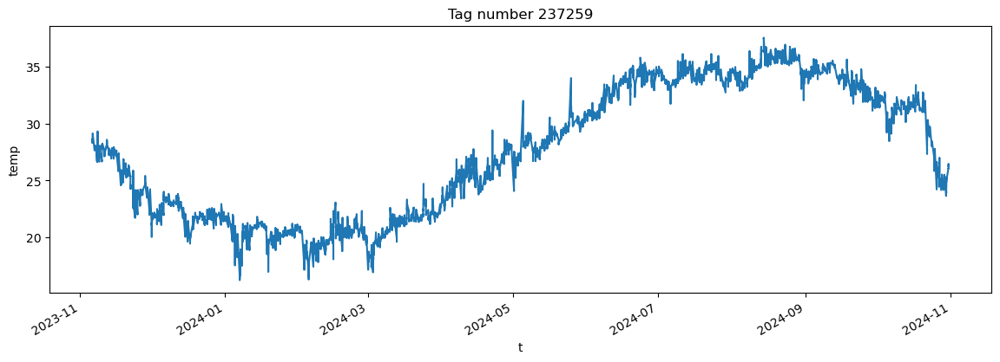

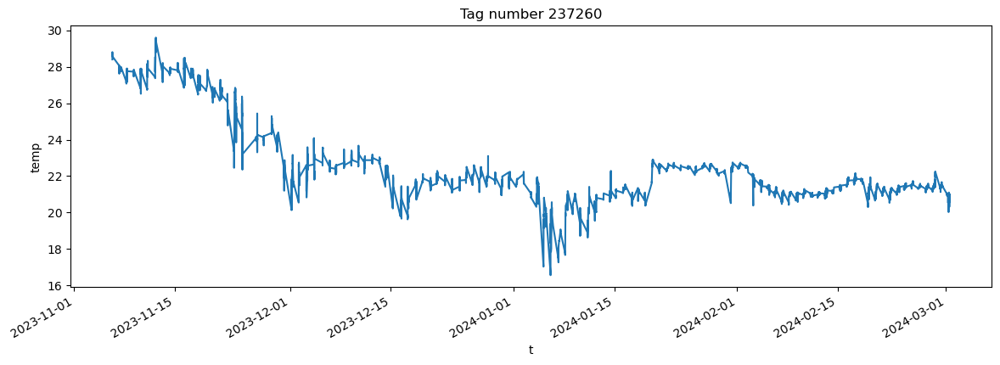

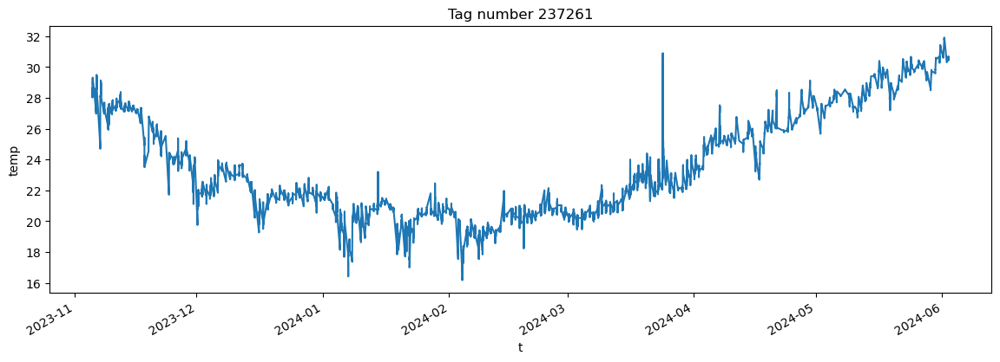

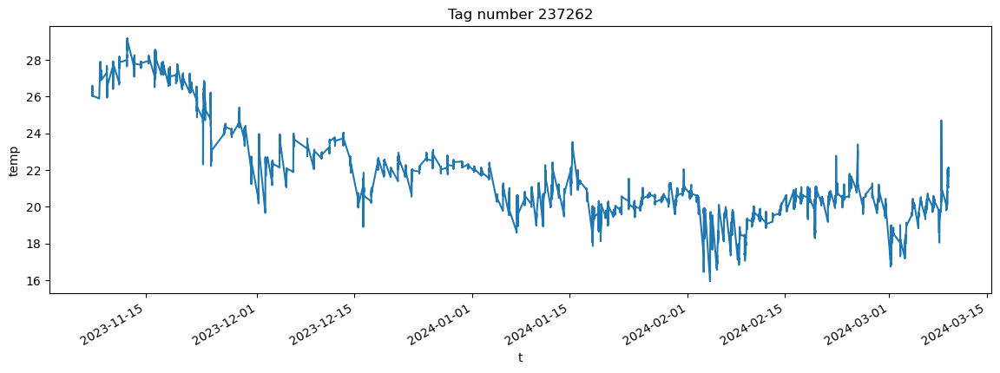

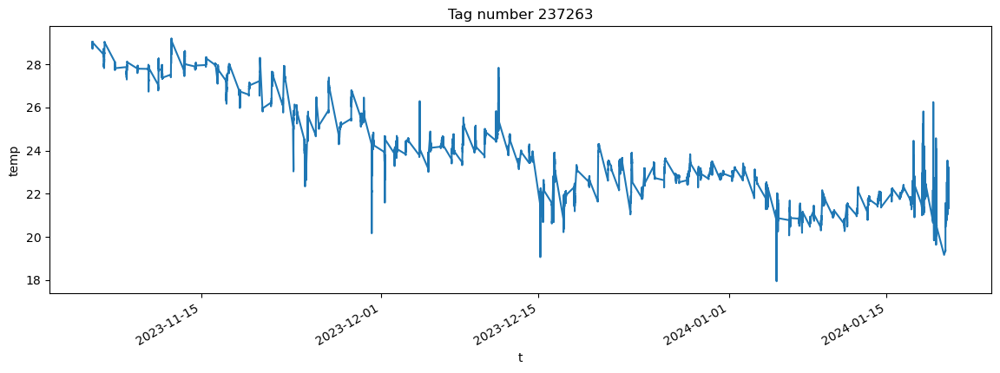

In [115]:
for i in np.unique(ds_obs.id):
    print(i)
    ds_obs_1 = ds_obs.where((ds_obs.id == i),drop=True)
    print(ds_obs_1.time)
    plt.figure(figsize=(14,4))
    ds_obs_1.where(ds_obs_1.datatype=='SEND_ALL2_1Hz',drop=True).temp.plot()
    plt.title(f'Tag number {i}')

    # break

# calculate the total number of SEND_ALL2_1HZ, data for all tags

## Take TAG 237244 as an example

In [116]:
# pick a tag with its id number 191989
# ds_obs_1 is the dataset for the tag 191989

for idn in [np.unique(ds_obs.id)[4]]:
    print(idn)

    ds_obs_1 = ds_obs.where((ds_obs.id == idn),drop=True)
    # Create a new integer coordinate
    new_t = np.arange(len(ds_obs_1['t']))

    # Optionally, store the original time as a data variable for reference
    ds_obs_1 = ds_obs_1.assign(original_time=('time_index', ds_obs_1['t'].values))

    # Assign the new integer coordinate while keeping the original as a variable
    ds_obs_1 = ds_obs_1.assign_coords(t=new_t).rename({'t': 'time_index'})

    # assign a new variable 'mask' (with NaNs)
    ds_obs_1 = ds_obs_1.assign(mask=(('time_index',), np.full(ds_obs_1.dims['time_index'], np.nan)))

237248


In [117]:
# Find the indices where 'datatype' is 'GPS'
# list the "indices" where the difference between two consecutive indices is greater than 10
# assign a new mask for each of these indices

gps_indices = ds_obs_1.time_index.where((ds_obs_1.datatype == 'GPS')|(ds_obs_1.datatype == 'GPSS')|(ds_obs_1.datatype == 'GPSD'), drop=True).values.astype(int)
# print(gps_indices[:400])

indices = [(i, j, j-i) for i, j in zip(gps_indices[:-1], gps_indices[1:]) if j - i > 10]
imask = 0
for idx in indices:
    print(idx)
    ds_obs_1['mask'].loc[dict(time_index=slice(idx[0], idx[1]))] = imask
    imask = imask+1

print(imask)

(32, 94, 62)
(96, 139, 43)
(140, 167, 27)
(168, 183, 15)
(184, 197, 13)
(198, 229, 31)
(237, 275, 38)
(276, 570, 294)
(570, 618, 48)
(618, 658, 40)
(659, 719, 60)
(720, 745, 25)
(777, 819, 42)
(820, 835, 15)
(836, 851, 15)
(852, 885, 33)
(886, 927, 41)
(928, 944, 16)
(944, 987, 43)
(988, 1022, 34)
(1023, 1049, 26)
(1050, 1100, 50)
(1101, 1132, 31)
(1132, 1188, 56)
(1189, 1253, 64)
(1254, 1277, 23)
(1278, 1311, 33)
(1312, 1337, 25)
(1338, 1371, 33)
(1372, 1451, 79)
(1453, 1485, 32)
(1486, 1522, 36)
(1523, 1553, 30)
(1554, 1579, 25)
(1580, 1612, 32)
(1613, 1684, 71)
(1684, 1722, 38)
(1723, 1753, 30)
(1754, 1791, 37)
(1792, 1838, 46)
(1839, 1884, 45)
(1885, 1925, 40)
(1926, 1974, 48)
(1976, 2011, 35)
(2012, 2051, 39)
(2052, 2094, 42)
(2095, 2119, 24)
(2120, 2142, 22)
(2143, 2175, 32)
(2176, 2219, 43)
(2220, 2258, 38)
(2259, 2298, 39)
(2299, 2335, 36)
(2347, 2389, 42)
(2390, 2428, 38)
(2429, 2468, 39)
(2469, 2506, 37)
(2507, 2533, 26)
(2534, 2565, 31)
(2566, 2609, 43)
(2610, 2626, 16)
(262

In [118]:
# Define indices_inbox list
indices_inbox = []
ds_obs_1['mask2'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
ds_obs_1['lon_bef'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
ds_obs_1['lat_bef'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
ds_obs_1['lon_end'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
ds_obs_1['lat_end'] = xr.DataArray(np.zeros(ds_obs_1.dims['time_index']), dims='time_index')
imask = 0

# ax = plt.axes(projection=ccrs.PlateCarree())
# first find the indices whose GPS location is in the box
for idx in indices:
    p1 = ds_obs_1.isel(time_index=idx[0])
    p2 = ds_obs_1.isel(time_index=idx[1])

    # if (p1.lon>x_geobox[0])&(p1.lon<x_geobox[1])&(p1.lat>y_geobox[0])&(p1.lat<y_geobox[1]):
    #     if (p2.lon>x_geobox[0])&(p2.lon<x_geobox[1])&(p2.lat>y_geobox[0])&(p2.lat<y_geobox[1]):
            # print(idx)
            # indices_inbox.append(idx)
            # print(p1.lon.values, p1.lat.values)
            # print(p2.lon.values, p2.lat.values)
            # plt.plot([p1.lon.values,p2.lon.values], [p1.lat.values,p2.lat.values],'o')
            # Check if records between idx[0] and idx[1] have the datatype SEN_ALL_1Hz_START and SEN_ALL_1Hz_END
    if 'SEND_ALL2_1Hz' in ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1])).values:
        # Find pairs of 'SEND_ALL2_1Hz_START' and 'SEND_ALL2_1Hz_END' in ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1]))
        start_indices = ds_obs_1.time_index.where(ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1])) == 'SEND_ALL2_1Hz_START', drop=True).values.astype(int)
        end_indices = ds_obs_1.time_index.where(ds_obs_1.datatype.isel(time_index=slice(idx[0], idx[1])) == 'SEND_ALL2_1Hz_END', drop=True).values.astype(int)
        
        # Ensure that each start has a corresponding end
        for start, end in zip(start_indices, end_indices):
            if start < end:
                ds_obs_1['mask2'].loc[dict(time_index=slice(start, end))] = imask
                ds_obs_1['lon_bef'].loc[dict(time_index=slice(start, end))] = p1.lon.values
                ds_obs_1['lat_bef'].loc[dict(time_index=slice(start, end))] = p1.lat.values
                ds_obs_1['lon_end'].loc[dict(time_index=slice(start, end))] = p2.lon.values
                ds_obs_1['lat_end'].loc[dict(time_index=slice(start, end))] = p2.lat.values
                imask += 1
        # ds_obs_1['mask2'].loc[dict(time_index=slice(idx[0], idx[1]))] = xr.where(
        #     ds_obs_1.datatype.isin(['SEND_ALL2_1Hz', 'SEND_ALL2_1Hz_START', 'SEND_ALL2_1Hz_END','SEND_ALL2_1Hz_START_END']).loc[dict(time_index=slice(idx[0], idx[1]))],
        #     imask,
        #     ds_obs_1['mask2'].loc[dict(time_index=slice(idx[0], idx[1]))]
        # )
        # imask += 1

        # print(p1.lon.values, p1.lat.values)
        # print(p2.lon.values, p2.lat.values)
        # plt.plot([p1.lon.values,p2.lon.values], [p1.lat.values,p2.lat.values],'o')

ax.coastlines()
ax.set_xlim(47,58)
ax.set_ylim(22,33)
ax.set_xticks(np.arange(47,58,3), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(22,33,2), crs=ccrs.PlateCarree())
# ax.legend(loc = "upper left")

# for idx in indices:
#     # print(dfs.loc[idx[0]:idx[1]])
#     dfs_chunk = dfs.loc[idx[0]:idx[1]]
#     sen_start = dfs_chunk[(dfs_chunk['datatype'] == 'SEN_ALL_1Hz_START')]
#     sen_end = dfs_chunk[(dfs_chunk['datatype'] == 'SEN_ALL_1Hz_END')]
#     print(sen_start,sen_end)

#     if not sen_start.empty and not sen_end.empty:
#         chunk_acc = dfs_chunk.loc[sen_start.index[0]:sen_end.index[0]]
#         if 'chunk_acc' in locals():
#             chunk_acc = pd.concat([chunk_acc, dfs_chunk.loc[sen_start.index[0]:sen_end.index[0]]])
#         else:
#             chunk_acc = dfs_chunk.loc[sen_start.index[0]:sen_end.index[0]]

1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds
1000000000 nanoseconds


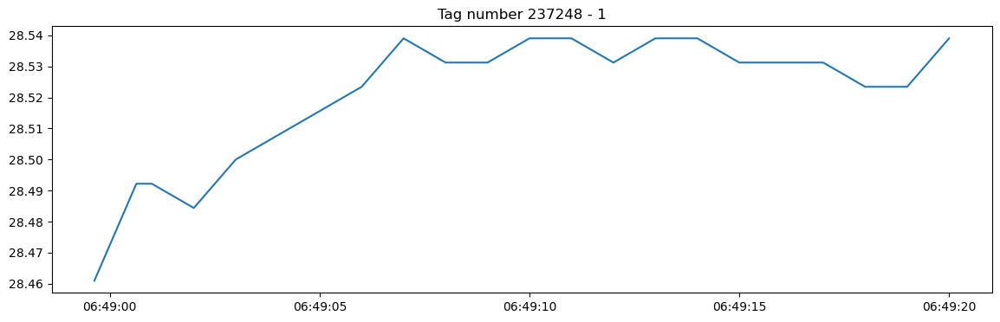

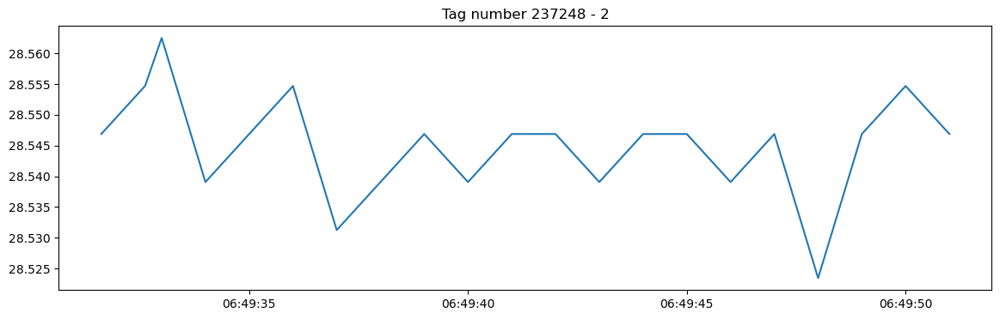

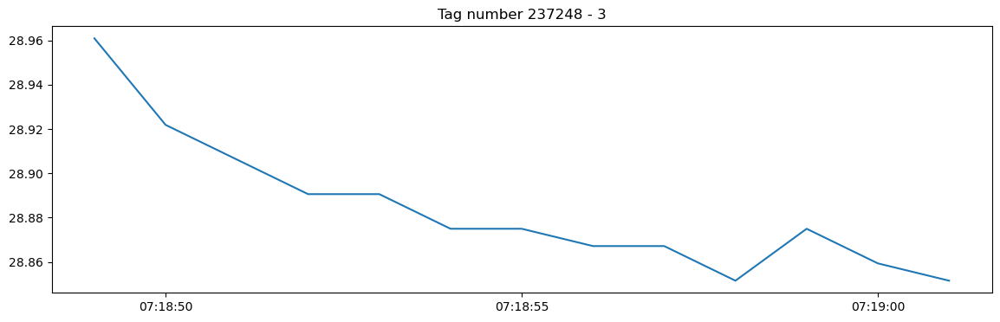

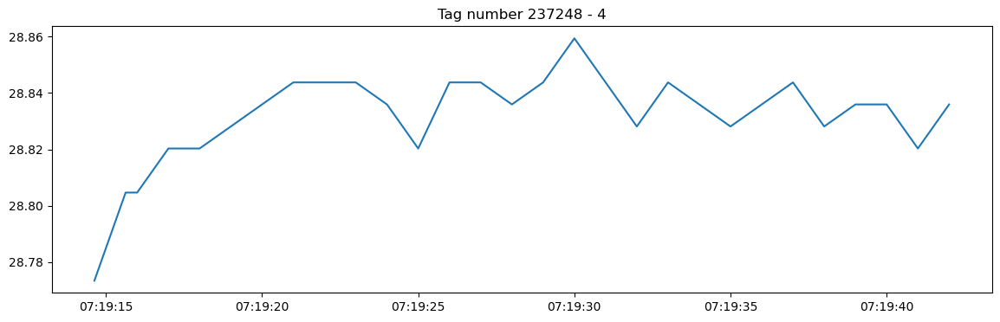

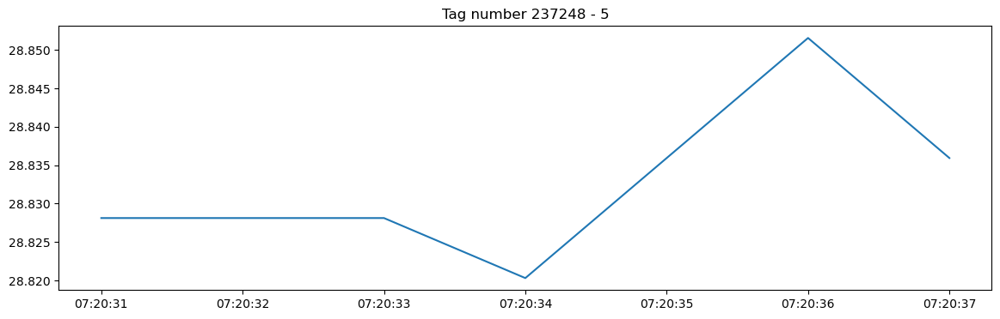

...

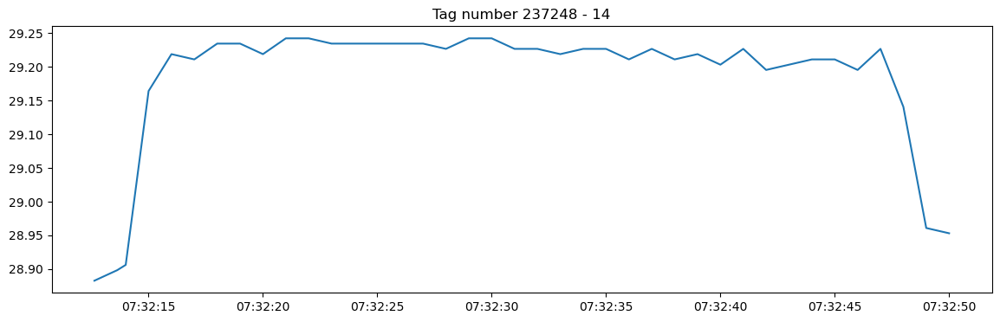

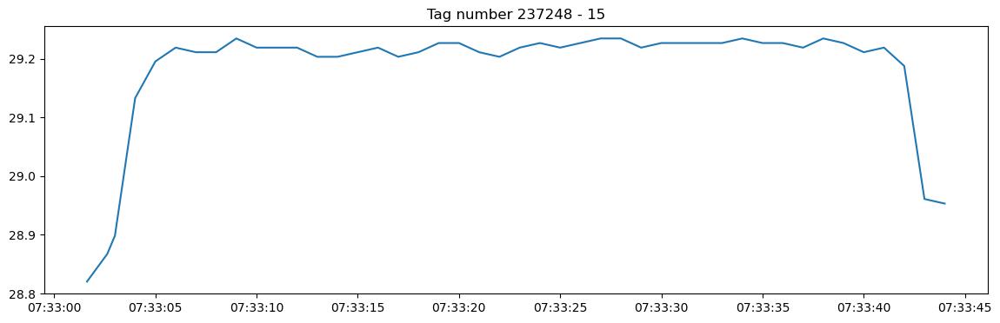

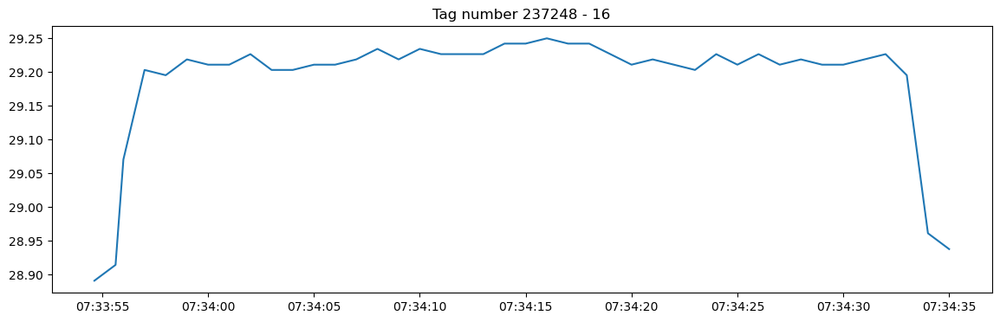

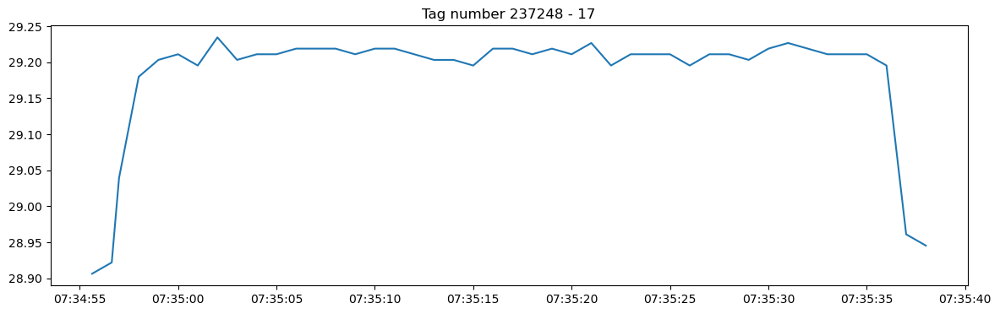

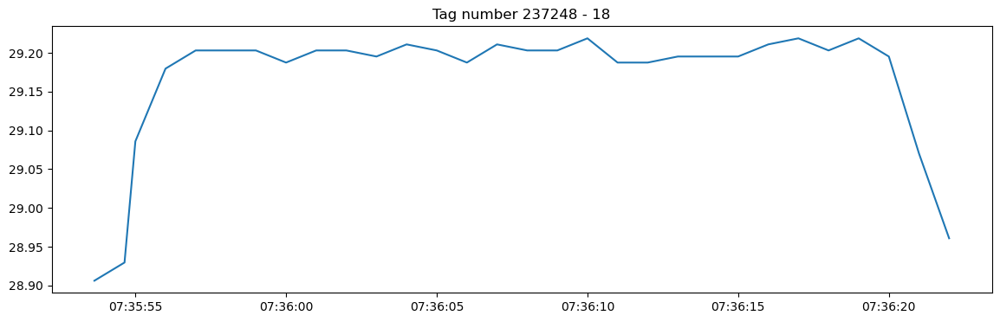

In [119]:
for ik in range(18):
    plt.figure(figsize=(14,4))
    plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).temp)
    # plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).depth)
    plt.title(f'Tag number {idn} - {ik+1}')
    print(np.max(np.diff(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).time)))

[1.76 2.34 3.95 4.54 4.47 4.47 4.44 4.38 4.41 4.44 4.44 4.35 4.41 4.29
 4.2  4.11 4.32 4.38 4.38 4.47 4.5  3.67 2.1  0.25] 4.54
17.0
24
[2.69 3.48 4.38 4.32 4.38 4.41 4.44 4.44 4.44 4.41 4.47 4.44 4.41 4.41
 4.44 4.41 4.47 4.47 4.44 4.44 4.44 4.44 4.44 4.44 4.47 4.41 4.47 4.44
 4.47 4.41 4.44 4.44 4.44 4.35 4.44 4.44 4.44 4.41 4.11 4.35 4.44 4.41
 4.41 4.23 3.36 1.82 0.  ] 4.47
41.0
47
[3.21 4.02 4.47 4.44 4.47 4.44 4.47 4.47 4.44 4.5  4.44 4.35 4.44 4.44
 4.47 4.47 4.44 4.47 4.47 4.44 4.47 4.47 4.5  4.47 4.44 4.41 4.5  4.44
 4.41 4.47 4.5  4.47 4.47 4.41 4.44 4.44 3.83 2.6  0.99] 4.5
33.51
39
[3.32 4.49 5.36 5.91 6.03 5.97 5.97 5.94 5.94 6.   5.97 5.97 6.   5.88
 5.94 6.   5.88 5.94 5.97 5.91 5.97 5.97 6.03 6.   6.   6.   5.94 6.
 5.45 4.13 2.56 0.82] 6.03
24.0
32
[2.59 3.08 4.25 5.36 5.82 5.94 5.91 5.94 5.94 5.91 5.88 5.88 5.82 5.76
 5.82 5.91 5.97 5.94 5.97 5.97 5.94 5.97 5.85 4.98 3.54 1.87 0.24] 5.97
18.0
27
[2.69 3.71 4.44 5.09 5.45 5.55 5.62 5.62 5.65 5.68 5.74 5.74 5.65 5.59
 5

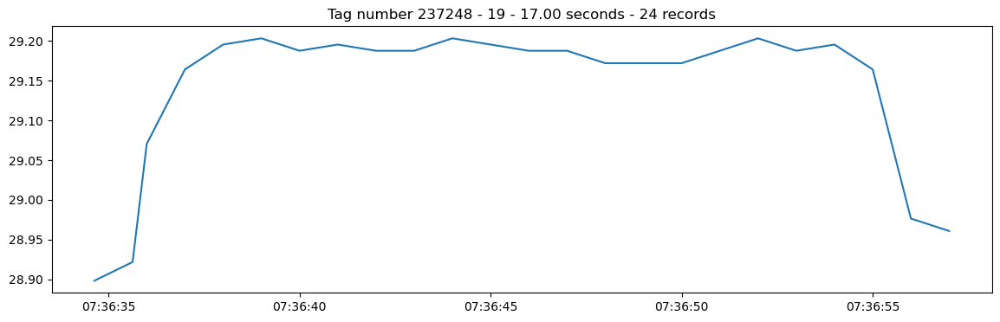

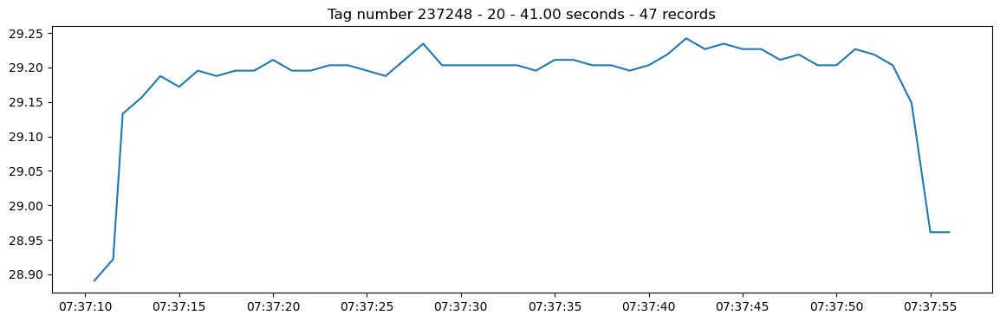

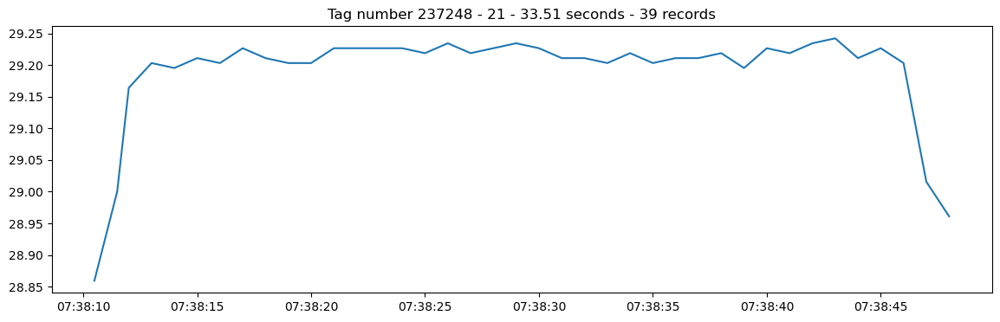

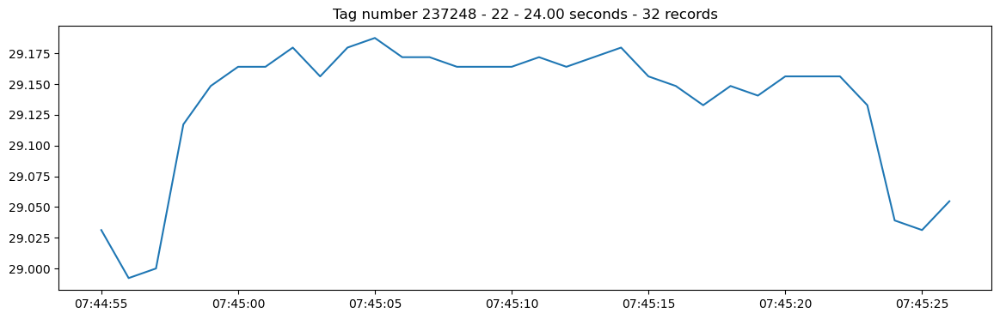

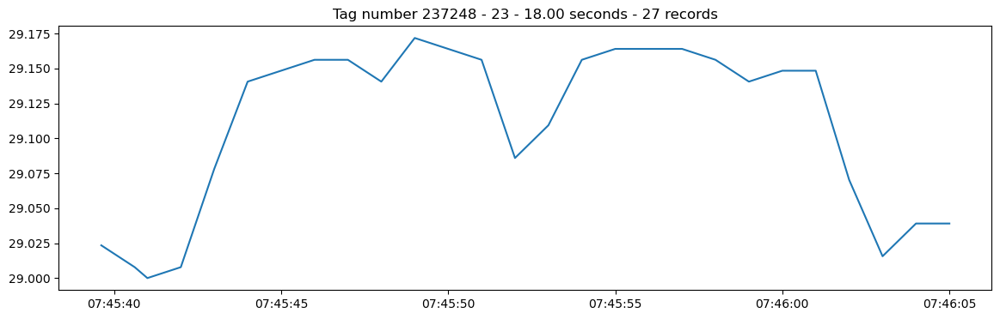

...

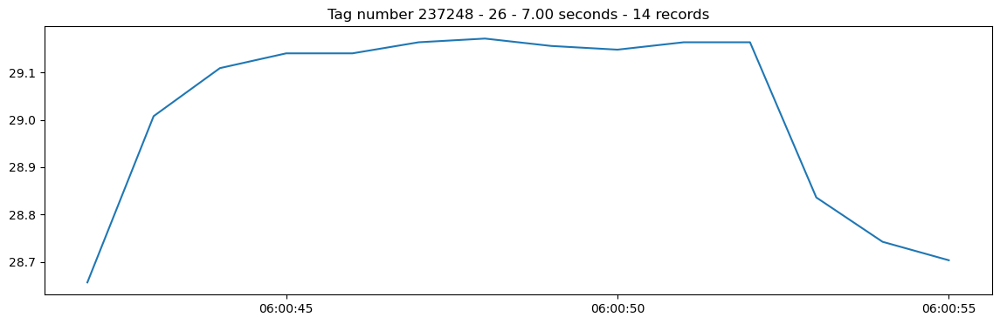

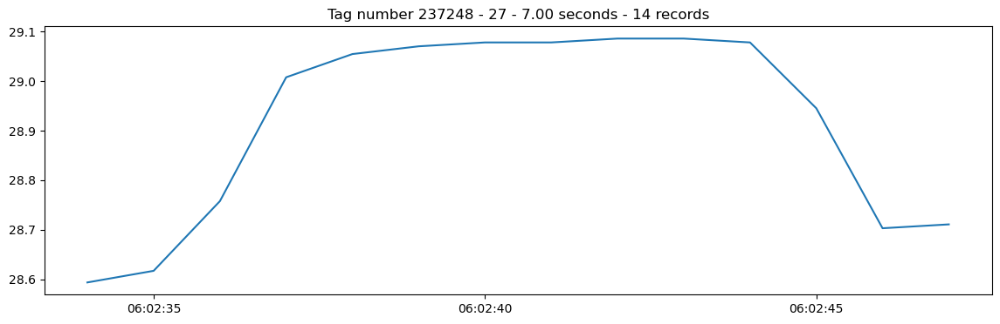

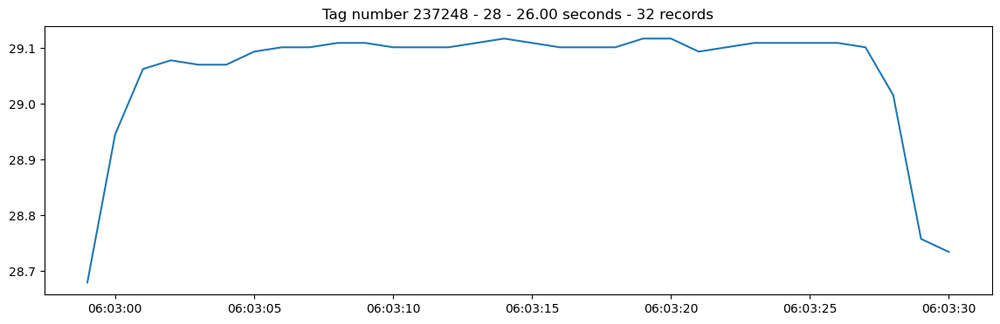

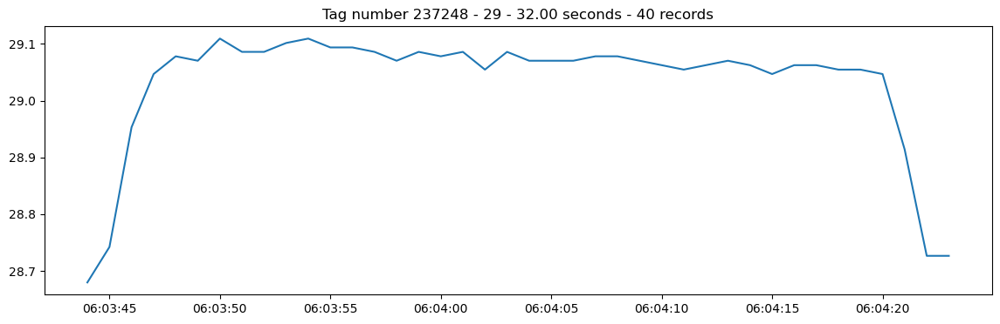

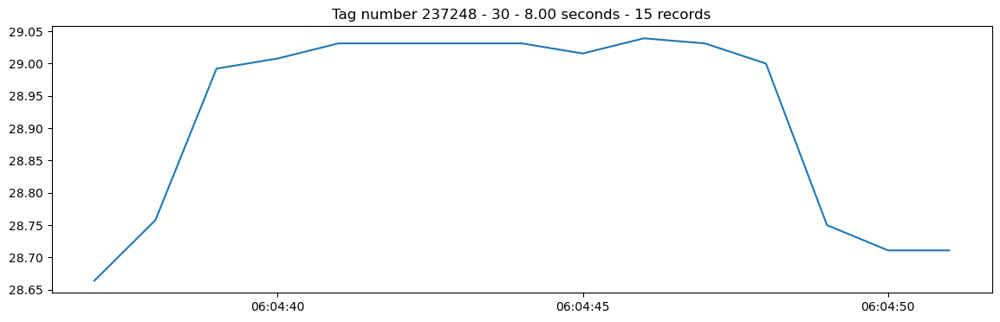

In [120]:
# Initialize the new variables in ds_obs_1
ds_obs_1['first_record'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')
ds_obs_1['last_record'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')
ds_obs_1['dtb'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')

for ik in range(18,30):
    plt.figure(figsize=(14,4))
    # plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).temp)
    profile0 = ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True)
    dd = profile0.depth
    dnmax = np.max(dd)
    print(dd.values,dnmax.values)
    nn = len(dd[dd - dnmax <= 0.5])
    first_record = dd[abs(dd - dnmax)<=0.5].time_index.values[0]
    last_record = dd[abs(dd - dnmax) <= 0.5].time_index.values[-1]
    dtb = profile0.original_time.sel(time_index=last_record) - profile0.original_time.sel(time_index=first_record)
    dtb_seconds = dtb.values/np.timedelta64(1, 's')
    print(dtb_seconds)
    print(nn)
    plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).temp)
    plt.title(f'Tag number {idn} - {ik+1} - {dtb_seconds:.2f} seconds - {nn} records')
    ds_obs_1['first_record'] = xr.where(ds_obs_1.mask2 == ik+1, first_record, ds_obs_1.first_record)
    ds_obs_1['last_record'] = xr.where(ds_obs_1.mask2 == ik+1, last_record, ds_obs_1.last_record)
    ds_obs_1['dtb'] = xr.where(ds_obs_1.mask2 == ik+1, dtb_seconds, ds_obs_1.dtb)

In [121]:
np.unique(ds_obs_1.mask2)

array([0.0000e+00, 1.0000e+00, 2.0000e+00, ..., 3.0259e+04, 3.0260e+04,
       3.0261e+04])

In [77]:
# Initialize the new variables in ds_obs_1
# ds_obs_1['first_record'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')
# ds_obs_1['last_record'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')
# ds_obs_1['dtb'] = xr.DataArray(np.full(ds_obs_1.dims['time_index'], np.nan), dims='time_index')

# Create an empty pandas DataFrame to store the results
pd_dive = pd.DataFrame(columns=['ik', 'first_record', 'last_record', 'dtb', 'dmax','T_surf','T_bot'])
for ik in np.unique(ds_obs_1.mask2)[1:]:  ### omit 0_start from 1 ___
# for ik in range(30):
    if ik % 100 == 0:
        print(f'Processing mask2 value: {ik}')
    # plt.figure(figsize=(14,4))
    # plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).temp)
    profile0 = ds_obs_1.where(ds_obs_1.mask2==ik,drop=True)
    dd = profile0.depth
    dnmax = np.max(dd).values
    # print(dd.values,dnmax.values)
    nn = len(dd[dd - dnmax <= 0.5])
    first_record = dd[abs(dd - dnmax)<=0.5].time_index.values[0]
    last_record = dd[abs(dd - dnmax) <= 0.5].time_index.values[-1]
    # dtb = (profile0.original_time.sel(time_index=last_record) - profile0.original_time.sel(time_index=first_record)).values/np.timedelta64(1, 's')
    temp_surf = profile0.temp.isel(time_index=-1).values
    temp_surf0 = profile0.temp.isel(time_index=0).values
    # temp_bot = profile0.temp.sel(time_index=last_record).values
    # print(dtb_seconds)
    # print(nn)
    # plt.plot(ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).original_time,ds_obs_1.where(ds_obs_1.mask2==ik+1,drop=True).depth)
    # plt.title(f'Tag number {idn} - {ik+1} - {dtb_seconds:.2f} seconds - {nn} records')
    # ds_obs_1['first_record'] = xr.where(ds_obs_1.mask2 == ik+1, first_record, ds_obs_1.first_record)
    # ds_obs_1['last_record'] = xr.where(ds_obs_1.mask2 == ik+1, last_record, ds_obs_1.last_record)
    # ds_obs_1['dtb'] = xr.where(ds_obs_1.mask2 == ik+1, dtb, ds_obs_1.dtb)

    # Store ik, first_record, last_record, dtb to a pandas DataFrame
    # if 'pd_dive' not in globals():
    #     pd_dive = pd.DataFrame(columns=['ik', 'first_record', 'last_record', 'dtb'])

    # pd_dive = pd.concat([pd_dive, pd.DataFrame({'ik': [ik], 'first_record': [first_record], 'last_record': [last_record], 'dtb': [dtb], 'dmax': [dnmax],'T_surf':[temp_surf],'T_bot':[temp_bot]})], ignore_index=True)
    pd_dive = pd.concat([pd_dive, pd.DataFrame({'ik': [ik], 'first_record': [first_record], 'last_record': [last_record], 'dmax': [dnmax],'T_surf':[temp_surf],'T_surf0':[temp_surf0]})], ignore_index=True)

Processing mask2 value: 100.0
Processing mask2 value: 200.0
Processing mask2 value: 300.0
Processing mask2 value: 400.0
Processing mask2 value: 500.0
Processing mask2 value: 600.0
Processing mask2 value: 700.0
Processing mask2 value: 800.0
Processing mask2 value: 900.0
Processing mask2 value: 1000.0
Processing mask2 value: 1100.0
Processing mask2 value: 1200.0
Processing mask2 value: 1300.0
Processing mask2 value: 1400.0
Processing mask2 value: 1500.0
Processing mask2 value: 1600.0
Processing mask2 value: 1700.0
Processing mask2 value: 1800.0
Processing mask2 value: 1900.0
Processing mask2 value: 2000.0
Processing mask2 value: 2100.0
Processing mask2 value: 2200.0
Processing mask2 value: 2300.0
Processing mask2 value: 2400.0
Processing mask2 value: 2500.0
Processing mask2 value: 2600.0
Processing mask2 value: 2700.0
Processing mask2 value: 2800.0
Processing mask2 value: 2900.0
Processing mask2 value: 3000.0
Processing mask2 value: 3100.0
Processing mask2 value: 3200.0
Processing mask2 

In [78]:
pd_dive['lon'] = ds_obs_1.lon_end.isel(time_index=pd_dive['last_record'].values.astype(int)).values
pd_dive['lat'] = ds_obs_1.lat_end.isel(time_index=pd_dive['last_record'].values.astype(int)).values
pd_dive['time'] = ds_obs_1.original_time.isel(time_index=pd_dive['last_record'].values.astype(int)).values
pd_dive['T_bot'] = ds_obs_1.temp.isel(time_index=pd_dive['last_record'].values.astype(int)).values

pd_dive['rec_len'] = pd_dive['last_record']-pd_dive['first_record']
pd_dive

,ik,first_record,last_record,dtb,dmax,T_surf,T_bot,T_surf0,lon,lat,time,rec_len
0,1.0,64,68,NaN,2.91,28.2109375,28.101562,28.2578125,50.780949,25.729845,2023-11-04 06:51:35,4
1,2.0,74,93,NaN,3.04,28.0390625,28.039062,28.140625,50.780949,25.729845,2023-11-04 06:52:05,19
2,3.0,99,128,NaN,2.98,28.0390625,28.015625,28.0390625,50.780411,25.730028,2023-11-04 06:52:49,29
3,4.0,134,149,NaN,1.46,28.3828125,28.406250,28.359375,50.781914,25.724712,2023-11-04 06:54:27,15
4,5.0,153,181,NaN,1.32,28.3671875,28.367188,28.34375,50.781803,25.724785,2023-11-04 06:55:54,28
...,...,...,...,...,...,...,...,...,...,...,...,...
19602,19603.0,609245,609485,NaN,132.56,30.5546875,30.554688,30.28125,50.417881,25.488762,2024-04-26 14:32:49,240
19603,19604.0,609486,609726,NaN,132.56,30.546875,30.546875,30.59375,50.417881,25.488762,2024-04-26 14:40:51,240
19604,19605.0,609727,609967,NaN,132.56,30.359375,30.359375,30.46875,50.417881,25.488762,2024-04-26 14:48:55,240
19605,19606.0,609968,610208,NaN,132.56,30.03125,30.031250,30.21875,50.417881,25.488762,2024-04-26 14:56:59,240


,ik,first_record,last_record,dtb,dmax,T_surf,T_bot,lon,lat,time
0,1.0,64,68,NaN,2.91,28.2109375,28.101562,50.780949,25.729845,2023-11-04 06:51:35
1,2.0,74,93,NaN,3.04,28.0390625,28.039062,50.780949,25.729845,2023-11-04 06:52:05
2,3.0,99,128,NaN,2.98,28.0390625,28.015625,50.780411,25.730028,2023-11-04 06:52:49
3,4.0,134,149,NaN,1.46,28.3828125,28.406250,50.781914,25.724712,2023-11-04 06:54:27
4,5.0,153,181,NaN,1.32,28.3671875,28.367188,50.781803,25.724785,2023-11-04 06:55:54
...,...,...,...,...,...,...,...,...,...,...
19602,19603.0,609245,609485,NaN,132.56,30.5546875,30.554688,50.417881,25.488762,2024-04-26 14:32:49
19603,19604.0,609486,609726,NaN,132.56,30.546875,30.546875,50.417881,25.488762,2024-04-26 14:40:51
19604,19605.0,609727,609967,NaN,132.56,30.359375,30.359375,50.417881,25.488762,2024-04-26 14:48:55
19605,19606.0,609968,610208,NaN,132.56,30.03125,30.031250,50.417881,25.488762,2024-04-26 14:56:59


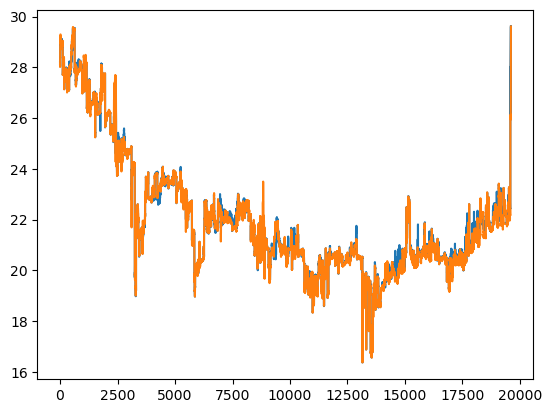

In [55]:
pd_dive[pd_dive['T_surf']<30].T_surf.astype(float).plot()
pd_dive[pd_dive['T_surf']<30].T_bot.astype(float).plot()
pd_dive

<Axes: >

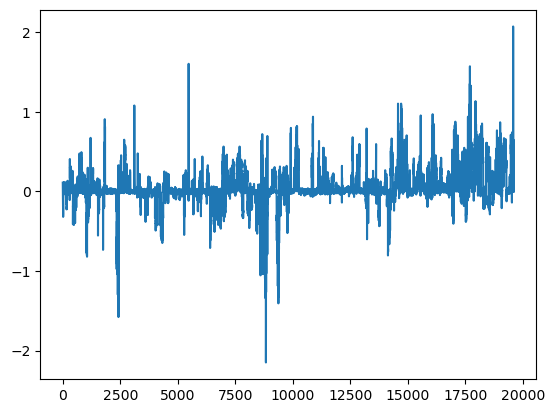

In [104]:
# pd_dive[pd_dive['T_surf']<50].T_surf.astype(float).plot()
(pd_dive[pd_dive['T_surf']<50].T_surf-pd_dive[pd_dive['T_surf']<50].T_bot).astype(float).plot()

In [105]:
pd_dive.to_csv(wrk_dir+'dive_profile_PG_acc_raw_v1_keep_gps_BAHHASO23.csv')

In [106]:
pd_dive = pd.read_csv('dive_profile_PG_acc_raw_v1_keep_gps_BAHHASO23.csv',parse_dates=True,index_col='time')
pd_dive

,Unnamed: 0,ik,first_record,last_record,dtb,dmax,T_surf,T_bot,T_surf0,lon,lat,rec_len
time,,,,,,,,,,,,
2023-11-04 06:51:35,0,1.0,64,68,NaN,2.91,28.210938,28.101562,28.257812,50.780949,25.729845,4
2023-11-04 06:52:05,1,2.0,74,93,NaN,3.04,28.039062,28.039062,28.140625,50.780949,25.729845,19
2023-11-04 06:52:49,2,3.0,99,128,NaN,2.98,28.039062,28.015625,28.039062,50.780411,25.730028,29
2023-11-04 06:54:27,3,4.0,134,149,NaN,1.46,28.382812,28.406250,28.359375,50.781914,25.724712,15
2023-11-04 06:55:54,4,5.0,153,181,NaN,1.32,28.367188,28.367188,28.343750,50.781803,25.724785,28
...,...,...,...,...,...,...,...,...,...,...,...,...
2024-04-26 14:32:49,19602,19603.0,609245,609485,NaN,132.56,30.554688,30.554688,30.281250,50.417881,25.488762,240
2024-04-26 14:40:51,19603,19604.0,609486,609726,NaN,132.56,30.546875,30.546875,30.593750,50.417881,25.488762,240
2024-04-26 14:48:55,19604,19605.0,609727,609967,NaN,132.56,30.359375,30.359375,30.468750,50.417881,25.488762,240


In [107]:
ds_dive = xr.Dataset.from_dataframe(pd_dive)
ds_dive

<xarray.Dataset>
Dimensions:       (time: 19607)
Coordinates:
  * time          (time) datetime64[ns] 2023-11-04T06:51:35 ... 2024-04-26T15...
Data variables:
    Unnamed: 0    (time) int64 0 1 2 3 4 5 ... 19602 19603 19604 19605 19606
    ik            (time) float64 1.0 2.0 3.0 ... 1.96e+04 1.961e+04 1.961e+04
    first_record  (time) int64 64 74 99 134 153 ... 609486 609727 609968 610209
    last_record   (time) int64 68 93 128 149 181 ... 609726 609967 610208 610449
    dtb           (time) float64 nan nan nan nan nan nan ... nan nan nan nan nan
    dmax          (time) float64 2.91 3.04 2.98 1.46 ... 132.6 132.6 132.6 132.6
    T_surf        (time) float64 28.21 28.04 28.04 28.38 ... 30.36 30.03 29.61
    T_bot         (time) float64 28.1 28.04 28.02 28.41 ... 30.36 30.03 29.61
    T_surf0       (time) float64 28.26 28.14 28.04 28.36 ... 30.47 30.22 29.76
    lon           (time) float64 50.78 50.78 50.78 50.78 ... 50.42 50.42 50.42
    lat           (time) float64 25.73 25.73 25.73 25.72 ... 25.49 25.49 25.49
    rec_len       (time) int64 4 19 29 15 28 22 14 ... 240 240 240 240 240 240

In [59]:
ds_mur_sec1=ds_mur.sst.sel(time=slice(ds_dive.time.min(),ds_dive.time.max()),lon=slice(47,58),lat=slice(22,33))


In [81]:
# UAE 2020
# ds_obs1_rnan = ds_obs1.where((ds_obs1.x>10)&(ds_obs1.y>10)&(ds_obs1.temp<40)&(ds_obs1.temp>10)&(ds_obs1.temp!=31.2421875),drop=True)

# ds_mur_sec1=ds_mur.sst.sel(time=slice(pd_dive.time.min(),pd_dive.time.max()))

fmm1=ds_mur_sec1.interp(lon=ds_dive.lon,lat=ds_dive.lat,time=ds_dive.time) #original

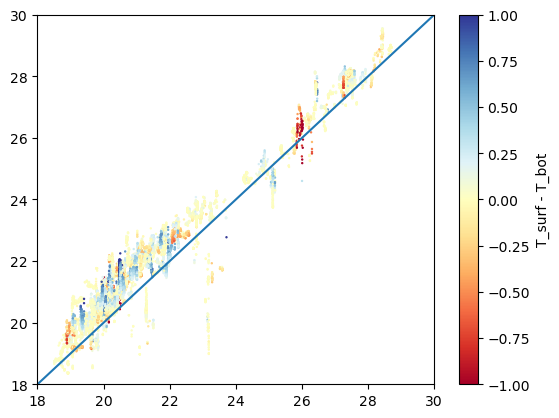

In [82]:
# plot ALL THE DATA (((BEFORE interpolation)))
# ds_obs1_rnan.temp.plot()
# (fmm-273.15).plot()
plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.T_surf - ds_dive.T_bot, cmap='RdYlBu', s=0.5,vmax=1,vmin=-1)
# plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.last_record - ds_dive.first_record, cmap='RdBu', s=1)

plt.colorbar(label='T_surf - T_bot')
# plt.colorbar(label='record length (seconds)')



plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])

# print(np.sqrt(np.mean(fmm-ds_obs_rnan1.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan2.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan3.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan4.temp)**2).values)

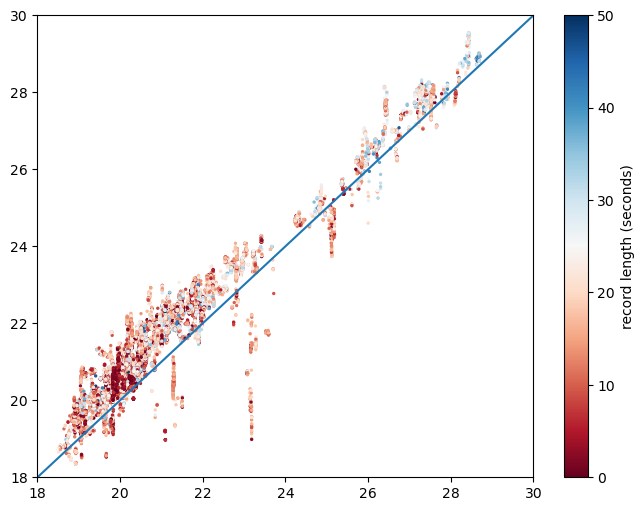

In [76]:
# plot ALL THE DATA (((BEFORE interpolation)))
# ds_obs1_rnan.temp.plot()
# (fmm-273.15).plot()
# plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.T_surf - ds_dive.T_bot, cmap='RdBu', s=0.5,vmax=1,vmin=-1)
plt.figure(figsize=(8,6))
plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.last_record - ds_dive.first_record, cmap='RdBu', s=2,vmax=50)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len<30).T_surf, cmap='RdBu', s=2,vmax=50)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len>30).T_surf, cmap='RdBu', s=2,vmax=50)

# plt.colorbar(label='T_surf - T_bot')
plt.colorbar(label='record length (seconds)')

plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])

# print(np.sqrt(np.mean(fmm-ds_obs_rnan1.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan2.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan3.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan4.temp)**2).values)

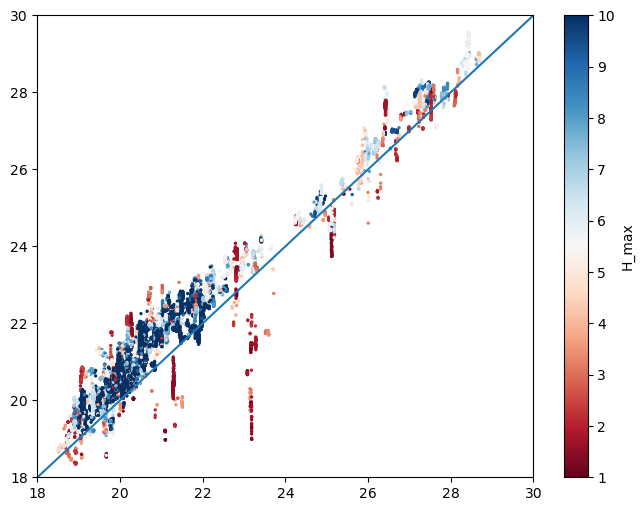

In [74]:
plt.figure(figsize=(8,6))
# plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.last_record - ds_dive.first_record, cmap='RdBu', s=2,vmax=50)
plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.dmax, cmap='RdBu', s=2,vmax=10)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len>30).T_surf, cmap='RdBu', s=2,vmax=50)

plt.colorbar(label='H_max (m)')
# plt.colorbar(label='record length (seconds)')

plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])

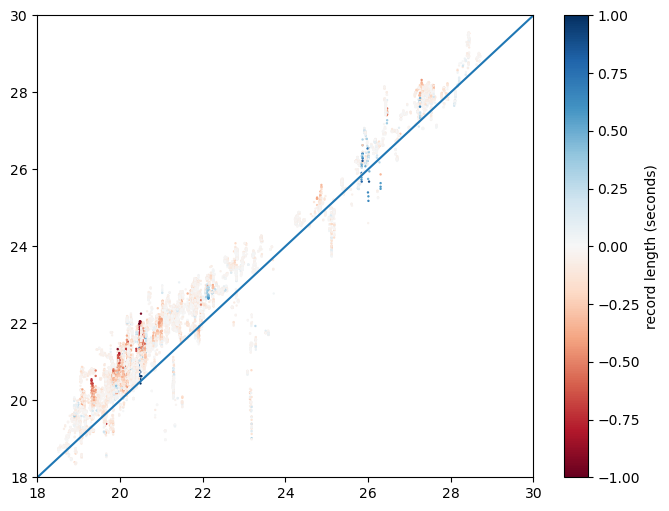

In [95]:
# plot ALL THE DATA (((BEFORE interpolation)))
# ds_obs1_rnan.temp.plot()
# (fmm-273.15).plot()
plt.figure(figsize=(8,6))
plt.scatter(fmm1, ds_dive.T_surf, c=ds_dive.T_surf0 - ds_dive.T_surf, cmap='RdBu', s=0.5,vmax=1,vmin=-1)
# plt.scatter(fmm1, ds_dive.T_surf, c=(ds_dive.T_surf0 - ds_dive.T_surf)/np.exp(ds_dive.rec_len.astype(float)), cmap='RdBu',vmax=0.001,vmin=-0.001,s=1)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len<30).T_surf, cmap='RdBu', s=2,vmax=50)
# plt.scatter(fmm1, ds_dive.where(ds_dive.rec_len>30).T_surf, cmap='RdBu', s=2,vmax=50)

# plt.colorbar(label='T_surf - T_bot')
plt.colorbar(label='record length (seconds)')

plt.xlim([18, 30]),plt.ylim([18, 30])
plt.plot([18,37],[18,37])

# print(np.sqrt(np.mean(fmm-ds_obs_rnan1.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan2.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan3.temp)**2).values)
# print(np.sqrt(np.mean(fmm-ds_obs_rnan4.temp)**2).values)

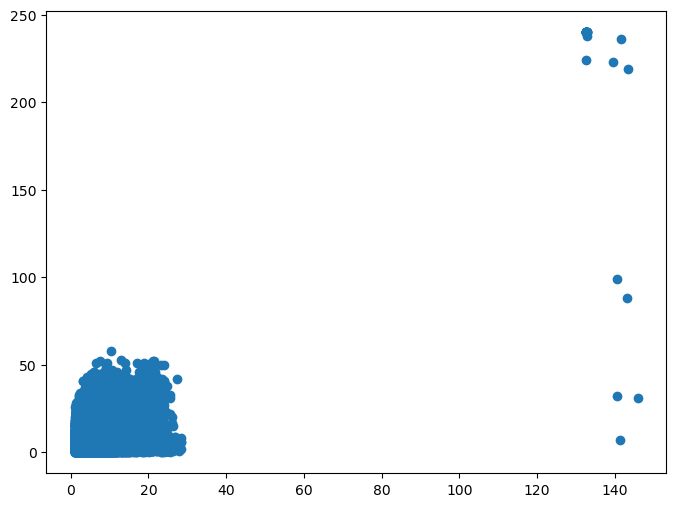

In [96]:

plt.figure(figsize=(8,6))
plt.scatter( ds_dive.dmax,ds_dive.rec_len)

# all tags

In [16]:
# For all tags in the box

# for idn in [np.unique(ds_obs_crm_box.id)]:
    # print(idn)

# ds_obs_1 = ds_obs.where((ds_obs.id == idn),drop=True)
# Create a new integer coordinate
new_t = np.arange(len(ds_obs['t']))

# Optionally, store the original time as a data variable for reference
ds_obs = ds_obs.assign(original_time=('time_index', ds_obs['t'].values))

# Assign the new integer coordinate while keeping the original as a variable
ds_obs = ds_obs.assign_coords(t=new_t).rename({'t': 'time_index'})

# assign a new variable 'mask' (with NaNs)
ds_obs = ds_obs.assign(mask=(('time_index',), np.full(ds_obs.dims['time_index'], np.nan)))

In [17]:
gps_indices_a = ds_obs.time_index.where(ds_obs.datatype == 'GPS', drop=True).values.astype(int)
# print(gps_indices[:400])

indices = [(i, j, j-i) for i, j in zip(gps_indices_a[:-1], gps_indices_a[1:]) if j - i > 10]
imask = 0
for idx in indices:
    print(idx)
    ds_obs['mask'].loc[dict(time_index=slice(idx[0], idx[1]))] = imask
    imask = imask+1

print(imask)

(233, 1164, 931)
(1170, 3571, 2401)
(3576, 5977, 2401)
(5982, 6980, 998)
(6984, 7033, 49)
(7036, 7056, 20)
(7062, 9463, 2401)
(9468, 11869, 2401)
(11874, 13001, 1127)
(13007, 15408, 2401)
(15413, 17814, 2401)
(17819, 18828, 1009)
(18832, 18881, 49)
(18888, 19053, 165)
(19059, 20260, 1201)
(20265, 21466, 1201)
(21471, 21832, 361)
(21836, 21959, 123)
(21959, 22512, 553)
(22512, 22566, 54)
(22567, 22668, 101)
(22668, 22740, 72)
(22742, 23943, 1201)
(23943, 23981, 38)
(23992, 25193, 1201)
(25197, 25257, 60)
(25263, 26464, 1201)
(26469, 27670, 1201)
(27675, 28160, 485)
(28164, 28187, 23)
(28187, 28305, 118)
(28305, 28329, 24)
(28329, 28421, 92)
(28421, 28471, 50)
(28471, 28490, 19)
(28492, 29693, 1201)
(29698, 30899, 1201)
(30904, 31300, 396)
(31306, 32507, 1201)
(32512, 33713, 1201)
(33718, 34113, 395)
(34119, 35320, 1201)
(35325, 36526, 1201)
(36531, 36996, 465)
(37002, 38203, 1201)
(38208, 39337, 1129)
(39340, 39736, 396)
(39742, 40943, 1201)
(40948, 42149, 1201)
(42154, 42549, 395)
(425

In [18]:
lon_lat_indices_1 = ds_obs.isel(time_index=np.array(indices)[:,0])
lon_lat_indices_1 = lon_lat_indices_1.assign_coords(index_local=("time_index", np.arange(len(lon_lat_indices_1["time_index"]))))

lon_lat_indices_2 = ds_obs.isel(time_index=np.array(indices)[:,1])
lon_lat_indices_2 = lon_lat_indices_2.assign_coords(index_local=("time_index", np.arange(len(lon_lat_indices_2["time_index"]))))

lon_lat_indices_1_in_box = lon_lat_indices_1.where(
    (lon_lat_indices_1.lon > x_geobox[0]) & (lon_lat_indices_1.lon < x_geobox[1]) &
    (lon_lat_indices_1.lat > y_geobox[0]) & (lon_lat_indices_1.lat < y_geobox[1]),
    drop=True
)
lon_lat_indices_2_in_box = lon_lat_indices_2.where(
    (lon_lat_indices_2.lon > x_geobox[0]) & (lon_lat_indices_2.lon < x_geobox[1]) &
    (lon_lat_indices_2.lat > y_geobox[0]) & (lon_lat_indices_2.lat < y_geobox[1]),
    drop=True
)
# lon_lat_indices_1_in_box

common_indices = np.intersect1d(lon_lat_indices_1_in_box.index_local, lon_lat_indices_2_in_box.index_local)


In [2]:
print(lon_lat_indices_1_in_box.where(lon_lat_indices_1_in_box.index_local==common_indices[1],drop=True).time_index.values)
print(lon_lat_indices_2_in_box.where(lon_lat_indices_2_in_box.index_local==common_indices[1],drop=True).time_index.values)

NameError: name 'lon_lat_indices_1_in_box' is not defined

In [1]:
# Define indices_inbox list
indices_inbox_a = []
ds_obs['mask2'] = xr.DataArray(np.zeros(ds_obs.dims['time_index']), dims='time_index')
ds_obs['x1'] = xr.DataArray(np.zeros(ds_obs.dims['time_index']), dims='time_index')
ds_obs['y1'] = xr.DataArray(np.zeros(ds_obs.dims['time_index']), dims='time_index')
ds_obs['x2'] = xr.DataArray(np.zeros(ds_obs.dims['time_index']), dims='time_index')
ds_obs['y2'] = xr.DataArray(np.zeros(ds_obs.dims['time_index']), dims='time_index')
imask = 0

ax = plt.axes(projection=ccrs.PlateCarree())
# first find the indices whose GPS location is in the box
# for idx in indices:
for idx2 in common_indices:
#     print(idx2)
    idx = (lon_lat_indices_1_in_box.where(lon_lat_indices_1_in_box.index_local==idx2,drop=True).time_index.values[0],
            lon_lat_indices_2_in_box.where(lon_lat_indices_2_in_box.index_local==idx2,drop=True).time_index.values[0])
    # p1 = ds_obs.isel(time_index=idx[0])
    p1 = ds_obs.isel(time_index=idx[0])
    p2 = ds_obs.isel(time_index=idx[1])

    # if (x_geobox[0] < p1.lon.values < x_geobox[1]) & (y_geobox[0] < p1.lat.values < y_geobox[1]) & \
    #    (x_geobox[0] < p2.lon.values < x_geobox[1]) & (y_geobox[0] < p2.lat.values < y_geobox[1]):
    #         indices_inbox_a.append(idx)
            # Check if records between idx[0] and idx[1] have the datatype SEN_ALL_1Hz_START and SEN_ALL_1Hz_END
    if 'SEN_ALL_5Hz' in ds_obs.datatype.isel(time_index=slice(idx[0], idx[1])).values:
        ds_obs['mask2'].loc[dict(time_index=slice(idx[0], idx[1]))] = xr.where(
            ds_obs.datatype.isin(['SEN_ALL_5Hz', 'SEN_ALL_5Hz_START', 'SEN_ALL_5Hz_END']).loc[dict(time_index=slice(idx[0], idx[1]))],
            imask,
            ds_obs['mask2'].loc[dict(time_index=slice(idx[0], idx[1]))]
        )
        ds_obs['x1'].loc[dict(time_index=slice(idx[0], idx[1]))] = p1.lon.values
        ds_obs['y1'].loc[dict(time_index=slice(idx[0], idx[1]))] = p1.lat.values
        ds_obs['x2'].loc[dict(time_index=slice(idx[0], idx[1]))] = p2.lon.values
        ds_obs['y2'].loc[dict(time_index=slice(idx[0], idx[1]))] = p2.lat.values
        imask += 1
        print(idx2, idx,p1.id.values,p1.lon.values, p1.lat.values,p2.lon.values, p2.lat.values)
        plt.plot([p1.lon.values,p2.lon.values], [p1.lat.values,p2.lat.values],'ok')

ax.coastlines()
# ax.set_xlim(-125,-123)
# ax.set_ylim(44,47)
ax.set_xticks(np.arange(-124.7,-124,0.3), crs=ccrs.PlateCarree())
ax.set_yticks(np.arange(46,47,0.2), crs=ccrs.PlateCarree())
# ax.legend(loc = "upper left")

# for idx in indices:
#     # print(dfs.loc[idx[0]:idx[1]])
#     dfs_chunk = dfs.loc[idx[0]:idx[1]]
#     sen_start = dfs_chunk[(dfs_chunk['datatype'] == 'SEN_ALL_1Hz_START')]
#     sen_end = dfs_chunk[(dfs_chunk['datatype'] == 'SEN_ALL_1Hz_END')]
#     print(sen_start,sen_end)

#     if not sen_start.empty and not sen_end.empty:
#         chunk_acc = dfs_chunk.loc[sen_start.index[0]:sen_end.index[0]]
#         if 'chunk_acc' in locals():
#             chunk_acc = pd.concat([chunk_acc, dfs_chunk.loc[sen_start.index[0]:sen_end.index[0]]])
#         else:
#             chunk_acc = dfs_chunk.loc[sen_start.index[0]:sen_end.index[0]]

NameError: name 'xr' is not defined

In [ ]:
### WRITE to NETCDF
## WRITE 

ds_obs.to_netcdf('CR_acc_raw_v3_keep_gps_masked.nc')

/home/server/pi/homes/liux8/.conda/envs/dev_scipy/lib/python3.11/site-packages/xarray/coding/times.py:618: RuntimeWarning: invalid value encountered in cast
  int_num = np.asarray(num, dtype=np.int64)


### load masked ds_obs

In [19]:
ds_obs = xr.open_dataset('CR_acc_raw_v3_keep_gps_masked.nc')
ds_obs

<xarray.Dataset>
Dimensions:        (time_index: 73731840)
Coordinates:
  * time_index     (time_index) int64 0 1 2 3 ... 73731837 73731838 73731839
Data variables: (12/14)
    id             (time_index) int64 ...
    accx           (time_index) float64 ...
    accy           (time_index) float64 ...
    accz           (time_index) float64 ...
    lon            (time_index) float64 ...
    lat            (time_index) float64 ...
    ...             ...
    mask           (time_index) float64 ...
    mask2          (time_index) float64 ...
    x1             (time_index) float64 ...
    y1             (time_index) float64 ...
    x2             (time_index) float64 ...
    y2             (time_index) float64 ...

In [26]:
np.unique(ds_obs.mask2)

AttributeError: 'Dataset' object has no attribute 'mask2'

In [ ]:
for ik in range(242):
    plt.figure(figsize=(14,4))
    plt.plot(ds_obs.where(ds_obs.mask2==ik+1,drop=True).original_time,ds_obs.where(ds_obs.mask2==ik+1,drop=True).accz)
    plt.title(f'Tag number {ds_obs.where(ds_obs.mask2==ik+1, drop=True).id.values[0]} - {ik+1}')
    plt.savefig(f'work/GETM/scripts_ms2/waves_analysis/figure_all/tag_{int(ds_obs.where(ds_obs.mask2==ik+1, drop=True).id.values[0])}_{ik+1}.png')
    plt.close()

FileNotFoundError: [Errno 2] No such file or directory: '/home/server/pi/homes/liux8/work/GETM/scripts_ms2/waves_analysis/work/GETM/scripts_ms2/waves_analysis/figure_all/USE_tag_191989_74.png'

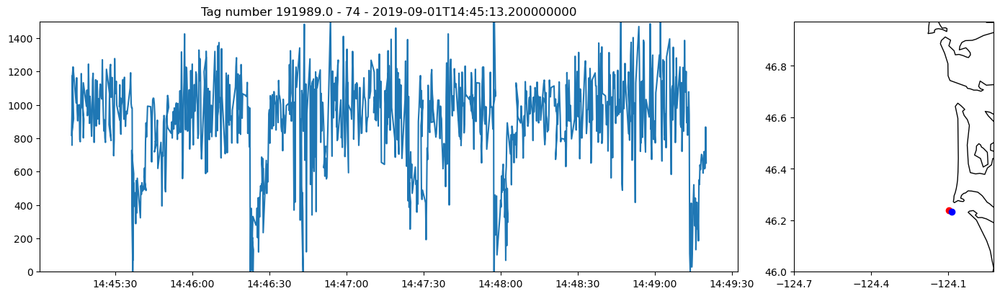

In [29]:
# 191989: 74, 76, 80, 87, 88, 89, 90, 
# 191991: 66, 67, 68, 69
# 191995: 10, 11, 12, 13, 16
# 192759: 235, 238, 241
# 192760: 200, 211, 214, 219, 231, 
# 192761: 171, 178, 184
# 192762: 92, 95, 106, 108, 109, 114, 120, 121, 124, 126, 128, 137, 138, 146, 

for ik in [74, 76, 80, 87, 88, 89, 90, 66, 67, 68, 69, 10, 11, 12, 13, 16, 235, 238, 241, 200, 211, 214, 219, 231, 171, 178, 184, 92, 95, 106, 108, 109, 114, 120, 121, 124, 126, 128, 137, 138, 146, ]:
# for ik in [74]:
    data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
    data_point = ds_obs.where(ds_obs.mask2==ik, drop=True).isel(time_index=0)

    fig = plt.figure(figsize=(14, 4), constrained_layout=True)
    gs = fig.add_gridspec(1, 2, width_ratios=[3, 1])
    ax1 = fig.add_subplot(gs[0])
    ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
    # ax1 = plt.subplot(1, 2, 1)
    # ax2 = plt.subplot(1, 4, 4, projection=ccrs.PlateCarree())
    ax1.plot(data_point0.original_time,data_point0.accz)
    ax1.set_title(f'Tag number {ds_obs.where(ds_obs.mask2==ik, drop=True).id.values[0]} - {ik} - {data_point.original_time.values}')
    ax1.set_ylim(0,1500)

    # Find the data point before ds_obs.where(ds_obs.mask2==ik,drop=True) with datatype "GPS"
    
    # if gps_data_point:
    ax2 = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())
    ax2.plot(data_point.x1, data_point.y1, 'ro')
    ax2.plot(data_point.x2, data_point.y2, 'bo')
    ax2.set_xlim(x_geobox[0] - 0.1, x_geobox[1] + 0.1)
    ax2.set_ylim(y_geobox[0] - 0.1, y_geobox[1] + 0.1)
    ax2.set_xticks(np.arange(-124.7, -124, 0.3), crs=ccrs.PlateCarree())
    ax2.set_yticks(np.arange(46, 47, 0.2), crs=ccrs.PlateCarree())
    ax2.coastlines()
    plt.savefig(f'work/GETM/scripts_ms2/waves_analysis/figure_all/USE_tag_{int(ds_obs.where(ds_obs.mask2==ik, drop=True).id.values[0])}_{ik}.png')
    plt.close()


## FOR 74

(-1500.0, 1500.0)

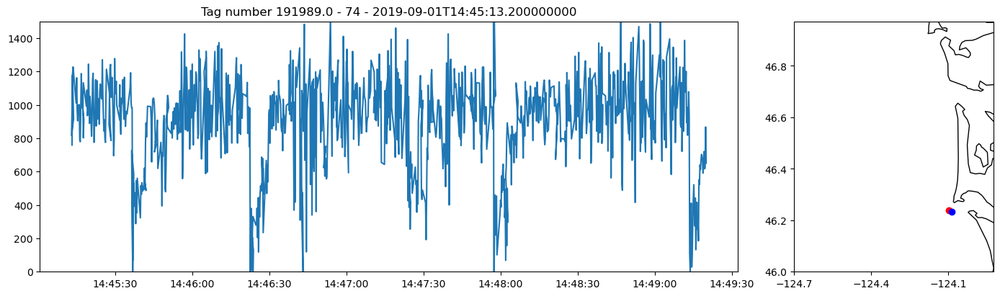

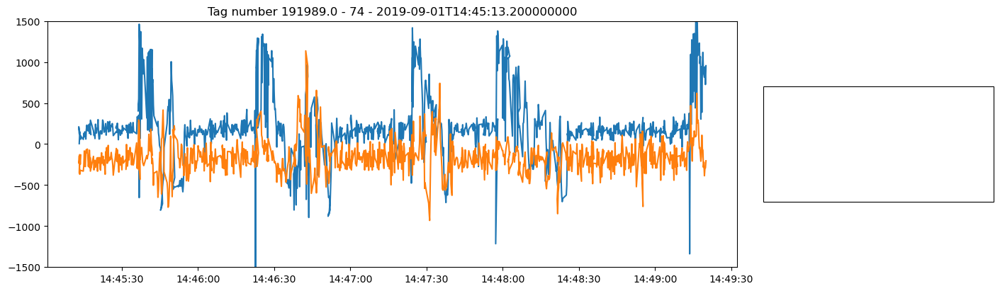

In [ ]:
# 191989: 74, 76, 80, 87, 88, 89, 90, 
# 191991: 66, 67, 68, 69
# 191995: 10, 11, 12, 13, 16
# 192759: 235, 238, 241
# 192760: [200XXX], 211, 214(idential to 211), 219, 231, 
# 192761: 171, 178, 184
# 192762: 92, 95, 106, 108, 109, 114[xxx], 120, 121, 124, 126, 128, 137, 138, 146, 

# for ik in [74, 76, 80, 87, 88, 89, 90, 66, 67, 68, 69, 10, 11, 12, 13, 16, 235, 238, 241, 200, 211, 214, 219, 231, 171, 178, 184, 92, 95, 106, 108, 109, 114, 120, 121, 124, 126, 128, 137, 138, 146, ]:
# for ik in [74]:
ik = 74
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
data_point = ds_obs.where(ds_obs.mask2==ik, drop=True).isel(time_index=0)

fig = plt.figure(figsize=(14, 4), constrained_layout=True)
gs = fig.add_gridspec(1, 2, width_ratios=[3, 1])
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
# ax1 = plt.subplot(1, 2, 1)
# ax2 = plt.subplot(1, 4, 4, projection=ccrs.PlateCarree())
ax1.plot(data_point0.original_time,data_point0.accz)
# ax1.plot(data_point0.original_time,data_point0.accy)
# ax1.plot(data_point0.original_time,data_point0.accx)
ax1.set_title(f'Tag number {ds_obs.where(ds_obs.mask2==ik, drop=True).id.values[0]} - {ik} - {data_point.original_time.values}')
ax1.set_ylim(0,1500)

# Find the data point before ds_obs.where(ds_obs.mask2==ik,drop=True) with datatype "GPS"

# if gps_data_point:
ax2 = plt.subplot(1, 2, 2, projection=ccrs.PlateCarree())
ax2.plot(data_point.x1, data_point.y1, 'ro')
ax2.plot(data_point.x2, data_point.y2, 'bo')
ax2.set_xlim(x_geobox[0] - 0.1, x_geobox[1] + 0.1)
ax2.set_ylim(y_geobox[0] - 0.1, y_geobox[1] + 0.1)
ax2.set_xticks(np.arange(-124.7, -124, 0.3), crs=ccrs.PlateCarree())
ax2.set_yticks(np.arange(46, 47, 0.2), crs=ccrs.PlateCarree())
ax2.coastlines()
# plt.savefig(f'work/GETM/scripts_ms2/waves_analysis/figure_all/USE_tag_{int(ds_obs.where(ds_obs.mask2==ik, drop=True).id.values[0])}_{ik}.png')
# plt.close()

fig = plt.figure(figsize=(14, 4), constrained_layout=True)
gs = fig.add_gridspec(1, 2, width_ratios=[3, 1])
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
# ax1 = plt.subplot(1, 2, 1)
# ax2 = plt.subplot(1, 4, 4, projection=ccrs.PlateCarree())
ax1.plot(data_point0.original_time,data_point0.accy)
ax1.plot(data_point0.original_time,data_point0.accx)
ax1.set_title(f'Tag number {ds_obs.where(ds_obs.mask2==ik, drop=True).id.values[0]} - {ik} - {data_point.original_time.values}')
ax1.set_ylim(-1500,1500)

(-1500.0, 1500.0)

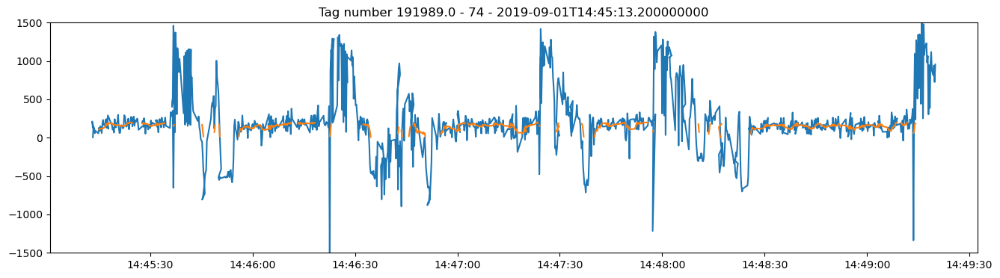

In [125]:
# fig = plt.figure(figsize=(14, 4), constrained_layout=True)
fig = plt.figure(figsize=(16, 4))
# gs = fig.add_gridspec(1, 2, width_ratios=[3, 1])
# ax1 = fig.add_subplot(gs[0])
# ax2 = fig.add_subplot(gs[1], projection=ccrs.PlateCarree())
# ax1 = plt.subplot(1, 2, 1)
# ax2 = plt.subplot(1, 4, 4, projection=ccrs.PlateCarree())
plt.plot(data_point0.original_time,data_point0.accy)
# ax1.plot(data_point0.original_time,data_point0.accy.rolling(time_index=10).mean())
accy_keep = data_point0.accy.rolling(time_index=10).mean().where((data_point0.accy.rolling(time_index=10).mean()>0)&(data_point0.accy.rolling(time_index=10).mean()<200))
plt.plot(data_point0.original_time,accy_keep)
# ax1.plot(data_point0.original_time,data_point0.accx)
plt.title(f'Tag number {ds_obs.where(ds_obs.mask2==ik, drop=True).id.values[0]} - {ik} - {data_point.original_time.values}')
plt.ylim(-1500,1500)
# plt.show()

# Find and Catenate

In [28]:
## pick up the data between two times when the birds movement is not large. 
ik = 74
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-01 14:45:13'), pd.to_datetime('2019-09-01 14:45:35')),
    (pd.to_datetime('2019-09-01 14:45:55'), pd.to_datetime('2019-09-01 14:46:22')),
    (pd.to_datetime('2019-09-01 14:46:53'), pd.to_datetime('2019-09-01 14:47:23')),
    (pd.to_datetime('2019-09-01 14:47:41'), pd.to_datetime('2019-09-01 14:47:57')),
    (pd.to_datetime('2019-09-01 14:48:26'), pd.to_datetime('2019-09-01 14:49:13'))
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_74 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

(0.0, 1500.0)

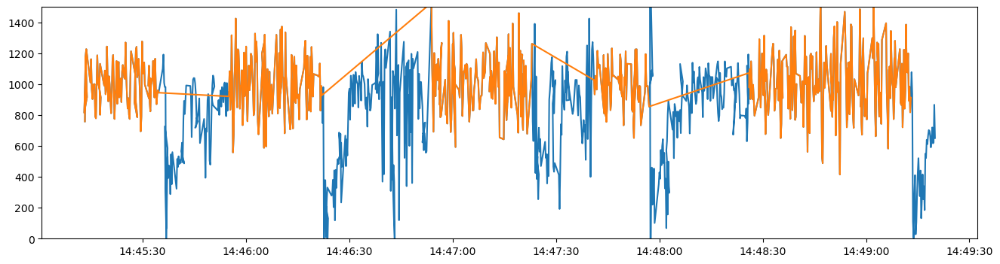

In [29]:
fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_74.original_time,filtered_data_74.accz)
# ax1.plot(data_point0.original_time,data_point0.accx)
# plt.title(f'Tag number {ds_obs.where(ds_obs.mask2==ik, drop=True).id.values[0]} - {ik} - {data_point.original_time.values}')
plt.ylim(0,1500)
# plt.show()

In [30]:
## pick up the data between two times when the birds movement is not large. 
ik = 76
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-01 16:51:17'), pd.to_datetime('2019-09-01 16:52:04')),
    (pd.to_datetime('2019-09-01 16:52:32'), pd.to_datetime('2019-09-01 16:52:42')),
    (pd.to_datetime('2019-09-01 16:53:08'), pd.to_datetime('2019-09-01 16:53:36')),
    (pd.to_datetime('2019-09-01 16:54:00'), pd.to_datetime('2019-09-01 16:54:23')),
    (pd.to_datetime('2019-09-01 16:55:00'), pd.to_datetime('2019-09-01 16:55:26'))
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_76 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

(0.0, 1500.0)

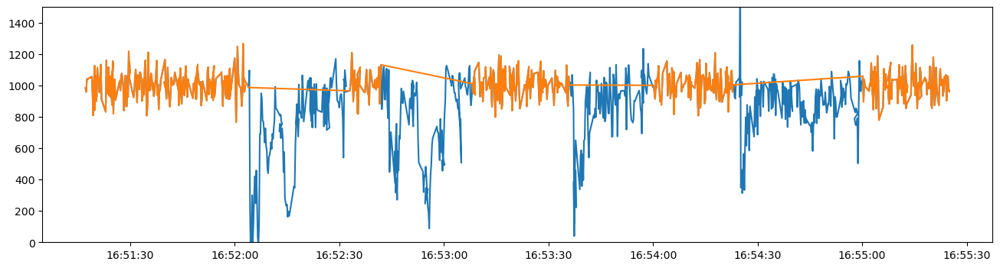

In [31]:
fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_76.original_time,filtered_data_76.accz)
# ax1.plot(data_point0.original_time,data_point0.accx)
# plt.title(f'Tag number {ds_obs.where(ds_obs.mask2==ik, drop=True).id.values[0]} - {ik} - {data_point.original_time.values}')
plt.ylim(0,1500)

(0.0, 1500.0)

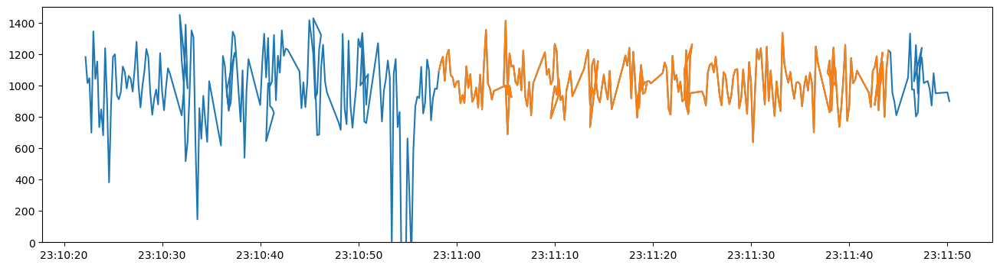

In [32]:
## pick up the data between two times when the birds movement is not large. 
ik = 80
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-01 23:10:58'), pd.to_datetime('2019-09-01 23:11:44')),
  
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_80 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_80.original_time,filtered_data_80.accz)

plt.ylim(0,1500)

(0.0, 1500.0)

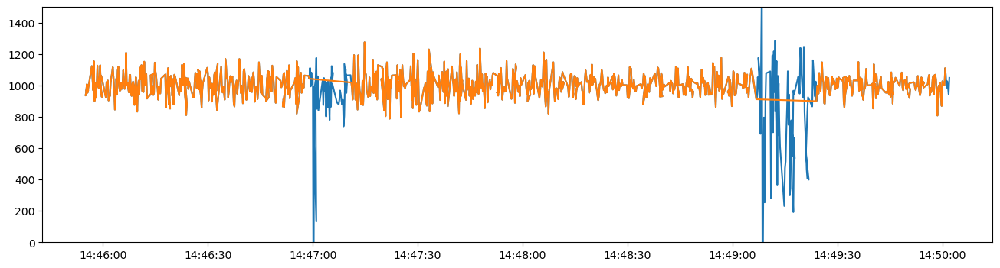

In [33]:
## pick up the data between two times when the birds movement is not large. 
ik = 87
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-02 14:45:50'), pd.to_datetime('2019-09-02 14:46:59')),
    (pd.to_datetime('2019-09-02 14:47:11'), pd.to_datetime('2019-09-02 14:49:07')),
    (pd.to_datetime('2019-09-02 14:49:24'), pd.to_datetime('2019-09-02 14:50:01')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_87 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_87.original_time,filtered_data_87.accz)
# ax1.plot(data_point0.original_time,data_point0.accx)
# plt.title(f'Tag number {ds_obs.where(ds_obs.mask2==ik, drop=True).id.values[0]} - {ik} - {data_point.original_time.values}')
plt.ylim(0,1500)

(0.0, 1500.0)

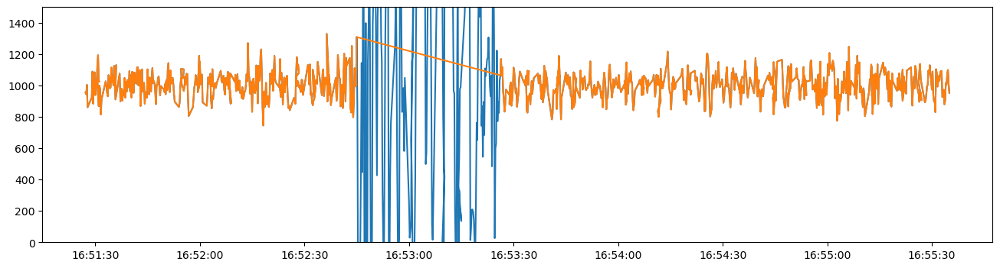

In [34]:
## pick up the data between two times when the birds movement is not large. 
ik = 89
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-02 16:51:27'), pd.to_datetime('2019-09-02 16:52:45')),
    (pd.to_datetime('2019-09-02 16:53:26'), pd.to_datetime('2019-09-02 16:55:36')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_89 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_89.original_time,filtered_data_89.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

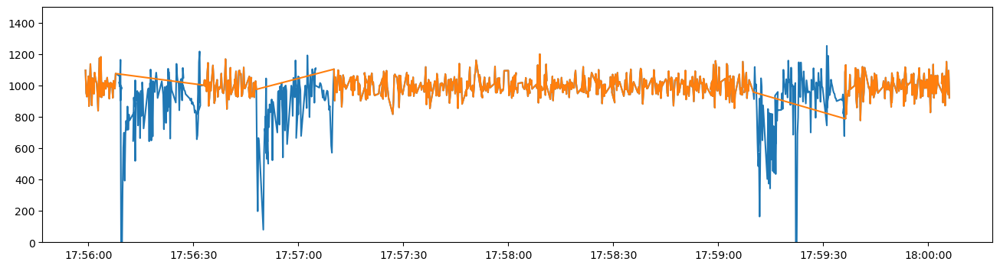

In [35]:
## pick up the data between two times when the birds movement is not large. 
ik = 90
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-02 17:55:59'), pd.to_datetime('2019-09-02 17:56:08')),
    (pd.to_datetime('2019-09-02 17:56:32'), pd.to_datetime('2019-09-02 17:56:48')),
    (pd.to_datetime('2019-09-02 17:57:10'), pd.to_datetime('2019-09-02 17:59:10')),
    (pd.to_datetime('2019-09-02 17:59:36'), pd.to_datetime('2019-09-02 18:00:10')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_90 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_90.original_time,filtered_data_90.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

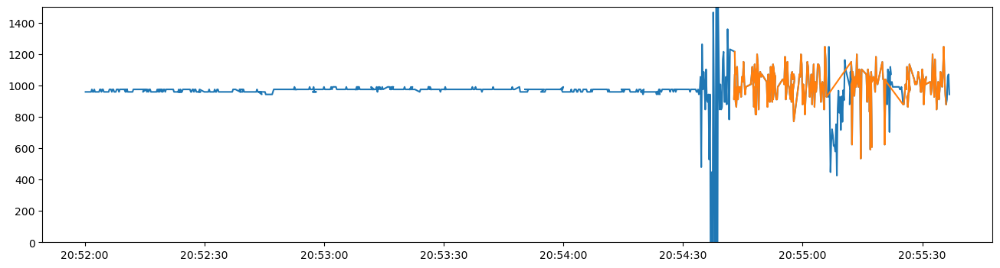

In [36]:
## pick up the data between two times when the birds movement is not large. 
ik = 66
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-03 20:54:42'), pd.to_datetime('2019-09-03 20:55:06')),
    (pd.to_datetime('2019-09-03 20:55:12'), pd.to_datetime('2019-09-03 20:55:21')),
    (pd.to_datetime('2019-09-03 20:55:25'), pd.to_datetime('2019-09-03 20:55:36')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_66 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_66.original_time,filtered_data_66.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

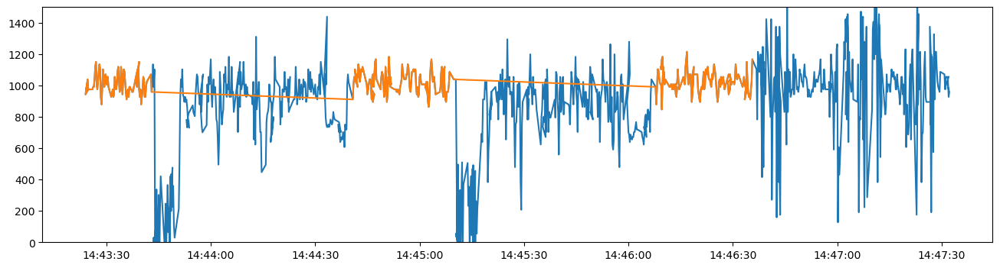

In [37]:
## pick up the data between two times when the birds movement is not large. 
ik = 67
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-11 14:43:24'), pd.to_datetime('2019-09-11 14:43:43')),
    (pd.to_datetime('2019-09-11 14:44:40'), pd.to_datetime('2019-09-11 14:45:10')),
    (pd.to_datetime('2019-09-11 14:46:07'), pd.to_datetime('2019-09-11 14:46:36')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_67 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_67.original_time,filtered_data_67.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

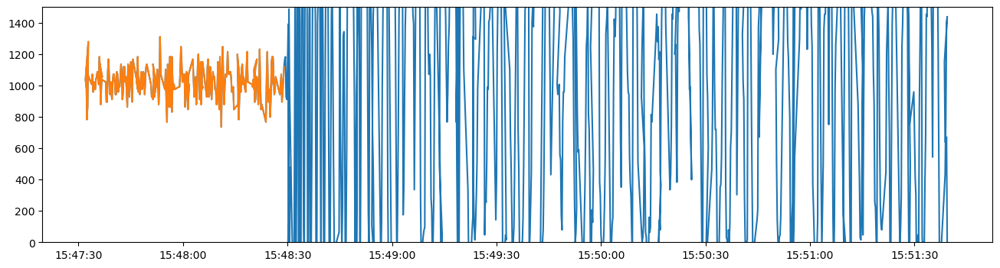

In [38]:
## pick up the data between two times when the birds movement is not large. 
ik = 68
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-11 15:47:32'), pd.to_datetime('2019-09-11 15:48:29')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_68 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_68.original_time,filtered_data_68.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

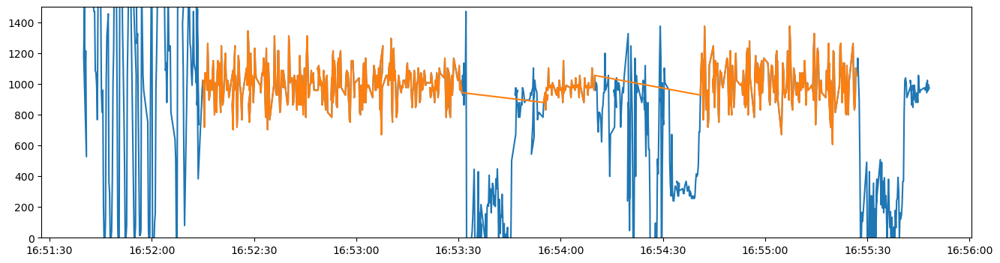

In [39]:
## pick up the data between two times when the birds movement is not large. 
ik = 69
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-11 16:52:15'), pd.to_datetime('2019-09-11 16:53:31')),
    (pd.to_datetime('2019-09-11 16:53:55'), pd.to_datetime('2019-09-11 16:54:10')),
    (pd.to_datetime('2019-09-11 16:54:41'), pd.to_datetime('2019-09-11 16:55:27')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_69 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_69.original_time,filtered_data_69.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

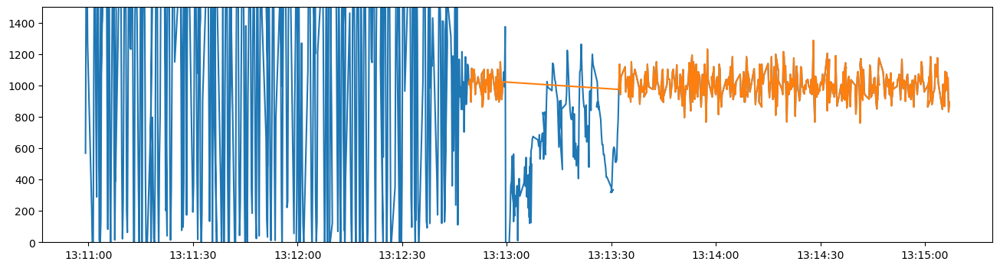

In [40]:
## pick up the data between two times when the birds movement is not large. 
ik = 10
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-06-15 13:12:49'), pd.to_datetime('2019-06-15 13:12:59')),
    (pd.to_datetime('2019-06-15 13:13:32'), pd.to_datetime('2019-06-15 13:15:07')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_10 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_10.original_time,filtered_data_10.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

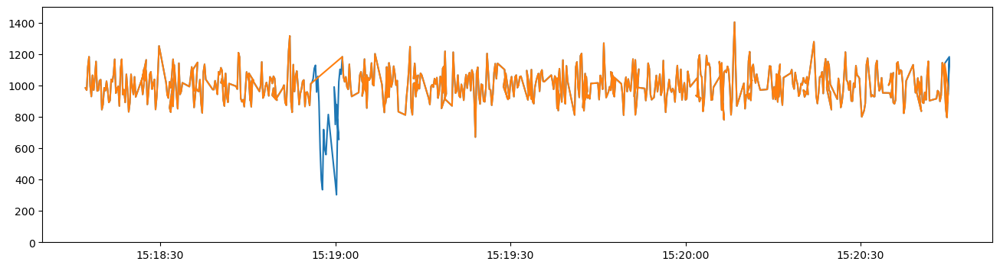

In [41]:
## pick up the data between two times when the birds movement is not large. 
ik = 12
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-06-15 15:18:17'), pd.to_datetime('2019-06-15 15:18:56')),
    (pd.to_datetime('2019-06-15 15:19:01'), pd.to_datetime('2019-06-15 15:20:45')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_12 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_12.original_time,filtered_data_12.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

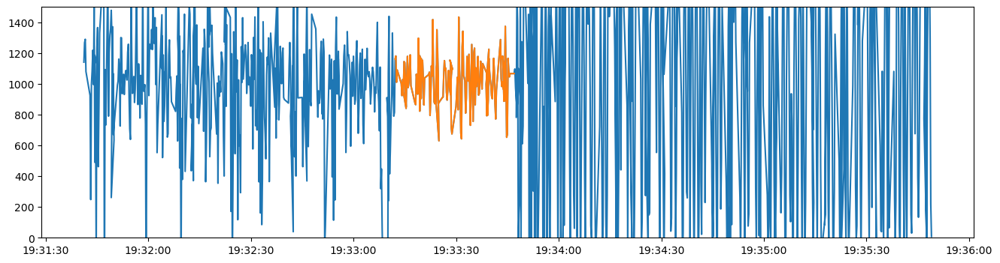

In [42]:
## pick up the data between two times when the birds movement is not large. 
ik = 16
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-06-15 19:33:12'), pd.to_datetime('2019-06-15 19:33:47')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_16 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_16.original_time,filtered_data_16.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

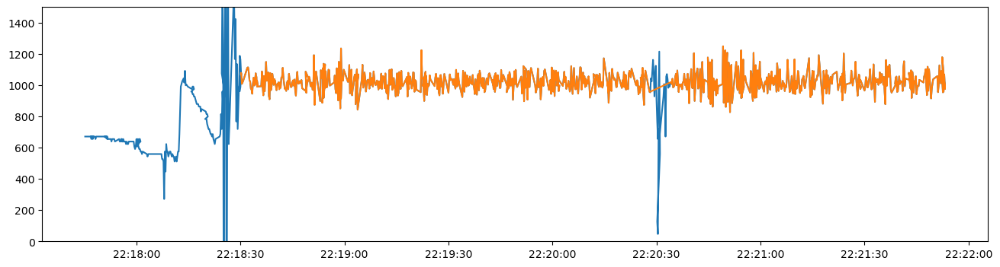

In [43]:
## pick up the data between two times when the birds movement is not large. 
ik = 235
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-27 22:18:30'), pd.to_datetime('2019-09-27 22:20:28')),
    (pd.to_datetime('2019-09-27 22:20:34'), pd.to_datetime('2019-09-27 22:21:54')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_235 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_235.original_time,filtered_data_235.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

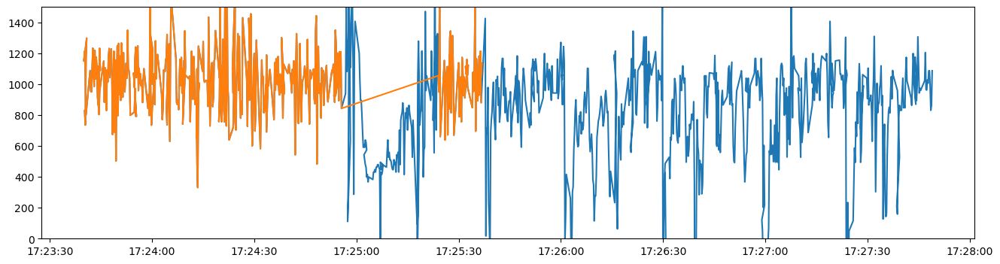

In [44]:
## pick up the data between two times when the birds movement is not large. 
ik = 238
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-28 17:23:40'), pd.to_datetime('2019-09-28 17:24:56')),
    (pd.to_datetime('2019-09-28 17:25:24'), pd.to_datetime('2019-09-28 17:25:37')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_238 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_238.original_time,filtered_data_238.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

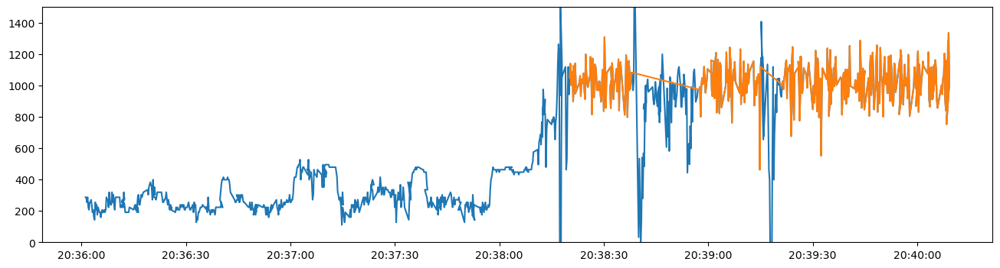

In [45]:
## pick up the data between two times when the birds movement is not large. 
ik = 241
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-28 20:38:20'), pd.to_datetime('2019-09-28 20:38:38')),
    (pd.to_datetime('2019-09-28 20:38:57'), pd.to_datetime('2019-09-28 20:39:15')),
    (pd.to_datetime('2019-09-28 20:39:21'), pd.to_datetime('2019-09-28 20:40:10')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_241 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_241.original_time,filtered_data_241.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

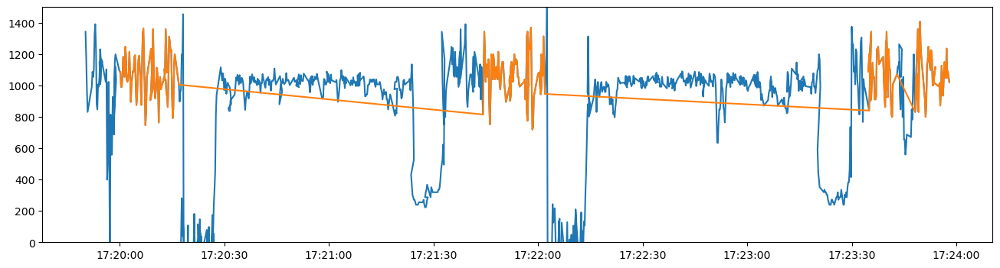

In [46]:
## pick up the data between two times when the birds movement is not large. 
ik = 211
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-23 17:19:59'), pd.to_datetime('2019-09-23 17:20:17')),
    (pd.to_datetime('2019-09-23 17:21:44'), pd.to_datetime('2019-09-23 17:22:02')),
    (pd.to_datetime('2019-09-23 17:23:34'), pd.to_datetime('2019-09-23 17:23:43')),
    (pd.to_datetime('2019-09-23 17:23:48'), pd.to_datetime('2019-09-23 17:23:59')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_211 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_211.original_time,filtered_data_211.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

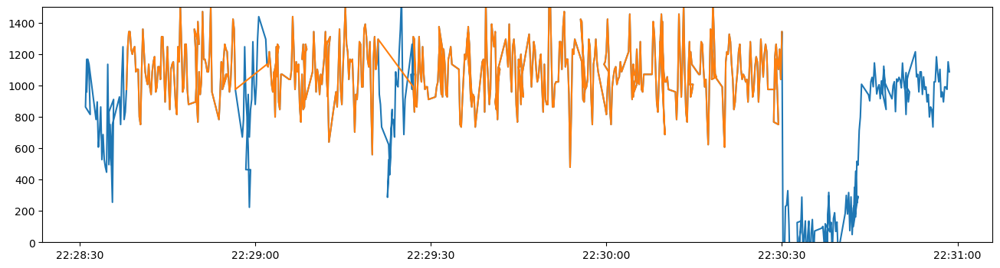

In [47]:
## pick up the data between two times when the birds movement is not large. 
ik = 219
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-23 22:28:38'), pd.to_datetime('2019-09-23 22:28:57')),
    (pd.to_datetime('2019-09-23 22:29:02'), pd.to_datetime('2019-09-23 22:29:21')),
    (pd.to_datetime('2019-09-23 22:29:27'), pd.to_datetime('2019-09-23 22:30:30')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_219 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_219.original_time,filtered_data_219.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

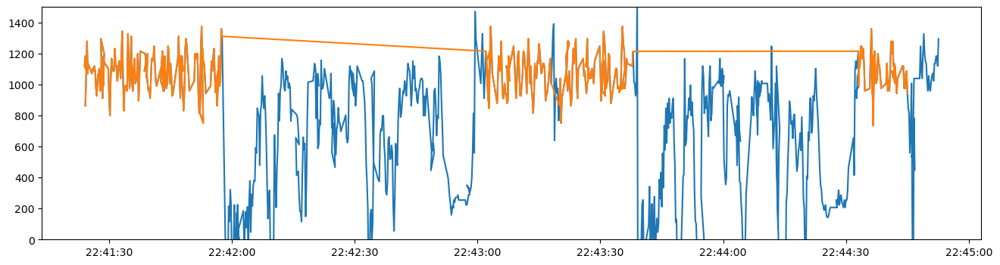

In [48]:
## pick up the data between two times when the birds movement is not large. 
ik = 231
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-24 22:41:24'), pd.to_datetime('2019-09-24 22:41:58')),
    (pd.to_datetime('2019-09-24 22:43:02'), pd.to_datetime('2019-09-24 22:43:18')),
    (pd.to_datetime('2019-09-24 22:43:20'), pd.to_datetime('2019-09-24 22:43:38')),
    (pd.to_datetime('2019-09-24 22:44:33'), pd.to_datetime('2019-09-24 22:44:45')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_231 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_231.original_time,filtered_data_231.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

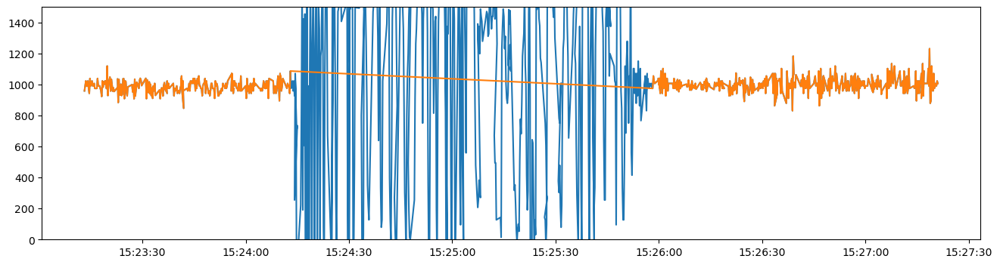

In [49]:
## pick up the data between two times when the birds movement is not large. 
ik = 171
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-10-01 15:23:13'), pd.to_datetime('2019-10-01 15:24:13')),
    (pd.to_datetime('2019-10-01 15:25:58'), pd.to_datetime('2019-10-01 15:27:21')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_171 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_171.original_time,filtered_data_171.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

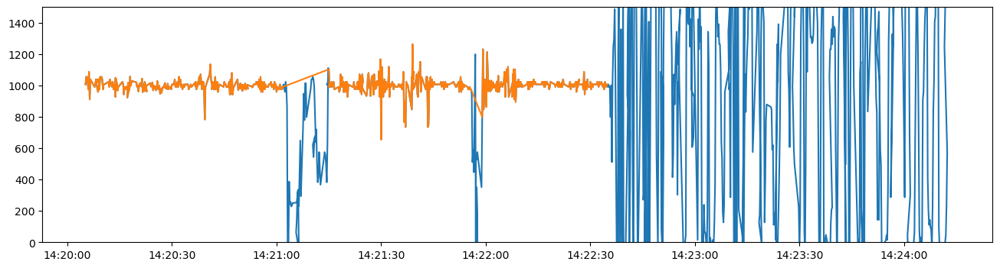

In [50]:
## pick up the data between two times when the birds movement is not large. 
ik = 178
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-10-02 14:20:05'), pd.to_datetime('2019-10-02 14:21:02')),
    (pd.to_datetime('2019-10-02 14:21:15'), pd.to_datetime('2019-10-02 14:21:56')),
    (pd.to_datetime('2019-10-02 14:21:59'), pd.to_datetime('2019-10-02 14:22:35')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_178 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_178.original_time,filtered_data_178.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

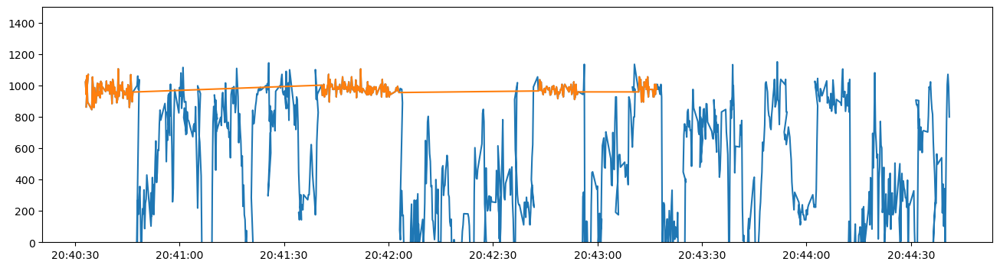

In [51]:
## pick up the data between two times when the birds movement is not large. 
ik = 184
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-10-02 20:40:33'), pd.to_datetime('2019-10-02 20:40:47')),
    (pd.to_datetime('2019-10-02 20:41:40'), pd.to_datetime('2019-10-02 20:42:03')),
    (pd.to_datetime('2019-10-02 20:42:43'), pd.to_datetime('2019-10-02 20:42:55')),
    (pd.to_datetime('2019-10-02 20:43:11'), pd.to_datetime('2019-10-02 20:43:17')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_184 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_184.original_time,filtered_data_184.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

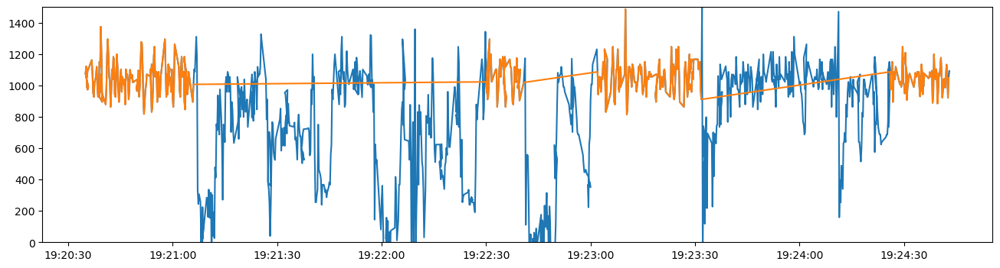

In [52]:
## pick up the data between two times when the birds movement is not large. 
ik = 95
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-22 19:20:35'), pd.to_datetime('2019-09-22 19:21:06')),
    (pd.to_datetime('2019-09-22 19:22:30'), pd.to_datetime('2019-09-22 19:22:41')),
    (pd.to_datetime('2019-09-22 19:23:02'), pd.to_datetime('2019-09-22 19:23:32')),
    (pd.to_datetime('2019-09-22 19:24:26'), pd.to_datetime('2019-09-22 19:24:43')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_95 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_95.original_time,filtered_data_95.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

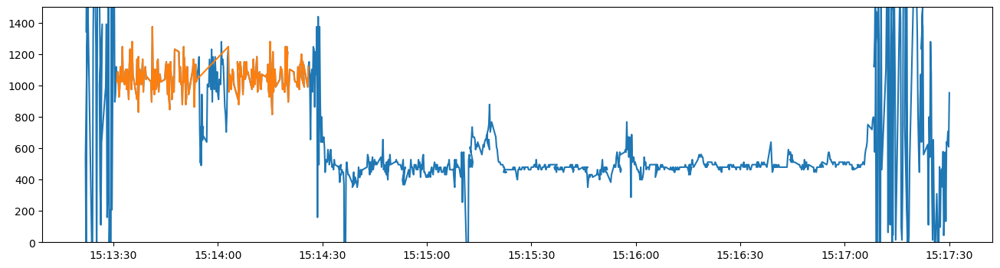

In [53]:
## pick up the data between two times when the birds movement is not large. 
ik = 109
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-24 15:13:31'), pd.to_datetime('2019-09-24 15:13:54')),
    (pd.to_datetime('2019-09-24 15:14:03'), pd.to_datetime('2019-09-24 15:14:26')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_109 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_109.original_time,filtered_data_109.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

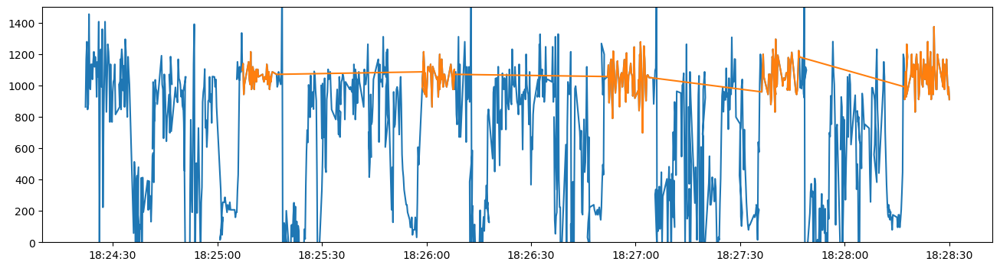

In [54]:
## pick up the data between two times when the birds movement is not large. 
ik = 121
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-25 18:25:07'), pd.to_datetime('2019-09-25 18:25:17')),
    (pd.to_datetime('2019-09-25 18:25:58'), pd.to_datetime('2019-09-25 18:26:08')),
    (pd.to_datetime('2019-09-25 18:26:51'), pd.to_datetime('2019-09-25 18:27:05')),
    (pd.to_datetime('2019-09-25 18:27:36'), pd.to_datetime('2019-09-25 18:27:47')),
    (pd.to_datetime('2019-09-25 18:28:17'), pd.to_datetime('2019-09-25 18:28:30')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_121 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_121.original_time,filtered_data_121.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

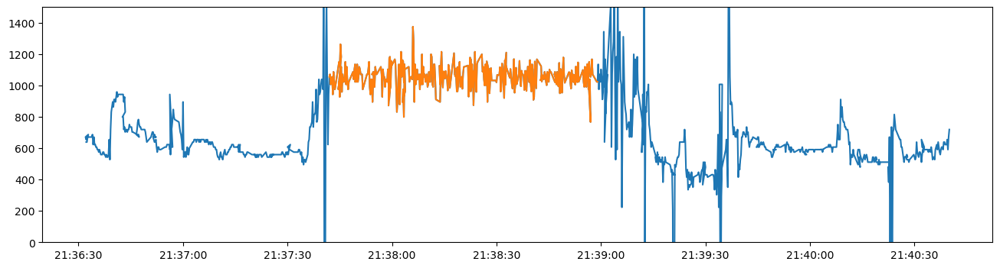

In [55]:
## pick up the data between two times when the birds movement is not large. 
ik = 124
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-25 21:37:42'), pd.to_datetime('2019-09-25 21:38:59')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_124 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_124.original_time,filtered_data_124.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

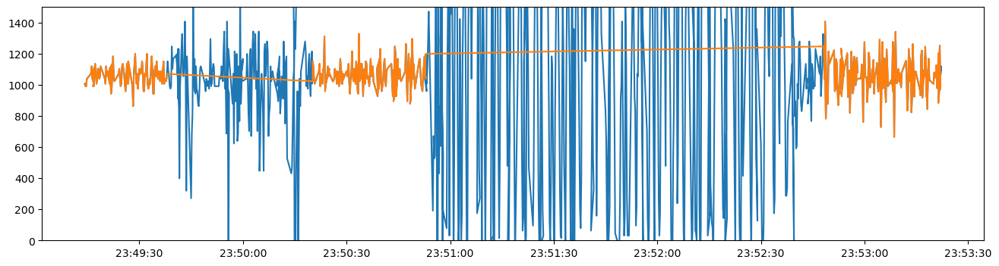

In [56]:
## pick up the data between two times when the birds movement is not large. 
ik = 126
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-25 23:49:13'), pd.to_datetime('2019-09-25 23:49:38')),
    (pd.to_datetime('2019-09-25 23:50:20'), pd.to_datetime('2019-09-25 23:50:53')),
    (pd.to_datetime('2019-09-25 23:52:48'), pd.to_datetime('2019-09-25 23:53:22')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_126 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_126.original_time,filtered_data_126.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

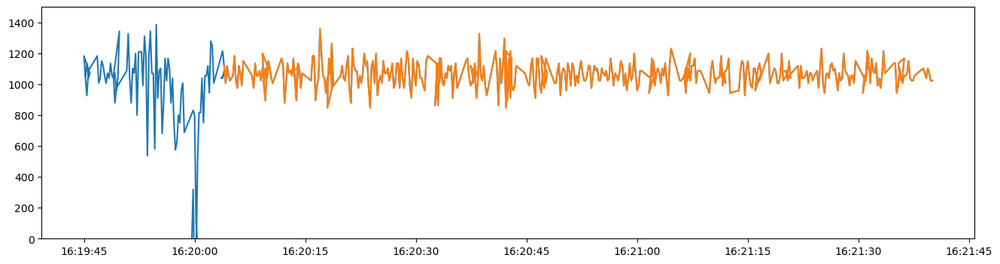

In [57]:
## pick up the data between two times when the birds movement is not large. 
ik = 128
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-26 16:20:04'), pd.to_datetime('2019-09-26 16:21:40')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_128 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_128.original_time,filtered_data_128.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

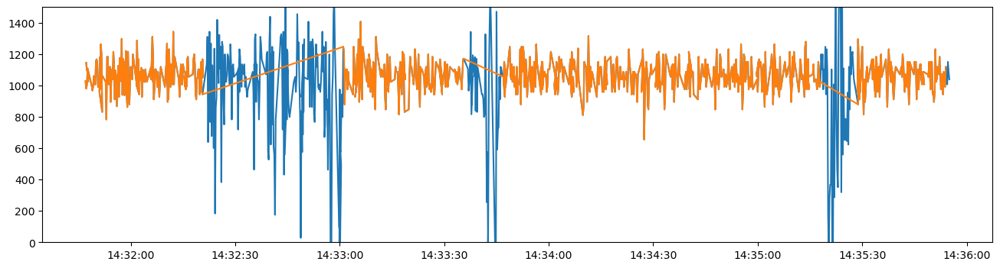

In [58]:
## pick up the data between two times when the birds movement is not large. 
ik = 137
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-27 14:31:44'), pd.to_datetime('2019-09-27 14:32:21')),
    (pd.to_datetime('2019-09-27 14:33:01'), pd.to_datetime('2019-09-27 14:33:36')),
    (pd.to_datetime('2019-09-27 14:33:47'), pd.to_datetime('2019-09-27 14:35:18')),
    (pd.to_datetime('2019-09-27 14:35:28'), pd.to_datetime('2019-09-27 14:35:54')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_137 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_137.original_time,filtered_data_137.accz)
plt.ylim(0,1500)

(0.0, 1500.0)

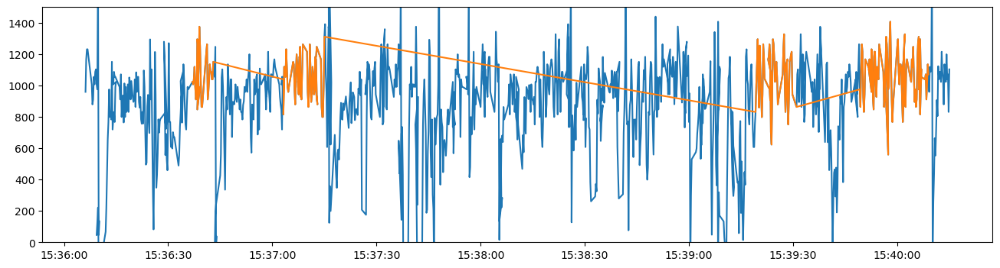

In [59]:
## pick up the data between two times when the birds movement is not large. 
ik = 138
data_point0 = ds_obs.where(ds_obs.mask2==ik, drop=True)
## Define the durations
durations = [
    (pd.to_datetime('2019-09-27 15:36:36'), pd.to_datetime('2019-09-27 15:36:43')),
    (pd.to_datetime('2019-09-27 15:37:03'), pd.to_datetime('2019-09-27 15:37:15')),
    (pd.to_datetime('2019-09-27 15:39:19'), pd.to_datetime('2019-09-27 15:39:31')),
    (pd.to_datetime('2019-09-27 15:39:49'), pd.to_datetime('2019-09-27 15:40:09')),
]

# Filter the data_point0 dataset for each duration and concatenate the results
filtered_data_138 = xr.concat(
    [data_point0.where((data_point0.original_time >= start) & (data_point0.original_time <= end), drop=True) for start, end in durations],
    dim='time_index'
)

fig = plt.figure(figsize=(16, 4))
plt.plot(data_point0.original_time,data_point0.accz)
plt.plot(filtered_data_138.original_time,filtered_data_138.accz)
plt.ylim(0,1500)

# Do analysis by these Catenated Data

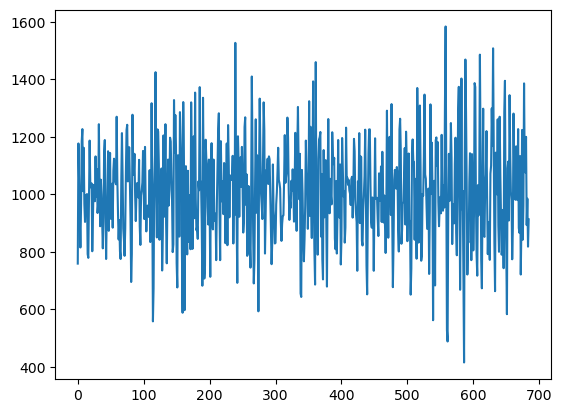

In [61]:
plt.plot(filtered_data_74.accz)

In [22]:
def power_spectral_density(accz_values, accz_rolling_5s):
    from scipy.signal import welch
    f_accz, Pxx_accz = welch(accz_values, fs=5, nperseg=256)
    f_accz_rolling, Pxx_accz_rolling = welch(accz_rolling_5s, fs=5, nperseg=256)
    return f_accz, Pxx_accz, f_accz_rolling, Pxx_accz_rolling

def butter_lowpass_filter(data, cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y

74 1.6895633933338723
74 -124.09690856933592 46.23755645751953 2019-09-01T14:45:13.200000000
76 0.780407161989232
76 -124.03533935546876 46.23326873779297 2019-09-01T16:51:17.190000000
80 1.3185287171616704
80 -124.11333465576172 46.26808547973633 2019-09-01T23:10:58.190000000
87 0.6751129985245856
87 -124.0851364135742 46.3001823425293 2019-09-02T14:45:55.200000000
88


/home/server/pi/homes/liux8/.conda/envs/dev_scipy/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 225, using nperseg = 225
  warnings.warn('nperseg = {0:d} is greater than input length '
/home/server/pi/homes/liux8/.conda/envs/dev_scipy/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 225, using nperseg = 225
  warnings.warn('nperseg = {0:d} is greater than input length '


88 0.5282368038072648
88 -124.17459106445312 46.29806900024414 2019-09-02T15:50:02.200000000
89 0.8011607241935291
89 -124.17279815673828 46.26850128173828 2019-09-02T16:51:27.190000000
90 0.586179973678457
90 -124.03707122802734 46.23532485961913 2019-09-02T17:55:59.190000000
66 1.0729160248661058
66 -124.06737518310544 46.233745574951165 2019-09-03T20:54:42.990000000
67 0.6689922567829047
67 -124.0947494506836 46.27508163452149 2019-09-11T14:43:24.200000000
68 0.9786433042985395
68 -124.1066665649414 46.3586311340332 2019-09-11T15:47:32.200000000
69 1.157863541660387
69 -124.0953140258789 46.3894920349121 2019-09-11T16:52:15.000000000
10 0.8067172141382993
10 -124.03298950195312 46.253662109375 2019-06-15T13:12:49.190000000
11


/home/server/pi/homes/liux8/.conda/envs/dev_scipy/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 214, using nperseg = 214
  warnings.warn('nperseg = {0:d} is greater than input length '


11 0.8414519683746197
11 -124.05117034912108 46.25826644897461 2019-06-15T14:15:07.200000000
12 0.9038273501647114
12 -124.03299713134764 46.25557327270508 2019-06-15T15:18:17.190000000
13
13 1.2721247760322099
13 -124.06027221679688 46.23863220214844 2019-06-15T16:21:24.190000000
16 1.4657874187287994
16 -124.07157897949216 46.23395538330078 2019-06-15T19:33:12.190000000
235 0.6102493419583243
235 -124.03841400146484 46.26544189453125 2019-09-27T22:18:30.190000000
238 1.87232076934783
238 -124.0849609375 46.26318359375 2019-09-28T17:23:40.200000000
241 1.1484507924676235
241 -124.02952575683592 46.26970672607422 2019-09-28T20:38:20.190000000
211 1.4674423513357835
211 -124.08656311035156 46.34738159179688 2019-09-23T17:19:59.990000000
219 1.9411161797532883
219 -124.04878997802734 46.72226333618164 2019-09-23T22:28:38.000000000
231 1.3885145743654228
231 -124.05119323730467 46.7232551574707 2019-09-24T22:41:24.200000000
171 0.43486916316939767
171 -124.0723876953125 46.864559173583984

/home/server/pi/homes/liux8/.conda/envs/dev_scipy/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 165, using nperseg = 165
  warnings.warn('nperseg = {0:d} is greater than input length '


92 1.2580112658152964
92 -124.02780151367188 46.270484924316406 2019-09-22T16:14:51.200000000
95 1.022991313260406
95 -124.03907012939452 46.283721923828125 2019-09-22T19:20:35.200000000
106
106 1.4708508980854416
106 -124.02840423583984 46.269287109375 2019-09-23T20:27:34.200000000
108
108 0.9579206835802061
108 -124.0318603515625 46.26726531982422 2019-09-23T22:35:51.190000000
109 1.0305616258334775
109 -124.0281753540039 46.27017974853516 2019-09-24T15:13:31.000000000
120


/home/server/pi/homes/liux8/.conda/envs/dev_scipy/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 222, using nperseg = 222
  warnings.warn('nperseg = {0:d} is greater than input length '


120 0.9623099153108109
120 -124.02930450439452 46.269798278808594 2019-09-25T17:20:14.190000000
121 1.0661114423970883
121 -124.0390396118164 46.28288269042969 2019-09-25T18:25:07.190000000
124 0.896781941760607
124 -124.0274658203125 46.26942443847656 2019-09-25T21:37:42.000000000
126 1.0933008578343
126 -124.03878021240234 46.28266143798828 2019-09-25T23:49:14.190000000
128 0.9843584047822812
128 -124.03990173339844 46.28422164916992 2019-09-26T16:20:04.000000000
137 1.0736006647273386
137 -124.03107452392578 46.26799392700195 2019-09-27T14:31:47.200000000
138 1.5460503926016984
138 -124.03429412841795 46.27284240722656 2019-09-27T15:36:36.990000000
146


/home/server/pi/homes/liux8/.conda/envs/dev_scipy/lib/python3.11/site-packages/scipy/signal/_spectral_py.py:2017: UserWarning: nperseg = 256 is greater than input length  = 238, using nperseg = 238
  warnings.warn('nperseg = {0:d} is greater than input length '


146 0.8985196015558036
146 -124.02961730957033 46.269729614257805 2019-09-30T17:28:03.200000000


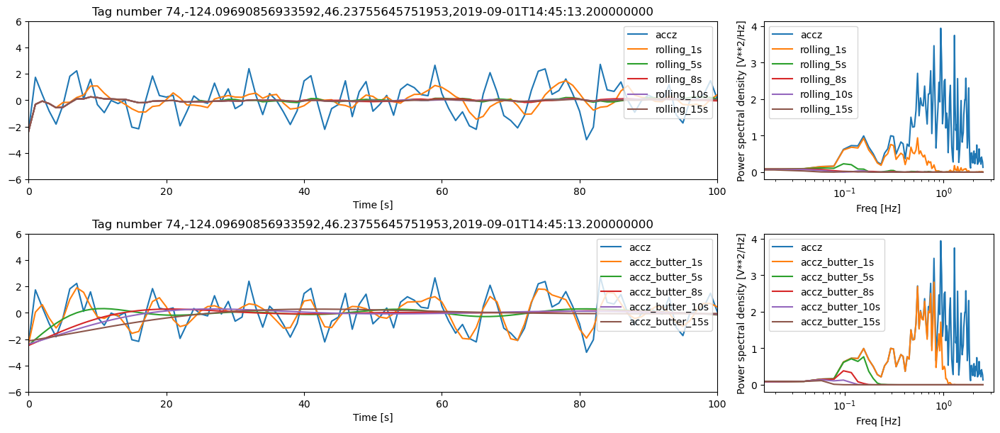

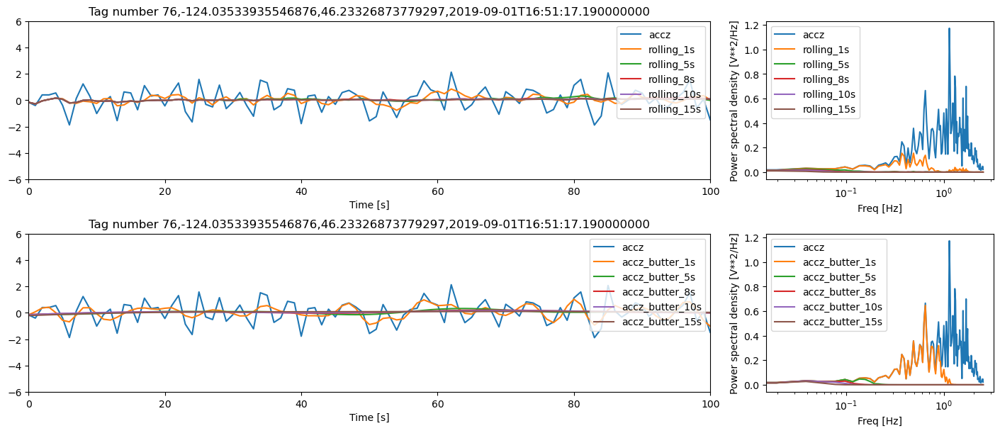

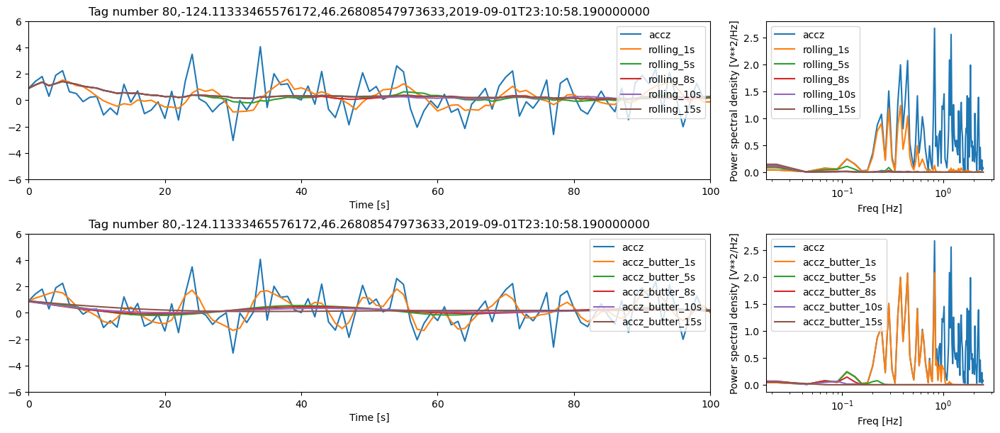

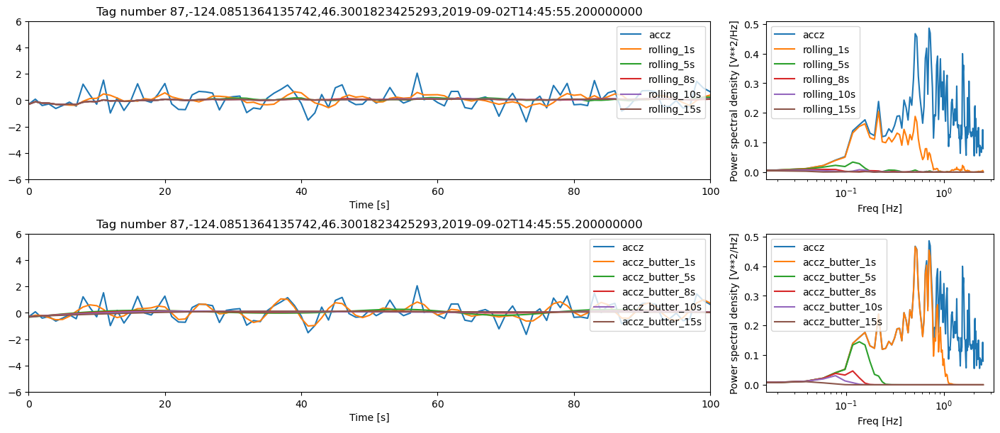

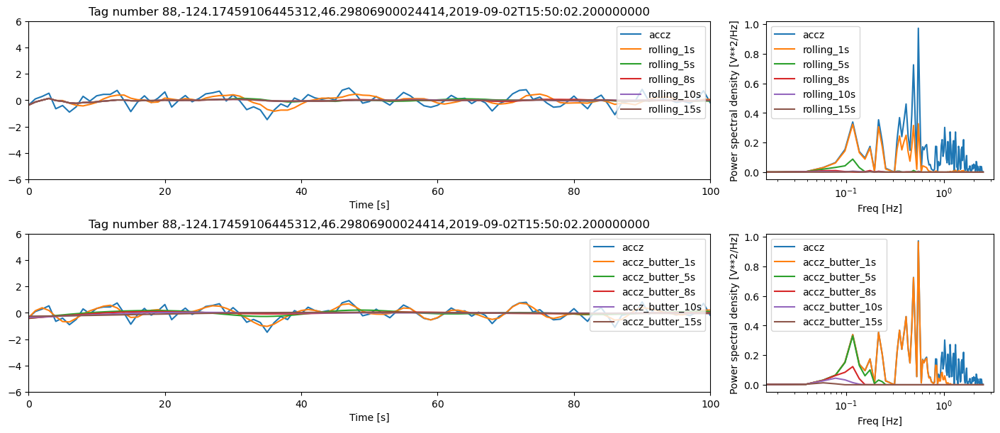

In [66]:
from scipy.signal import butter, filtfilt

# 191989: 74, 76, 80, 87, 88, 89, 90, 
# 191991: 66, 67, 68, 69
# 191995: 10, 11, 12, 13, 16
# 192759: 235, 238, 241
# 192760: [200XXX], 211, 214(idential to 211), 219, 231, 
# 192761: 171, 178, 184
# 192762: 92, 95, 106, 108, 109, 114[xxx], 120, 121, 124, 126, 128, 137, 138, 146, 

results = pd.DataFrame(columns=['sec_id','rms_accz', 'accz_g_x', 'accz_g_y', 'accz_g_t'])
spectrum_results = pd.DataFrame(columns=['sec_id','frequency', 'psd'])
icount = 0
for ik in [74, 76, 80, 87, 88, 89, 90, 66, 67, 68, 69, 10, 11, 12, 13, 16, 235, 238, 241, 211, 219, 231, 171, 178, 184, 92, 95, 106, 108, 109, 120, 121, 124, 126, 128, 137, 138, 146, ]:
# for ik in [74]:
    if f'filtered_data_{ik}' in globals():
        ds_ana = globals()[f'filtered_data_{ik}']
    else:
        print(ik)
        ds_ana = ds_obs.where(ds_obs.mask2 == ik, drop=True)
    # ds_ana = globals()[f'filtered_data_{ik}']

    accz_g_x = ds_ana.x1[0]
    accz_g_y = ds_ana.y1[0]
    accz_g_t = ds_ana.original_time[0]
    accz = (ds_ana.accz-1000)/1000*9.81
    accz_values = accz.values
    length_accz_values = len(accz_values)

    sample_rate = 5

    accz_rolling_1s = pd.Series(accz_values).rolling(window=1*sample_rate, min_periods=1).mean().values
    accz_rolling_2s = pd.Series(accz_values).rolling(window=2*sample_rate, min_periods=1).mean().values
    accz_rolling_3s = pd.Series(accz_values).rolling(window=3*sample_rate, min_periods=1).mean().values
    accz_rolling_4s = pd.Series(accz_values).rolling(window=4*sample_rate, min_periods=1).mean().values
    accz_rolling_5s = pd.Series(accz_values).rolling(window=5*sample_rate, min_periods=1).mean().values
    accz_rolling_8s = pd.Series(accz_values).rolling(window=8*sample_rate, min_periods=1).mean().values
    accz_rolling_10s = pd.Series(accz_values).rolling(window=10*sample_rate, min_periods=1).mean().values
    accz_rolling_15s = pd.Series(accz_values).rolling(window=15*sample_rate, min_periods=1).mean().values

    cutoff_frequency = 1/2.0  # Define the cutoff frequency for the filter
    order = 4  # Define the order of the filter

    accz_filtered_1s = butter_lowpass_filter(accz_values, 1/1, sample_rate, order)
    accz_filtered_2s = butter_lowpass_filter(accz_values, 1/2, sample_rate, order)
    accz_filtered_3s = butter_lowpass_filter(accz_values, 1/3, sample_rate, order)
    accz_filtered_4s = butter_lowpass_filter(accz_values, 1/4, sample_rate, order)
    accz_filtered_5s = butter_lowpass_filter(accz_values, 1/5, sample_rate, order)
    accz_filtered_8s = butter_lowpass_filter(accz_values, 1/8, sample_rate, order)
    accz_filtered_10s = butter_lowpass_filter(accz_values, 1/10, sample_rate, order)
    accz_filtered_15s = butter_lowpass_filter(accz_values, 1/15, sample_rate, order)
    # accz_rolling_5s_filtered = butter_lowpass_filter(accz_rolling_5s, cutoff_frequency, sample_rate, order)

    f_accz, Pxx_accz, f_accz_rolling_1s, Pxx_accz_rolling_1s = power_spectral_density(accz, accz_rolling_1s)
    spectrum_results = pd.concat([spectrum_results, pd.DataFrame({
        'sec_id': [ik] * len(f_accz),
        'frequency': f_accz,
        'psd': Pxx_accz
    })],ignore_index=True)
    
    if icount < 5:

        _,_,f_accz_rolling_2s, Pxx_accz_rolling_2s = power_spectral_density(accz, accz_rolling_2s)
        _,_,f_accz_rolling_3s, Pxx_accz_rolling_3s = power_spectral_density(accz, accz_rolling_3s)
        _,_,f_accz_rolling_4s, Pxx_accz_rolling_4s = power_spectral_density(accz, accz_rolling_4s)
        _,_,f_accz_rolling_5s, Pxx_accz_rolling_5s = power_spectral_density(accz, accz_rolling_5s)
        _,_,f_accz_rolling_8s, Pxx_accz_rolling_8s = power_spectral_density(accz, accz_rolling_8s)
        _,_,f_accz_rolling_10s, Pxx_accz_rolling_10s = power_spectral_density(accz, accz_rolling_10s)
        _,_,f_accz_rolling_15s, Pxx_accz_rolling_15s = power_spectral_density(accz, accz_rolling_15s)
        _,_,f_accz_butter_1s, Pxx_accz_butter_1s = power_spectral_density(accz, accz_filtered_1s)
        _,_,f_accz_butter_2s, Pxx_accz_butter_2s = power_spectral_density(accz, accz_filtered_2s)
        _,_,f_accz_butter_3s, Pxx_accz_butter_3s = power_spectral_density(accz, accz_filtered_3s)
        _,_,f_accz_butter_4s, Pxx_accz_butter_4s = power_spectral_density(accz, accz_filtered_4s)
        _,_,f_accz_butter_5s, Pxx_accz_butter_5s = power_spectral_density(accz, accz_filtered_5s)
        _,_,f_accz_butter_8s, Pxx_accz_butter_8s = power_spectral_density(accz, accz_filtered_8s)
        _,_,f_accz_butter_10s, Pxx_accz_butter_10s = power_spectral_density(accz, accz_filtered_10s)
        _,_,f_accz_butter_15s, Pxx_accz_butter_15s = power_spectral_density(accz, accz_filtered_15s)

        fig = plt.figure(figsize=(14, 6), constrained_layout=True)
        gs = fig.add_gridspec(2, 2, width_ratios=[3, 1])
        ax1 = fig.add_subplot(gs[0])
        ax2 = fig.add_subplot(gs[1])

        ax1.plot(accz,label='accz')
        ax1.plot(accz_rolling_1s,label='rolling_1s')
        # ax1.plot(accz_rolling_2s,label='rolling_2s')
        # ax1.plot(accz_rolling_3s,label='rolling_3s')
        # ax1.plot(accz_rolling_4s,label='rolling_4s')
        ax1.plot(accz_rolling_5s,label='rolling_5s')
        ax1.plot(accz_rolling_8s,label='rolling_8s')
        ax1.plot(accz_rolling_10s,label='rolling_10s')
        ax1.plot(accz_rolling_15s,label='rolling_15s')
        ax1.legend(loc='upper right')
        ax1.set_title(f'Tag number {ik},{accz_g_x.values},{accz_g_y.values},{accz_g_t.values}')
        ax1.set_ylim(-6,6)
        ax1.set_xlim(0, 100)
        ax1.set_xlabel('Time [s]')

        ax2.plot(f_accz, Pxx_accz,label='accz')
        ax2.plot(f_accz_rolling_1s, Pxx_accz_rolling_1s,label='rolling_1s')
        # ax2.plot(f_accz_rolling_2s, Pxx_accz_rolling_2s,label='rolling_2s')
        # ax2.plot(f_accz_rolling_3s, Pxx_accz_rolling_3s,label='rolling_3s')
        # ax2.plot(f_accz_rolling_4s, Pxx_accz_rolling_4s,label='rolling_4s')
        ax2.plot(f_accz_rolling_5s, Pxx_accz_rolling_5s,label='rolling_5s')
        ax2.plot(f_accz_rolling_8s, Pxx_accz_rolling_8s,label='rolling_8s')
        ax2.plot(f_accz_rolling_10s, Pxx_accz_rolling_10s,label='rolling_10s')
        ax2.plot(f_accz_rolling_15s, Pxx_accz_rolling_15s,label='rolling_15s')
        ax2.set_xscale('log')
        ax2.set_xlabel('Freq [Hz]')
        ax2.set_ylabel('Power spectral density [V**2/Hz]')
        ax2.legend()

        ax3 = fig.add_subplot(gs[2])
        ax4 = fig.add_subplot(gs[3])

        ax3.plot(accz,label='accz')
        ax3.plot(accz_filtered_1s,label='accz_butter_1s')
        # ax3.plot(accz_filtered_2s,label='accz_butter_2s')
        # ax3.plot(accz_filtered_3s,label='accz_butter_3s')
        # ax3.plot(accz_filtered_4s,label='accz_butter_4s')
        ax3.plot(accz_filtered_5s,label='accz_butter_5s')
        ax3.plot(accz_filtered_8s,label='accz_butter_8s')
        ax3.plot(accz_filtered_10s,label='accz_butter_10s')
        ax3.plot(accz_filtered_15s,label='accz_butter_15s')
        ax3.legend(loc='upper right')
        ax3.set_title(f'Tag number {ik},{accz_g_x.values},{accz_g_y.values},{accz_g_t.values}')
        ax3.set_ylim(-6,6)
        ax3.set_xlim(0, 100)
        ax3.set_xlabel('Time [s]')

        ax4.plot(f_accz, Pxx_accz,label='accz')
        ax4.plot(f_accz_butter_1s, Pxx_accz_butter_1s,label='accz_butter_1s')
        # ax4.plot(f_accz_butter_2s, Pxx_accz_butter_2s,label='accz_butter_2s')
        # ax4.plot(f_accz_butter_3s, Pxx_accz_butter_3s,label='accz_butter_3s')
        # ax4.plot(f_accz_butter_4s, Pxx_accz_butter_4s,label='accz_butter_4s')
        ax4.plot(f_accz_butter_5s, Pxx_accz_butter_5s,label='accz_butter_5s')
        ax4.plot(f_accz_butter_8s, Pxx_accz_butter_8s,label='accz_butter_8s')
        ax4.plot(f_accz_butter_10s, Pxx_accz_butter_10s,label='accz_butter_10s')
        ax4.plot(f_accz_butter_15s, Pxx_accz_butter_15s,label='accz_butter_15s')
        ax4.set_xscale('log')
        ax4.set_xlabel('Freq [Hz]')
        ax4.set_ylabel('Power spectral density [V**2/Hz]')
        ax4.legend()

    # plt.title(f'Power Spectral Density - Tag number {ik}')
    icount += 1

    rms_accz = np.sqrt(np.mean(accz**2))
    rms_accz_filtered_1s = np.sqrt(np.mean(accz_filtered_1s**2))
    rms_accz_filtered_2s = np.sqrt(np.mean(accz_filtered_2s**2))
    rms_accz_filtered_3s = np.sqrt(np.mean(accz_filtered_3s**2))
    rms_accz_filtered_4s = np.sqrt(np.mean(accz_filtered_4s**2))
    rms_accz_filtered_5s = np.sqrt(np.mean(accz_filtered_5s**2))
    rms_accz_filtered_8s = np.sqrt(np.mean(accz_filtered_8s**2))
    rms_accz_filtered_10s = np.sqrt(np.mean(accz_filtered_10s**2))
    rms_accz_filtered_15s = np.sqrt(np.mean(accz_filtered_15s**2))
    rms_accz_rolling_2s = np.sqrt(np.mean(accz_rolling_2s**2))
    rms_accz_rolling_5s = np.sqrt(np.mean(accz_rolling_5s**2))
    print(ik,rms_accz.values )
    print(ik, accz_g_x.values, accz_g_y.values, accz_g_t.values)

    # Append the results to the DataFrame using pd.concat
    results = pd.concat([results, pd.DataFrame({
        'sec_id': [ik],
        'rms_accz': [rms_accz.values],
        'rms_accz_filtered_1s': [rms_accz_filtered_1s],
        'rms_accz_filtered_2s': [rms_accz_filtered_2s],
        'rms_accz_filtered_3s': [rms_accz_filtered_3s],
        'rms_accz_filtered_4s': [rms_accz_filtered_4s],
        'rms_accz_filtered_5s': [rms_accz_filtered_5s],
        'rms_accz_filtered_8s': [rms_accz_filtered_8s],
        'rms_accz_filtered_10s': [rms_accz_filtered_10s],
        'rms_accz_filtered_15s': [rms_accz_filtered_15s],
        'rms_accz_rolling_2s': [rms_accz_rolling_2s],
        'rms_accz_rolling_5s': [rms_accz_rolling_5s],
        'accz_g_x': [accz_g_x.values],
        'accz_g_y': [accz_g_y.values],
        'accz_g_t': [accz_g_t.values],
        'length_accz_values': [length_accz_values],
    })], ignore_index=True)
# ds_ana


In [67]:
results

,sec_id,rms_accz,accz_g_x,accz_g_y,accz_g_t,rms_accz_filtered_1s,rms_accz_filtered_2s,rms_accz_filtered_3s,rms_accz_filtered_4s,rms_accz_filtered_5s,rms_accz_filtered_8s,rms_accz_filtered_10s,rms_accz_filtered_15s,rms_accz_rolling_2s,rms_accz_rolling_5s,length_accz_values
0,74,1.6895633933338723,-124.09690856933592,46.23755645751953,2019-09-01 14:45:13.200,1.113699,0.548391,0.400034,0.342889,0.311162,0.258267,0.249949,0.261178,0.387524,0.206541,685.0
1,76,0.780407161989232,-124.03533935546876,46.23326873779297,2019-09-01 16:51:17.190,0.425863,0.209548,0.140930,0.115037,0.101338,0.082273,0.076205,0.067385,0.148876,0.087445,641.0
2,80,1.3185287171616704,-124.11333465576172,46.26808547973633,2019-09-01 23:10:58.190,0.796602,0.598342,0.455071,0.372403,0.370091,0.318528,0.266095,0.235803,0.416130,0.338921,225.0
3,87,0.6751129985245856,-124.0851364135742,46.3001823425293,2019-09-02 14:45:55.200,0.446858,0.256271,0.192699,0.161764,0.140210,0.083320,0.068054,0.056598,0.173620,0.087733,1050.0
4,88,0.5282368038072648,-124.17459106445312,46.29806900024414,2019-09-02 15:50:02.200,0.415890,0.277417,0.205277,0.167747,0.132942,0.093916,0.073651,0.053110,0.168941,0.070686,373.0
5,89,0.8011607241935291,-124.17279815673828,46.26850128173828,2019-09-02 16:51:27.190,0.615386,0.449485,0.343870,0.262745,0.209141,0.096770,0.080724,0.077283,0.287792,0.126123,1000.0
6,90,0.586179973678457,-124.03707122802734,46.23532485961913,2019-09-02 17:55:59.190,0.325994,0.183867,0.141854,0.133678,0.122890,0.104669,0.101105,0.103867,0.131869,0.078500,847.0
7,66,1.0729160248661058,-124.06737518310544,46.233745574951165,2019-09-03 20:54:42.990,0.630323,0.443552,0.326839,0.314780,0.313796,0.342038,0.361314,0.414345,0.275786,0.206309,214.0
8,67,0.6689922567829047,-124.0947494506836,46.27508163452149,2019-09-11 14:43:24.200,0.568096,0.460455,0.405004,0.372384,0.344475,0.249377,0.230084,0.214852,0.346259,0.230238,372.0
9,68,0.9786433042985395,-124.1066665649414,46.3586311340332,2019-09-11 15:47:32.200,0.620688,0.411380,0.370166,0.332752,0.309163,0.277469,0.265355,0.263367,0.329956,0.225961,275.0


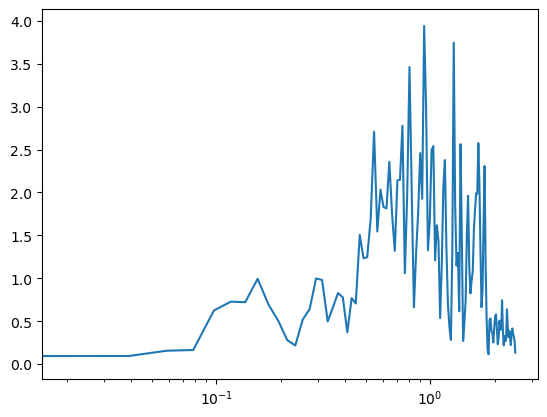

In [71]:
plt.plot(spectrum_results.loc[spectrum_results['sec_id'] == 74]['frequency'], spectrum_results.loc[spectrum_results['sec_id'] == 74]['psd'])
plt.xscale('log')

In [433]:
results.to_csv('acc_z_rms_cat_all.csv',index=False)

In [72]:
spectrum_results.to_csv('acc_z_spectrum_cat_all.csv',index=False)

# do analysis

74 1.781639937389049
74 -124.09690856933592 46.23755645751953 2019-09-01T14:48:10.200000000
76 0.7818460572267252
76 -124.03533935546876 46.23326873779297 2019-09-01T16:51:17.190000000
80 1.3271916553437593
80 -124.11333465576172 46.26808547973633 2019-09-01T23:11:00.190000000
87 0.7047215517084552
87 -124.0851364135742 46.3001823425293 2019-09-02T14:47:10.800000000
88 0.5282368038072648
88 -124.17459106445312 46.29806900024414 2019-09-02T15:50:02.200000000
89 0.7809232783768897
89 -124.17279815673828 46.26850128173828 2019-09-02T16:53:30.190000000
90 0.515647865930437
90 -124.03707122802734 46.23532485961913 2019-09-02T17:57:16.190000000
  sec_id            rms_accz             accz_g_x           accz_g_y  \
0     74   1.781639937389049  -124.09690856933592  46.23755645751953   
1     76  0.7818460572267252  -124.03533935546876  46.23326873779297   
2     80  1.3271916553437593  -124.11333465576172  46.26808547973633   
3     87  0.7047215517084552   -124.0851364135742   46.3001823425

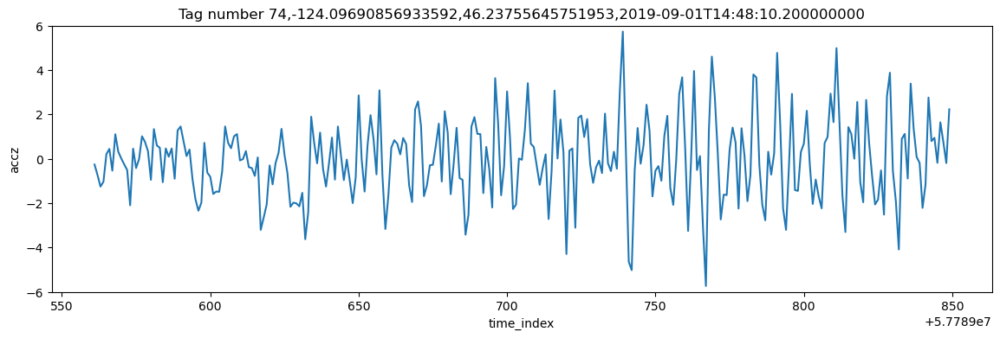

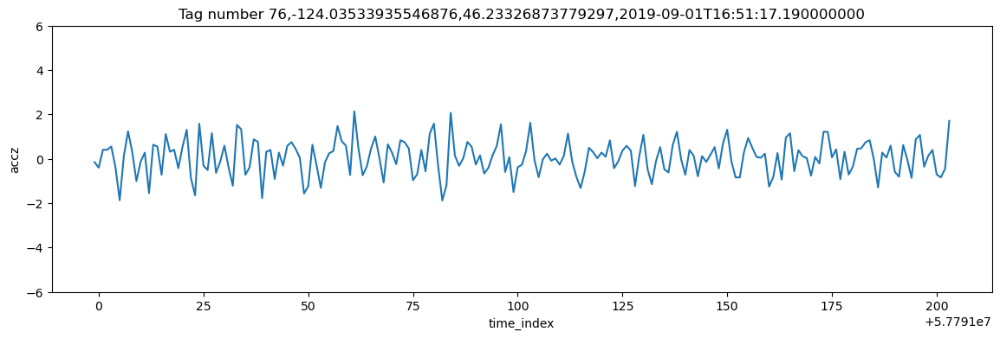

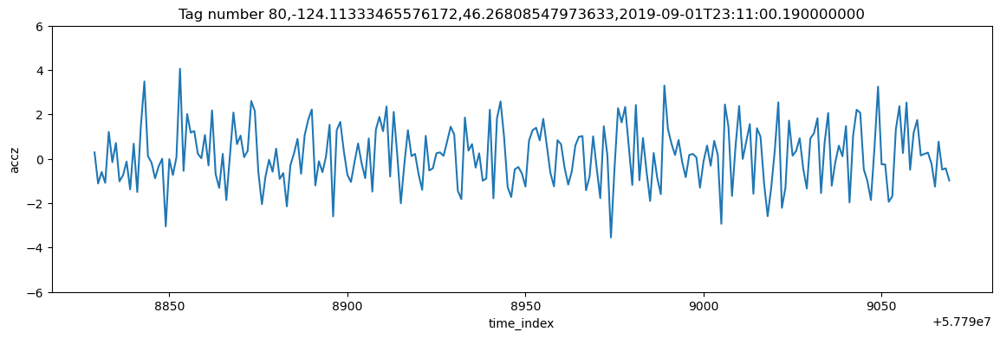

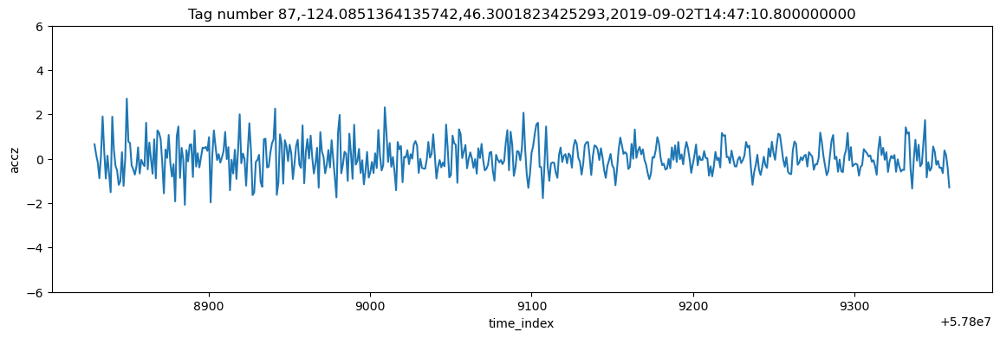

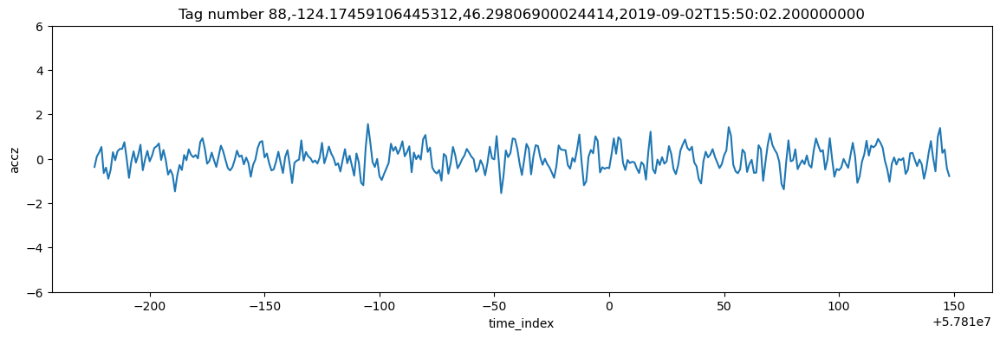

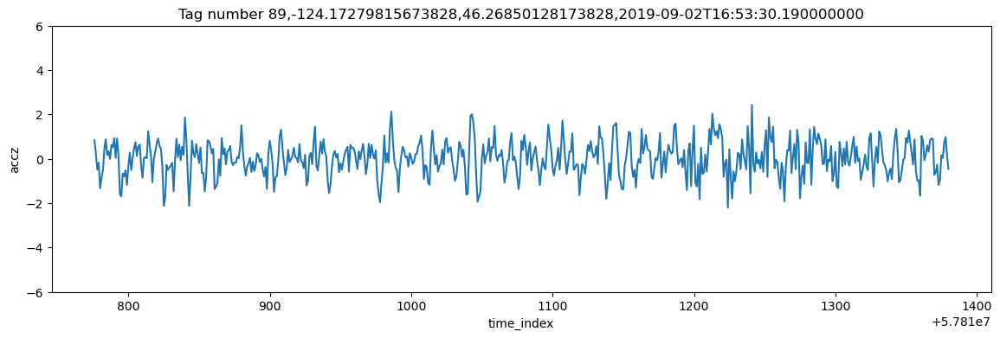

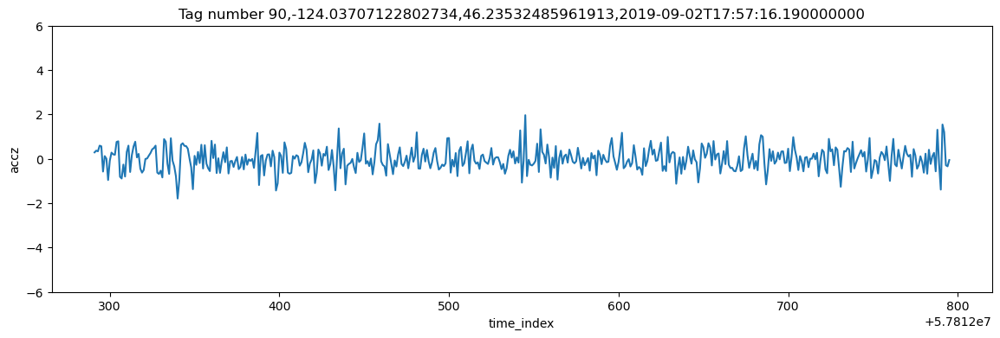

In [23]:
data_point_1 = ds_obs.where(ds_obs.id==191989, drop=True)
# Create a DataFrame to store the results
results = pd.DataFrame(columns=['sec_id','rms_accz', 'accz_g_x', 'accz_g_y', 'accz_g_t'])

for ik in [74, 76, 80, 87, 88, 89, 90]:
    accz_g = data_point_1.where(ds_obs.mask2==ik)
    if ik==74:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-01 14:48:10'))&(accz_g.original_time<pd.to_datetime('2019-09-01 14:49:10')),drop=True)
    elif ik==76:
        accz_g = accz_g.where((accz_g.original_time<pd.to_datetime('2019-09-01 16:52:00')),drop=True)
    elif ik==80:    
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-01 23:11:00')),drop=True)
    elif ik==88:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-08-01 23:11:00')),drop=True)
    elif ik==87:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-02 14:47:10')) & (accz_g.original_time<pd.to_datetime('2019-09-02 14:49:00')),drop=True)
    elif ik==89:
        accz_g = accz_g.where(accz_g.original_time>pd.to_datetime('2019-09-02 16:53:30'),drop=True)
    elif ik==90:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-02 17:57:16')) & (accz_g.original_time<pd.to_datetime('2019-09-02 17:59:00')),drop=True)
    accz_g_x = accz_g.x1[0]
    accz_g_y = accz_g.y1[0]
    accz_g_t = accz_g.original_time[0]
    accz_g = (accz_g.accz-1000)/1000*9.81
    plt.figure(figsize=(14,4))
    accz_g.plot()
    plt.title(f'Tag number {ik},{accz_g_x.values},{accz_g_y.values},{accz_g_t.values}')
    plt.ylim(-6,6)
    # std_accz = np.std(accz_g)
    rms_accz = np.sqrt(np.mean(accz_g**2))
    print(ik,rms_accz.values )
    print(ik, accz_g_x.values, accz_g_y.values, accz_g_t.values)

    # Append the results to the DataFrame using pd.concat
    results = pd.concat([results, pd.DataFrame({
        'sec_id': [ik],
        'rms_accz': [rms_accz.values],
        'accz_g_x': [accz_g_x.values],
        'accz_g_y': [accz_g_y.values],
        'accz_g_t': [accz_g_t.values]
    })], ignore_index=True)

print(results)
    # print(ik, std_accz.values )
# data_point_1.where(ds_obs.mask2==74).accz.plot()
# 74 -16
# 76 -7
# 80 -8
# 87 -10
# 88 -31
# 89 -15
# 90 -6





74 1.781639937389049
74 -124.09690856933592 46.23755645751953 2019-09-01T14:48:10.200000000
RMS of filtered_accz00: 0.38674993535034424
76 0.7818460572267252
76 -124.03533935546876 46.23326873779297 2019-09-01T16:51:17.190000000
RMS of filtered_accz00: 0.2125572032578305
80 1.3271916553437593
80 -124.11333465576172 46.26808547973633 2019-09-01T23:11:00.190000000
RMS of filtered_accz00: 0.2365393260938898
87 0.7047215517084552
87 -124.0851364135742 46.3001823425293 2019-09-02T14:47:10.800000000
RMS of filtered_accz00: 0.14798184350296434
88 0.5282368038072648
88 -124.17459106445312 46.29806900024414 2019-09-02T15:50:02.200000000
RMS of filtered_accz00: 0.11196346704873184
89 0.7809232783768897
89 -124.17279815673828 46.26850128173828 2019-09-02T16:53:30.190000000
RMS of filtered_accz00: 0.16350889502720142
90 0.515647865930437
90 -124.03707122802734 46.23532485961913 2019-09-02T17:57:16.190000000
RMS of filtered_accz00: 0.07213797098818774


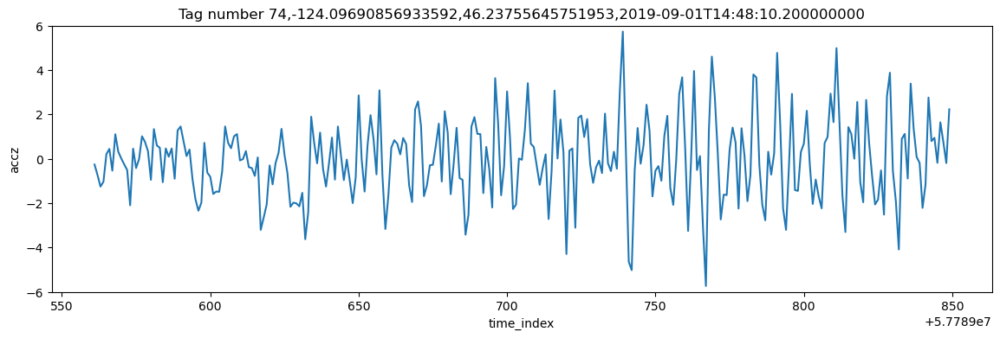

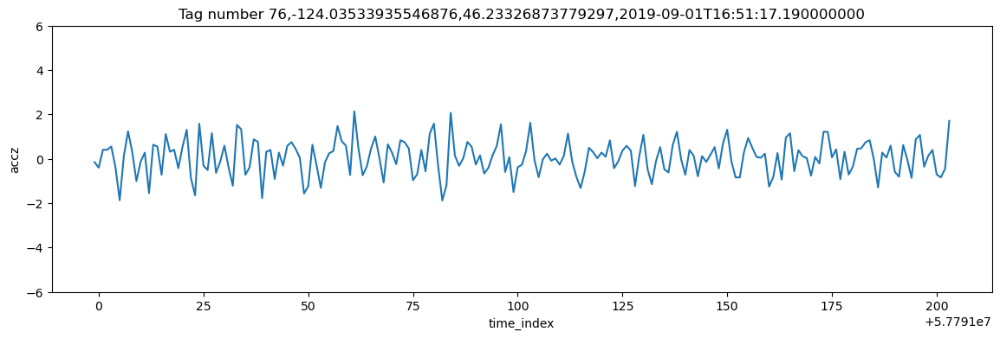

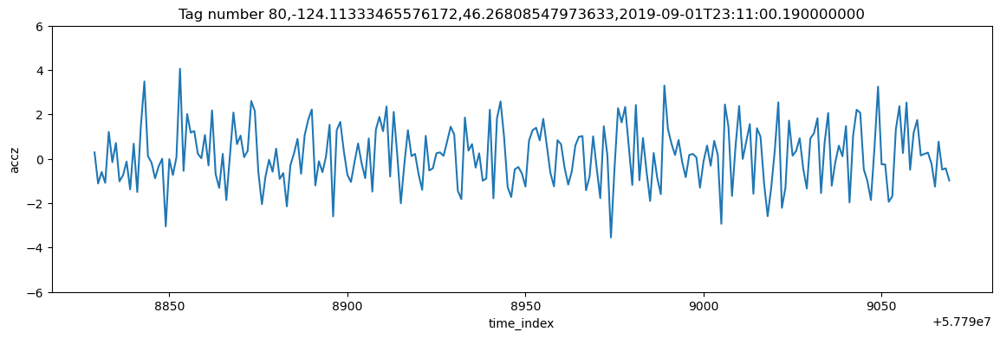

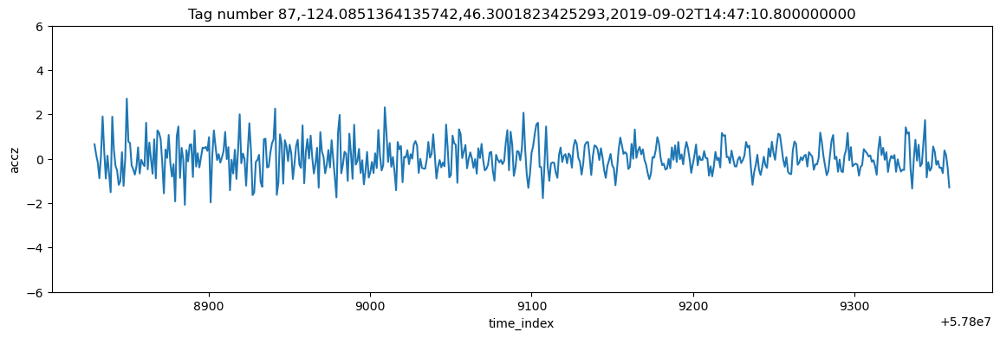

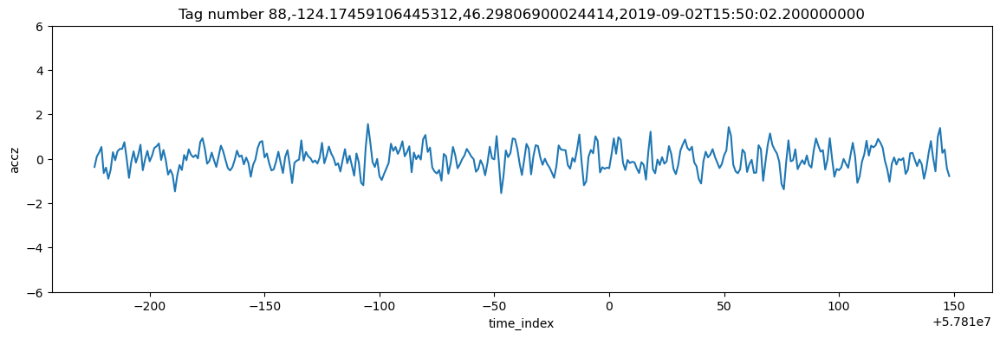

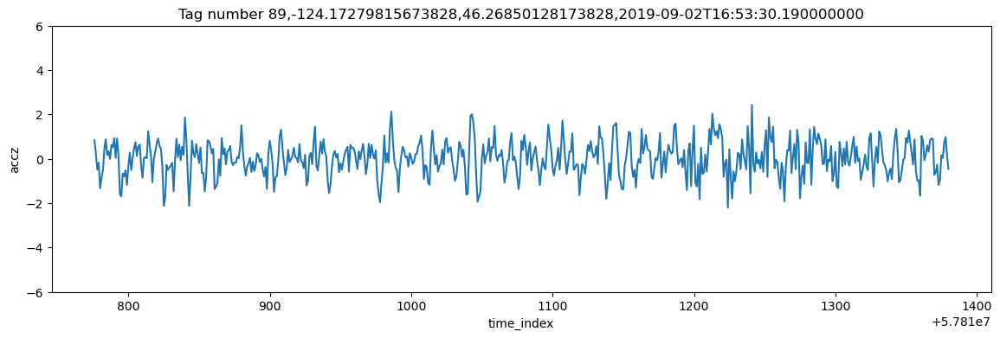

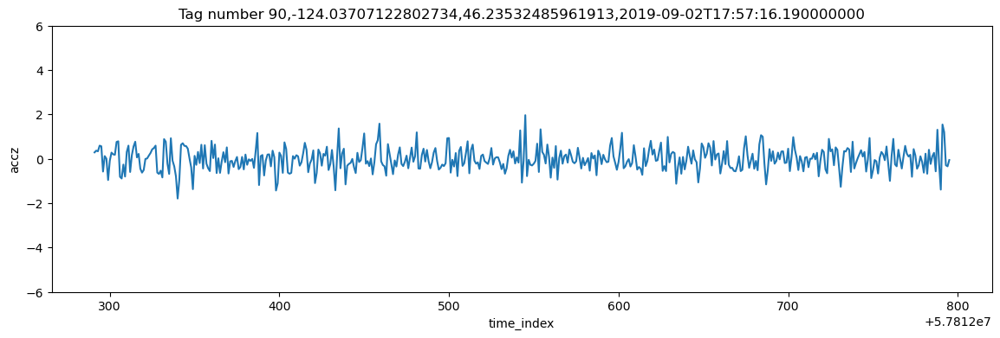

In [304]:
from scipy.signal import butter, filtfilt

# filter ###
# 定义低通滤波器
def lowpass_filter(data, cutoff_frequency, sampling_frequency):
    nyquist_frequency = 0.5 * sampling_frequency
    normal_cutoff = cutoff_frequency / nyquist_frequency
    b, a = butter(1, normal_cutoff, btype='low', analog=False)
    filtered_data = filtfilt(b, a, data)
    return filtered_data

# 对 accz00 应用低通滤波器
sampling_frequency = 5  # 5 Hz
cutoff_frequency = 0.157  # 1 Hz

data_point_1 = ds_obs.where(ds_obs.id==191989, drop=True)
for ik in [74, 76, 80, 87, 88, 89, 90]:
    accz_g = data_point_1.where(ds_obs.mask2==ik)
    if ik==74:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-01 14:48:10'))&(accz_g.original_time<pd.to_datetime('2019-09-01 14:49:10')),drop=True)
    elif ik==76:
        accz_g = accz_g.where((accz_g.original_time<pd.to_datetime('2019-09-01 16:52:00')),drop=True)
    elif ik==80:    
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-01 23:11:00')),drop=True)
    elif ik==88:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-08-01 23:11:00')),drop=True)
    elif ik==87:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-02 14:47:10')) & (accz_g.original_time<pd.to_datetime('2019-09-02 14:49:00')),drop=True)
    elif ik==89:
        accz_g = accz_g.where(accz_g.original_time>pd.to_datetime('2019-09-02 16:53:30'),drop=True)
    elif ik==90:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-02 17:57:16')) & (accz_g.original_time<pd.to_datetime('2019-09-02 17:59:00')),drop=True)
    accz_g_x = accz_g.x1[0]
    accz_g_y = accz_g.y1[0]
    accz_g_t = accz_g.original_time[0]
    accz_g = (accz_g.accz-1000)/1000*9.81
    filtered_accz00 = lowpass_filter(accz_g, cutoff_frequency, sampling_frequency)

    plt.figure(figsize=(14,4))
    accz_g.plot()
    plt.title(f'Tag number {ik},{accz_g_x.values},{accz_g_y.values},{accz_g_t.values}')
    plt.ylim(-6,6)
    # std_accz = np.std(accz_g)
    rms_accz = np.sqrt(np.mean(accz_g**2))
    print(ik,rms_accz.values )
    print(ik, accz_g_x.values, accz_g_y.values, accz_g_t.values)
    rms_accz_filtered = np.sqrt(np.mean(filtered_accz00**2))
    print(f'RMS of filtered_accz00: {rms_accz_filtered}')
    
    results_filter = pd.concat([results, pd.DataFrame({
        'sec_id': [ik],
        'rms_accz': [rms_accz.values],
        'accz_g_x': [accz_g_x.values],
        'accz_g_y': [accz_g_y.values],
        'accz_g_t': [accz_g_t.values]
    })], ignore_index=True)
    # print(ik, std_accz.values )
# data_point_1.where(ds_obs.mask2==74).accz.plot()
# 74 -16
# 76 -7
# 80 -8
# 87 -10
# 88 -31
# 89 -15
# 90 -6

66 1.3120214971631556
67 1.3822611683500814
68 0.98342670577053
69 1.1542399155694936
   sec_id            rms_accz             accz_g_x            accz_g_y  \
0      74   1.781639937389049  -124.09690856933592   46.23755645751953   
1      76  0.7818460572267252  -124.03533935546876   46.23326873779297   
2      80  1.3271916553437593  -124.11333465576172   46.26808547973633   
3      87  0.7047215517084552   -124.0851364135742    46.3001823425293   
4      88  0.5282368038072648  -124.17459106445312   46.29806900024414   
5      89  0.7809232783768897  -124.17279815673828   46.26850128173828   
6      90   0.515647865930437  -124.03707122802734   46.23532485961913   
7      66  1.3120214971631556  -124.06737518310544  46.233745574951165   
8      67  1.3822611683500814   -124.0947494506836   46.27508163452149   
9      68    0.98342670577053   -124.1066665649414    46.3586311340332   
10     69  1.1542399155694936   -124.0953140258789    46.3894920349121   

                  accz_g_

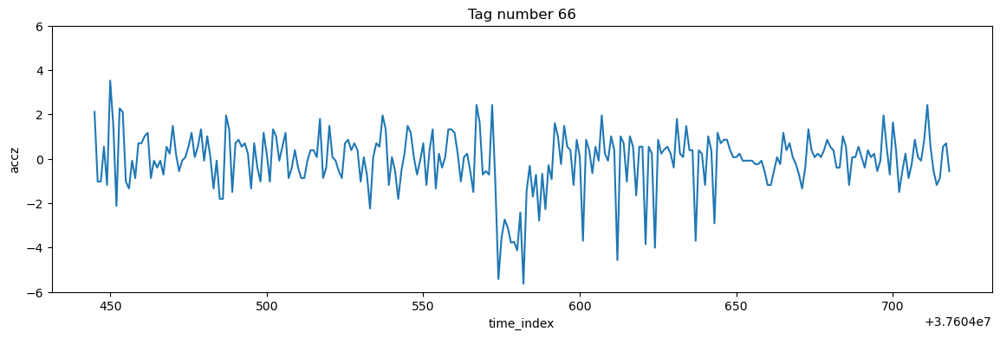

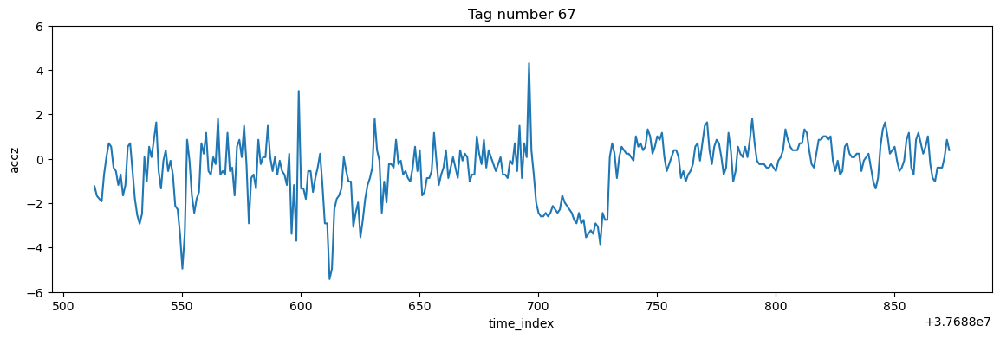

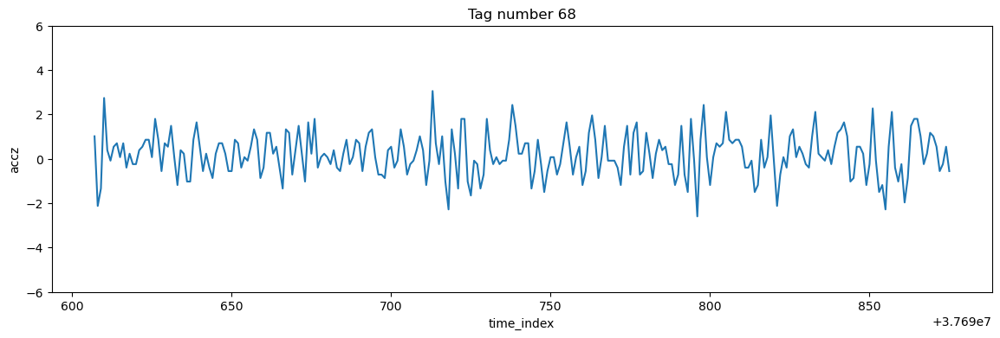

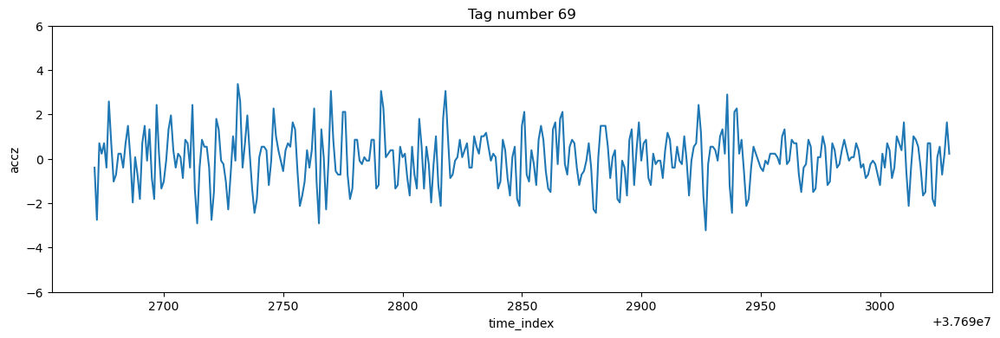

In [24]:
# No. 191991
data_point_1 = ds_obs.where(ds_obs.id==191991, drop=True)

for ik in [66, 67, 68, 69]:
    accz_g = data_point_1.where(ds_obs.mask2==ik)
    if ik==66:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-03 20:54:40')),drop=True)
    elif ik==67:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-11 14:43:54')) & (accz_g.original_time<pd.to_datetime('2019-09-11 14:45:10')),drop=True)
    elif ik==68:
        accz_g = accz_g.where((accz_g.original_time<pd.to_datetime('2019-09-11 15:48:28')),drop=True)
    elif ik==69:    
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-11 16:52:15'))&(accz_g.original_time<pd.to_datetime('2019-09-11 16:53:30')),drop=True)
    # elif ik==89:
    #     accz_g = accz_g.where(accz_g.original_time>pd.to_datetime('2019-09-02 16:53:30'),drop=True)
    # elif ik==90:
    #     accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-02 17:57:16')) & (accz_g.original_time<pd.to_datetime('2019-09-02 17:59:00')),drop=True)
    accz_g_x = accz_g.x1[0]
    accz_g_y = accz_g.y1[0]
    accz_g_t = accz_g.original_time[0]
    accz_g = (accz_g.accz-1000)/1000*9.81
    plt.figure(figsize=(14,4))
    accz_g.plot()
    plt.title(f'Tag number {ik}')
    plt.ylim(-6,6)
    # std_accz = np.std(accz_g)
    rms_accz = np.sqrt(np.mean(accz_g**2))
    print(ik,rms_accz.values )
    # Append the results to the DataFrame using pd.concat
    results = pd.concat([results, pd.DataFrame({
        'sec_id': [ik],
        'rms_accz': [rms_accz.values],
        'accz_g_x': [accz_g_x.values],
        'accz_g_y': [accz_g_y.values],
        'accz_g_t': [accz_g_t.values]
    })], ignore_index=True)
print(results)
    # print(ik, std_accz.values )
# data_point_1.where(ds_obs.mask2==74).accz.plot()

10 0.8317698565773401
11 0.8414519683746197
12 0.9234538503854989
13 1.2721247760322099
16 1.5176582839045427


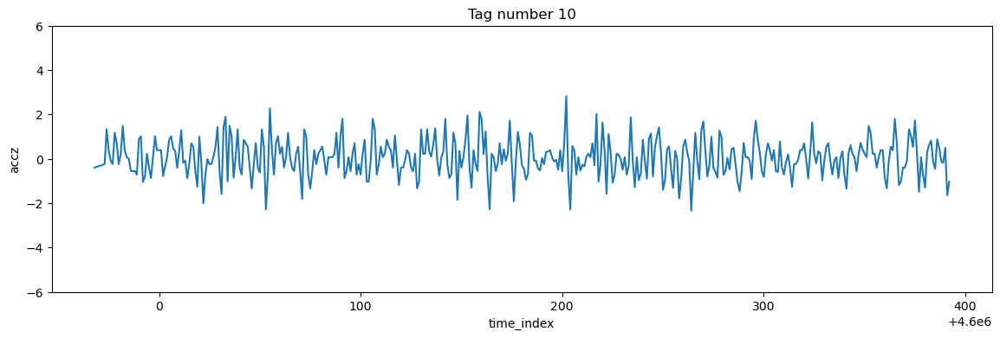

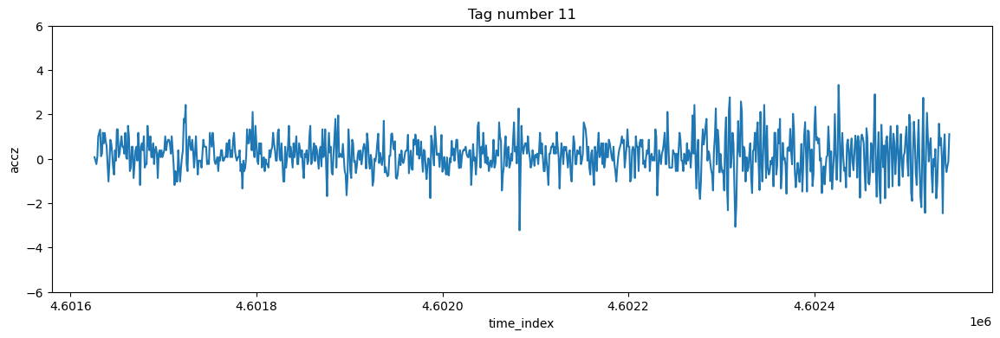

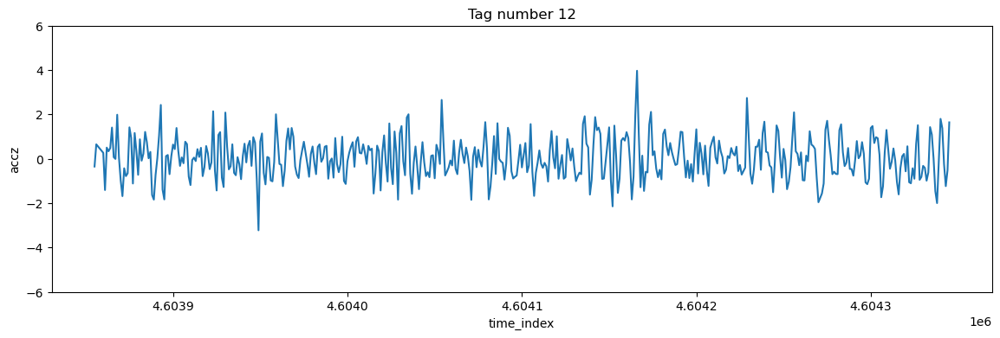

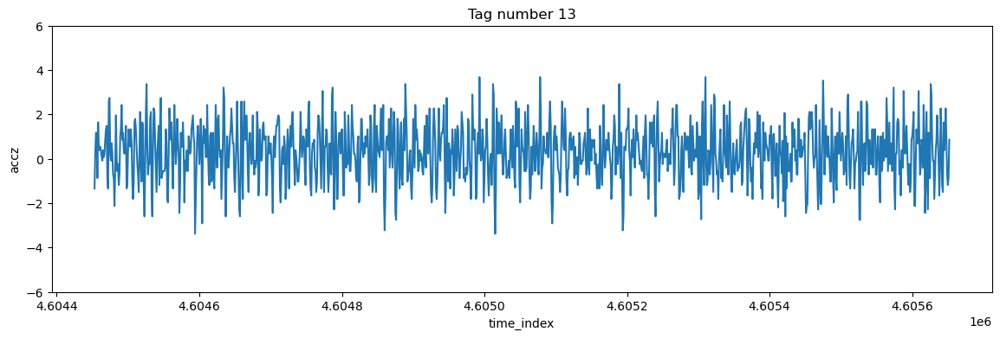

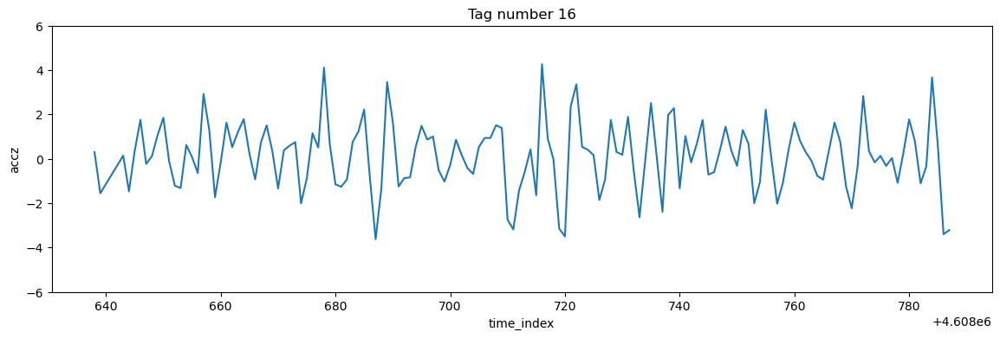

In [25]:
# No. 191995
data_point_1 = ds_obs.where(ds_obs.id==191995, drop=True)

for ik in [10, 11, 12, 13, 16]:
    accz_g = data_point_1.where(ds_obs.mask2==ik)
    if ik==10:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-06-15 13:13:40')),drop=True)
    elif ik==11:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-06-15 14:15:05')) ,drop=True)
    elif ik==12:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-06-15 15:19:05')) ,drop=True)
    elif ik==13:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-06-15 16:21:05')) ,drop=True)
    # elif ik==68:
    #     accz_g = accz_g.where((accz_g.original_time<pd.to_datetime('2019-09-11 15:48:28')),drop=True)
    elif ik==16:    
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-06-15 19:33:15'))&(accz_g.original_time<pd.to_datetime('2019-06-15 19:33:45')),drop=True)
    # elif ik==89:
    #     accz_g = accz_g.where(accz_g.original_time>pd.to_datetime('2019-09-02 16:53:30'),drop=True)
    # elif ik==90:
    #     accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-02 17:57:16')) & (accz_g.original_time<pd.to_datetime('2019-09-02 17:59:00')),drop=True)
    accz_g_x = accz_g.x1[0]
    accz_g_y = accz_g.y1[0]
    accz_g_t = accz_g.original_time[0]
    accz_g = (accz_g.accz-1000)/1000*9.81
    plt.figure(figsize=(14,4))
    accz_g.plot()
    plt.title(f'Tag number {ik}')
    plt.ylim(-6,6)
    # std_accz = np.std(accz_g)
    rms_accz = np.sqrt(np.mean(accz_g**2))
    print(ik,rms_accz.values )

    # Append the results to the DataFrame using pd.concat
    results = pd.concat([results, pd.DataFrame({
        'sec_id': [ik],
        'rms_accz': [rms_accz.values],
        'accz_g_x': [accz_g_x.values],
        'accz_g_y': [accz_g_y.values],
        'accz_g_t': [accz_g_t.values]
    })], ignore_index=True)

235 0.557811676675863
238 1.9141906691509607
241 1.1957904753929127
   sec_id            rms_accz             accz_g_x            accz_g_y  \
0      74   1.781639937389049  -124.09690856933592   46.23755645751953   
1      76  0.7818460572267252  -124.03533935546876   46.23326873779297   
2      80  1.3271916553437593  -124.11333465576172   46.26808547973633   
3      87  0.7047215517084552   -124.0851364135742    46.3001823425293   
4      88  0.5282368038072648  -124.17459106445312   46.29806900024414   
5      89  0.7809232783768897  -124.17279815673828   46.26850128173828   
6      90   0.515647865930437  -124.03707122802734   46.23532485961913   
7      66  1.3120214971631556  -124.06737518310544  46.233745574951165   
8      67  1.3822611683500814   -124.0947494506836   46.27508163452149   
9      68    0.98342670577053   -124.1066665649414    46.3586311340332   
10     69  1.1542399155694936   -124.0953140258789    46.3894920349121   
11     10  0.8317698565773401  -124.03298950

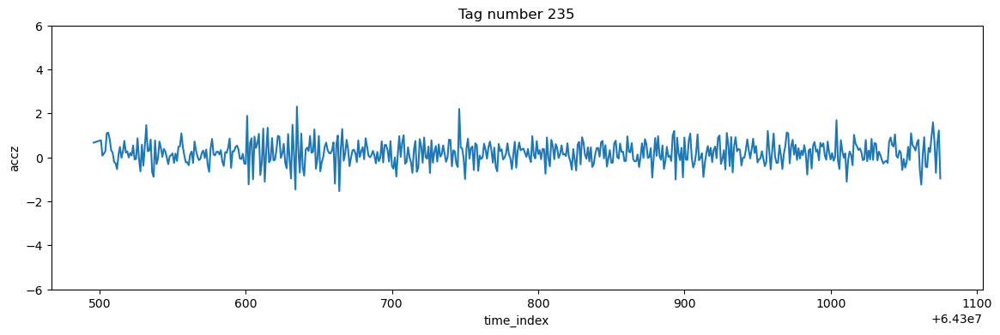

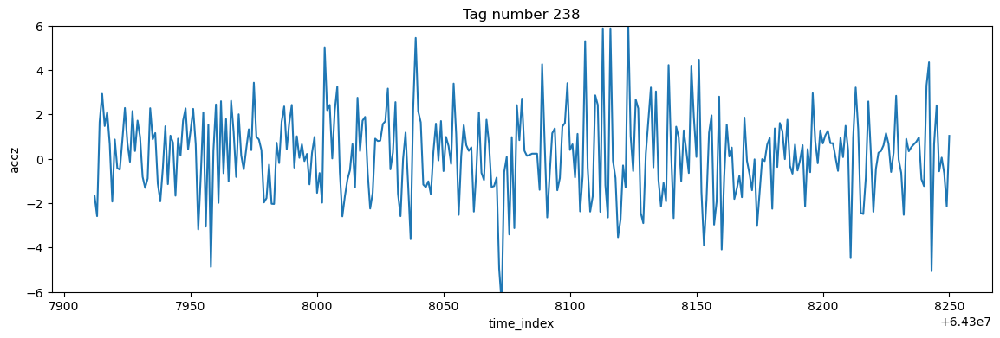

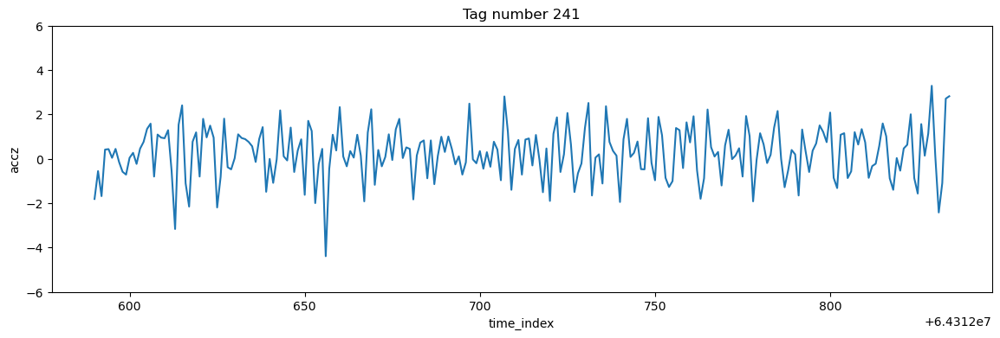

In [26]:
# No. 192759
data_point_1 = ds_obs.where(ds_obs.id==192759, drop=True)

for ik in [235, 238, 241]:
    accz_g = data_point_1.where(ds_obs.mask2==ik)
    if ik==235:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-27 22:18:30'))&(accz_g.original_time<pd.to_datetime('2019-09-27 22:20:30')),drop=True)
    elif ik==238:
        accz_g = accz_g.where((accz_g.original_time<pd.to_datetime('2019-09-28 17:24:50')) ,drop=True)
    elif ik==241:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-28 20:39:19')),drop=True)
    # elif ik==16:    
    #     accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-06-15 19:33:15'))&(accz_g.original_time<pd.to_datetime('2019-06-15 19:33:45')),drop=True)
    # elif ik==89:
    #     accz_g = accz_g.where(accz_g.original_time>pd.to_datetime('2019-09-02 16:53:30'),drop=True)
    # elif ik==90:
    #     accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-02 17:57:16')) & (accz_g.original_time<pd.to_datetime('2019-09-02 17:59:00')),drop=True)
    accz_g_x = accz_g.x1[0]
    accz_g_y = accz_g.y1[0]
    accz_g_t = accz_g.original_time[0]
    accz_g = (accz_g.accz-1000)/1000*9.81
    plt.figure(figsize=(14,4))
    accz_g.plot()
    plt.title(f'Tag number {ik}')
    plt.ylim(-6,6)
    # std_accz = np.std(accz_g)
    rms_accz = np.sqrt(np.mean(accz_g**2))
    print(ik,rms_accz.values )

    # Append the results to the DataFrame using pd.concat
    results = pd.concat([results, pd.DataFrame({
        'sec_id': [ik],
        'rms_accz': [rms_accz.values],
        'accz_g_x': [accz_g_x.values],
        'accz_g_y': [accz_g_y.values],
        'accz_g_t': [accz_g_t.values]
    })], ignore_index=True)
print(results)

92 1.2580112658152964
95 1.1013794388393368
106 1.4708508980854416
108 0.9579206835802061
109 1.250434898628011
114 3.541563273162342
120 0.9623099153108109
121 5.081219482336844
124 0.9026942545255633
126 1.3042363332981488
128 0.9883246572338887
137 1.0660354569934403
138 3.153154022931286
146 0.8985196015558036


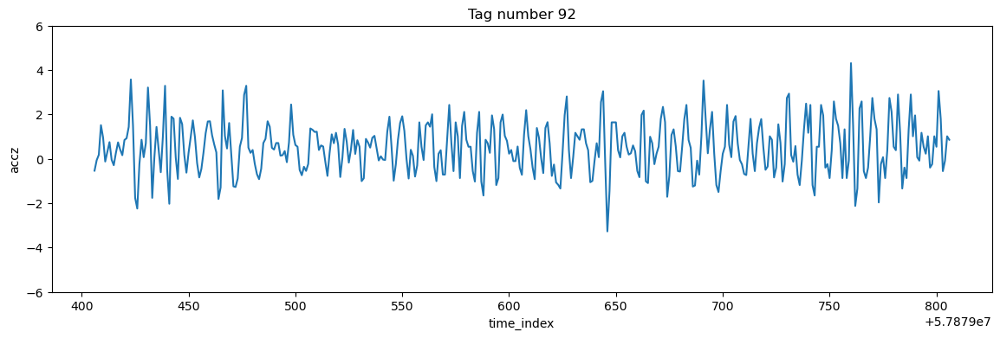

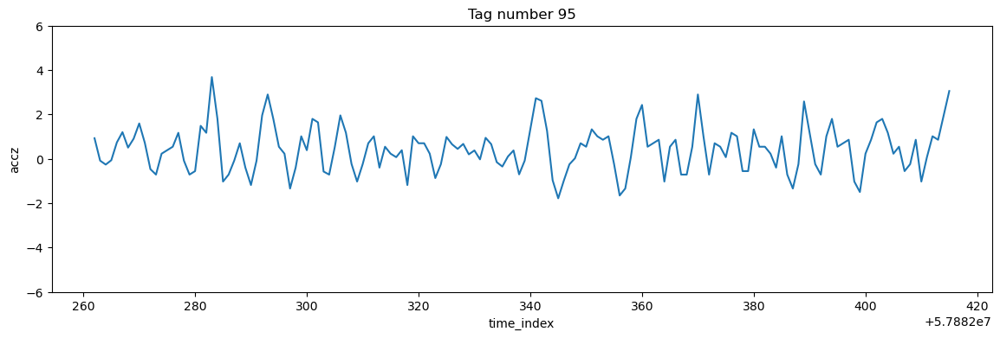

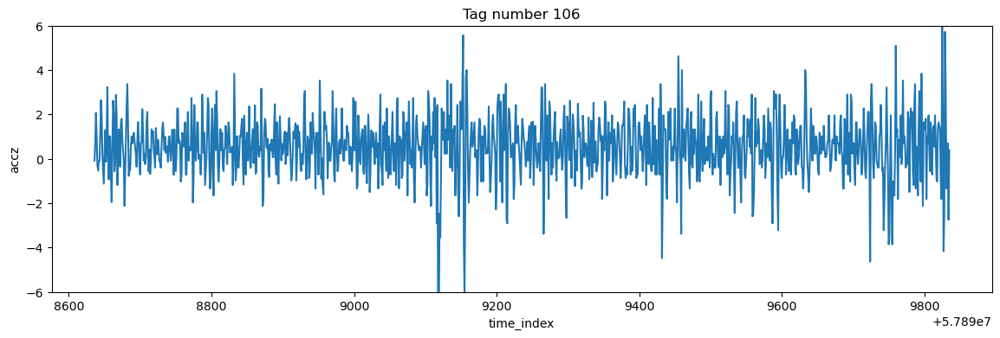

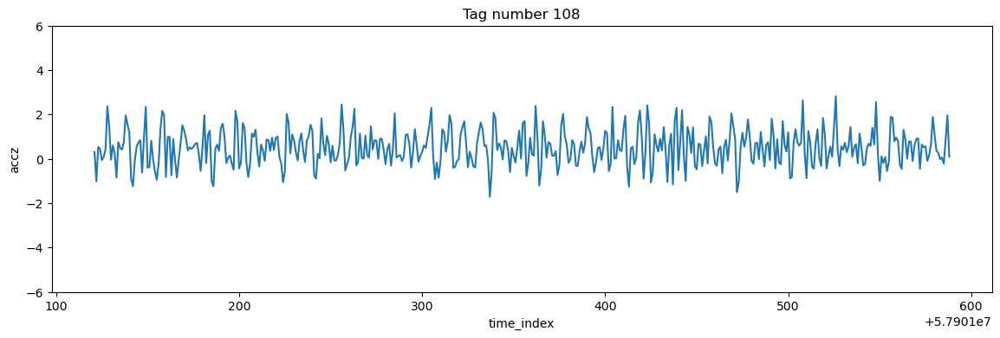

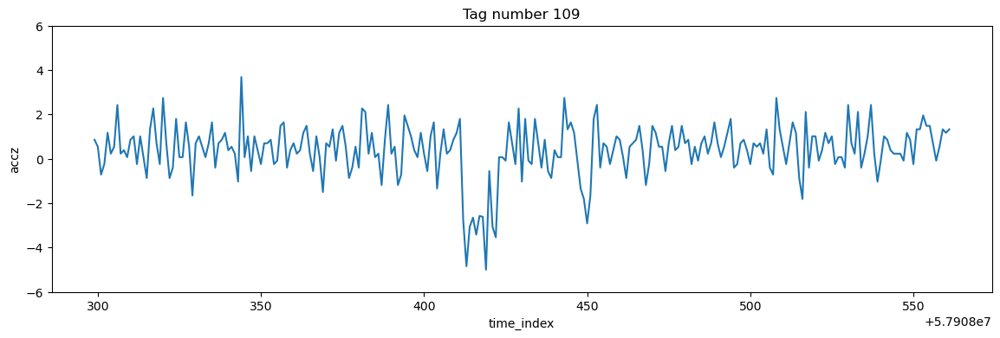

...

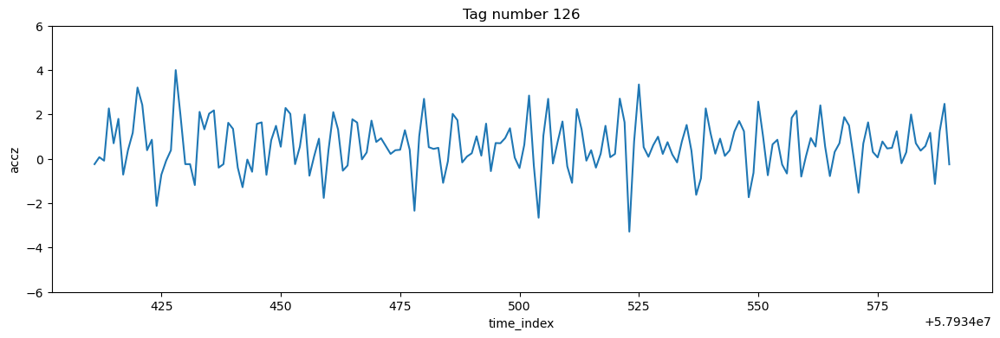

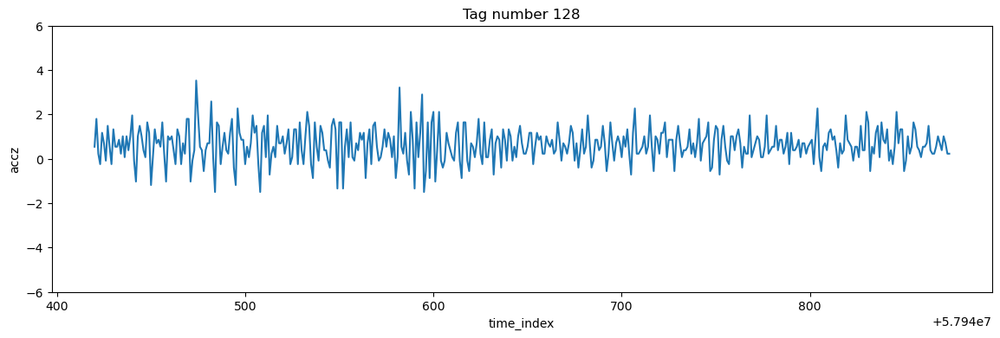

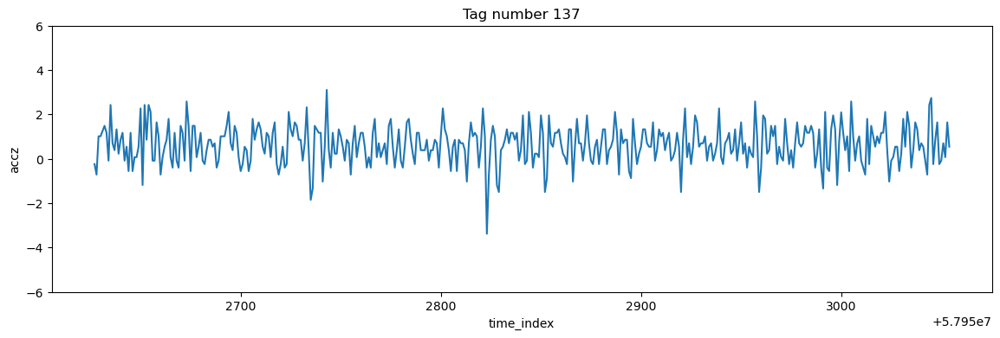

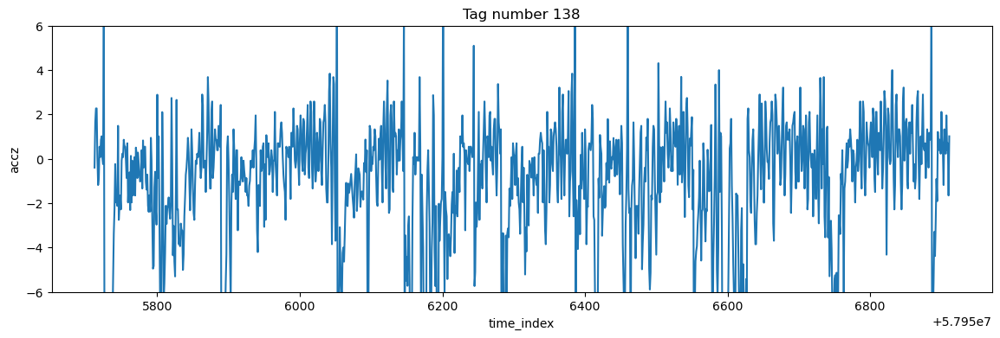

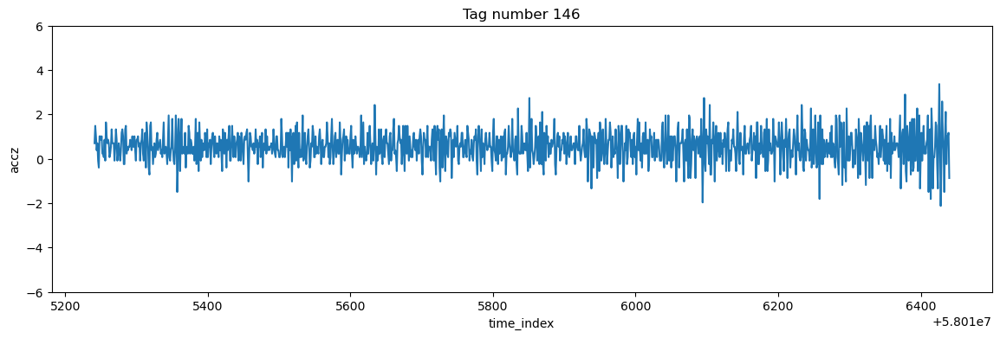

In [27]:
# No. 192762
data_point_1 = ds_obs.where(ds_obs.id==192762, drop=True)

for ik in [92, 95, 106, 108, 109, 114, 120, 121, 124, 126, 128, 137, 138, 146, ]:
    accz_g = data_point_1.where(ds_obs.mask2==ik)
    if (ik==92)|(ik==106)|(ik==108)|(ik==114)|(ik==120)|(ik==121)|(ik==138)|(ik==146):
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-22 16:14:07')) ,drop=True)
    elif ik==95:
        accz_g = accz_g.where((accz_g.original_time<pd.to_datetime('2019-09-22 19:21:07')) ,drop=True)
    elif ik==109:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-24 15:13:31'))&(accz_g.original_time<pd.to_datetime('2019-09-24 15:14:25')),drop=True)
    elif ik==128:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-26 16:20:05')),drop=True)
    elif ik==124:    
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-25 21:37:45'))&(accz_g.original_time<pd.to_datetime('2019-09-25 21:39:00')),drop=True)
    elif ik==126:
        accz_g = accz_g.where(accz_g.original_time>pd.to_datetime('2019-09-25 23:52:45'),drop=True)
    elif ik==137:
        accz_g = accz_g.where((accz_g.original_time>pd.to_datetime('2019-09-27 14:33:47')) & (accz_g.original_time<pd.to_datetime('2019-09-27 14:35:15')),drop=True)
    accz_g_x = accz_g.x1[0]
    accz_g_y = accz_g.y1[0]
    accz_g_t = accz_g.original_time[0]
    accz_g = (accz_g.accz-1000)/1000*9.81
    plt.figure(figsize=(14,4))
    accz_g.plot()
    plt.title(f'Tag number {ik}')
    plt.ylim(-6,6)
    # std_accz = np.std(accz_g)
    rms_accz = np.sqrt(np.mean(accz_g**2))
    print(ik,rms_accz.values )

    # Append the results to the DataFrame using pd.concat
    results = pd.concat([results, pd.DataFrame({
        'sec_id': [ik],
        'rms_accz': [rms_accz.values],
        'accz_g_x': [accz_g_x.values],
        'accz_g_y': [accz_g_y.values],
        'accz_g_t': [accz_g_t.values]
    })], ignore_index=True)

In [30]:
results.to_csv(wrk_dir+'rms_accz.csv')

In [ ]:
import ee

# Authenticate and initialize the Earth Engine module.
ee.Authenticate()
ee.Initialize()

# Define a function to get bathymetry data from Google Earth Engine
def get_bathymetry(lat, lon):
    point = ee.Geometry.Point(lon, lat)
    bathymetry = ee.Image('NOAA/NGDC/ETOPO1').select('bedrock')
    depth = bathymetry.reduceRegion(
        reducer=ee.Reducer.mean(),
        geometry=point,
        scale=1000
    ).get('bedrock').getInfo()
    return depth

# Example usage
lat = 46.23755645751953
lon = -124.09690856933592
depth = get_bathymetry(lat, lon)
print(f"Water depth at ({lat}, {lon}): {depth} meters")

In [287]:
# load bathymetry data
bath1 = loadmat('work/GETM/scripts_ms2/waves_analysis/S0313WO_NAVD88_UTM10_5m.mat')

In [ ]:
# Extract depth data from bath1
depth_data = bath1['depth']

# If you want to visualize the depth data
plt.figure(figsize=(10, 8))
plt.imshow(depth_data, cmap='viridis')
plt.colorbar(label='Depth (m)')
plt.title('Bathymetry Depth Data')
plt.xlabel('Longitude Index')
plt.ylabel('Latitude Index')
plt.show()

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Wed Sep 11 09:24:55 2013',
 '__version__': '1.0',
 '__globals__': [],
 'dem': array([[(array([[nan, nan, nan, ..., nan, nan, nan],
                [nan, nan, nan, ..., nan, nan, nan],
                [nan, nan, nan, ..., nan, nan, nan],
                ...,
                [nan, nan, nan, ..., nan, nan, nan],
                [nan, nan, nan, ..., nan, nan, nan],
                [nan, nan, nan, ..., nan, nan, nan]]), array([[414026.39, 414031.39, 414036.39, ..., 429171.39, 429176.39,
                 429181.39],
                [414026.39, 414031.39, 414036.39, ..., 429171.39, 429176.39,
                 429181.39],
                [414026.39, 414031.39, 414036.39, ..., 429171.39, 429176.39,
                 429181.39],
                ...,
                [414026.39, 414031.39, 414036.39, ..., 429171.39, 429176.39,
                 429181.39],
                [414026.39, 414031.39, 414036.39, ..., 429171.39, 429176.39,

: 

In [77]:
bath1 = xr.open_dataset(wrk_dir+'GEBCO_2021_sub_ice_topo.nc')
bath1

<xarray.Dataset>
Dimensions:    (lon: 86400, lat: 43200)
Coordinates:
  * lon        (lon) float64 -180.0 -180.0 -180.0 -180.0 ... 180.0 180.0 180.0
  * lat        (lat) float64 -90.0 -89.99 -89.99 -89.99 ... 89.99 89.99 90.0
Data variables:
    crs        |S1 ...
    elevation  (lat, lon) int16 ...
Attributes: (12/36)
    title:                           The GEBCO_2021 Grid - a continuous terra...
    summary:                         The GEBCO_2021 Grid is a continuous, glo...
    keywords:                        BATHYMETRY/SEAFLOOR TOPOGRAPHY, DIGITAL ...
    Conventions:                     CF-1.6, ACDD-1.3
    id:                              DOI: 10.5285/c6612cbe-50b3-0cff-e053-6c8...
    naming_authority:                https://dx.doi.org
    ...                              ...
    geospatial_vertical_units:       meters
    geospatial_vertical_resolution:  1.0
    geospatial_vertical_positive:    up
    identifier_product_doi:          DOI: 10.5285/c6612cbe-50b3-0cff-e053-6c8...
    references:                      DOI: 10.5285/c6612cbe-50b3-0cff-e053-6c8...
    node_offset:                     1.0

In [ ]:
from scipy.interpolate import griddata

# Extract the coordinates and elevation data from bath1
lon = bath1.lon
lat = bath1.lat.values
elevation = bath1.elevation.values

# Create a meshgrid for interpolation
lon_grid, lat_grid = np.meshgrid(lon, lat)

# Interpolate the bathymetry for each point in results
results['bathymetry'] = griddata(
    (lon_grid.flatten(), lat_grid.flatten()), 
    elevation.flatten(), 
    (results['accz_g_x'].astype(float), results['accz_g_y'].astype(float)), 
    method='linear'
)

print(results)

: 

: 

: 

In [21]:
ds_obs

<xarray.Dataset>
Dimensions:        (time_index: 73731840)
Coordinates:
  * time_index     (time_index) int64 0 1 2 3 ... 73731837 73731838 73731839
Data variables: (12/14)
    id             (time_index) int64 192000 192000 192000 ... 192758 192758
    accx           (time_index) float64 ...
    accy           (time_index) float64 ...
    accz           (time_index) float64 ...
    lon            (time_index) float64 ...
    lat            (time_index) float64 ...
    ...             ...
    mask           (time_index) float64 nan nan nan nan nan ... nan nan nan nan
    mask2          (time_index) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    x1             (time_index) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    y1             (time_index) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    x2             (time_index) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0
    y2             (time_index) float64 0.0 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0 0.0